In [1]:
import pandas as pd
import numpy as np
from sklearn import utils
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from numpy import zeros
from numpy import ones
from numpy import hstack
from numpy.random import rand
from numpy.random import randn
from keras.models import Sequential
from keras.layers import Dense
from keras.utils.vis_utils import plot_model
from matplotlib import pyplot
import matplotlib.pyplot as plt

In [2]:
real_sp = pd.read_csv("DodgerLoopGame\csv_result-DodgerLoopGame_TRAIN.csv")
print(real_sp)

#real data import
real_df = real_sp[['id_1']]
real_df2 = real_sp[['id_1']]
real_df2 = real_df2[:289]
real_df = real_df[:289]
#real_df2 = real_df2[:2000]
print(len(real_df2))
print(real_df2)
print(len(real_df))
print((real_df))
real_df.plot()

         id  id1   2   3   4   5  6   7   8   9  ...  14  15  16  17  18  19  \
0      att1    7   9  12  11  12  9   7   9  11  ...   3  11   5   6  16   7   
1      att2    3  11  18   9   9  5   4   5   7  ...  11   9   4   3  15   7   
2      att3    6   5  11  11  11  6   3   1  14  ...   3   7   6   6  13   6   
3      att4   11   7  11  12   7  4   5   4   5  ...   5   4   8   4  14   6   
4      att5    8  11  19   8  12  4   4   2   7  ...   1   4   2   8   8   8   
..      ...  ...  ..  ..  ..  .. ..  ..  ..  ..  ...  ..  ..  ..  ..  ..  ..   
284  att285    9   5   3  12   7  2  11  17  21  ...   1   3  12  17   2  19   
285  att286    5   8   6  13  11  2   5   9  18  ...   4   7   8  17   6  16   
286  att287   16   9   3   7   4  4   8  15   8  ...   9   6   3   9   6  16   
287  att288    8   6   6  11   9  9   6  11  15  ...   2   8   6  13   3  11   
288     NaN    1   1   1   1   1  1   1   1   1  ...   2   2   2   2   2   2   

     21  Unnamed: 21  id1_c  id2_copy  

KeyError: "None of [Index(['id_1'], dtype='object')] are in the [columns]"

In [3]:
# define the standalone discriminator model
def define_discriminator(n_inputs=1):
	model = Sequential()
	model.add(Dense(10, activation='relu', kernel_initializer='he_uniform', input_dim=n_inputs))
	model.add(Dense(1, activation='sigmoid'))
	# compile model
	model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
	return model

In [4]:
# define the standalone generator model
def define_generator(latent_dim, n_outputs=1):
	model = Sequential()
	model.add(Dense(10, activation='relu', kernel_initializer='he_uniform', input_dim=latent_dim))
	model.add(Dense(n_outputs, activation='linear'))
	return model

In [5]:
# define the combined generator and discriminator model, for updating the generator
def define_gan(generator, discriminator):
	# make weights in the discriminator not trainable
	discriminator.trainable = False
	# connect them
	model = Sequential()
	# add generator
	model.add(generator)
	# add the discriminator
	model.add(discriminator)
	# compile model
	model.compile(loss='binary_crossentropy', optimizer='adam')
	return model

In [6]:
# generate n real samples with class labels
def generate_real_samples(n):
    x1 = real_df[:n]
    #x1 = np.array(real_df[:(n+1)])
    x1 = np.array(x1)
    #X = x1
    X = x1.reshape(n,1)
    y = ones((n, 1)) 
    return X, y

In [7]:
def make_randomnum(x_input_):
    #make rand data (import tsc data)
    x_input=[]
    #for i in range(0,2000):
        #x_input_=np.append(x_input_,np.random.randint(1,3401))
    x2 = np.array(real_df2)
    #이 줄에서 시계열 데이터값을 지정해서 넣어줍니다.
    #x_input_=np.random.rand(x2)
    x_input_=np.append(x_input_,np.random.randint(x2))
    
    
    x_input = np.array(x_input_)
    x_input = np.array(x_input)
    return x_input
# generate points in latent space as input for the generator
def generate_latent_points(latent_dim, n):
    # generate points in the latent space
    x_input_=[]
    x_input_=make_randomnum(x_input_)
    #print(x_input_)
    x_input_ = x_input_.reshape(288, latent_dim)
    return x_input_

In [8]:
# use the generator to generate n fake examples, with class labels
def generate_fake_samples(generator, latent_dim, n):
	# generate points in latent space
	x_input = generate_latent_points(latent_dim, n)
	# predict outputs
	X = generator.predict(x_input)
	# create class labels
	y = zeros((n, 1))
	return X, y, x_input

In [9]:
# evaluate the discriminator and plot real and fake points
def summarize_performance(epoch, generator, discriminator, latent_dim, n=288):
	# prepare real samples
	x_real, y_real = generate_real_samples(n)
	# evaluate discriminator on real examples
	_, acc_real = discriminator.evaluate(x_real, y_real, verbose=0)
    
	# prepare fake examples
	x_fake, y_fake, x_fake_value = generate_fake_samples(generator, latent_dim, n)
	# evaluate discriminator on fake examples
	_, acc_fake = discriminator.evaluate(x_fake, y_fake, verbose=0)
    
	# summarize discriminator performance
	print(epoch, acc_real, acc_fake)
	# scatter plot real and fake data points
	plt.plot(x_real)
	plt.plot(x_fake)
	plt.show()
	return x_fake_value,acc_real,acc_fake

In [10]:
x_output=[]
def train(g_model, d_model, gan_model, latent_dim, n_epochs=100000, n_batch=288, n_eval=100):
    half_batch=288
    a=1
    for i in range(n_epochs):
        x_real, y_real = generate_real_samples(half_batch)
        x_fake, y_fake, x_fake_value = generate_fake_samples(g_model, latent_dim, half_batch)
        #x_output=[]
        d_model.train_on_batch(x_real, y_real)
        d_model.train_on_batch(x_fake, y_fake)
        x_gan=generate_latent_points(latent_dim, n_batch)
        y_gan=ones((n_batch, 1))
        gan_model.train_on_batch(x_gan, y_gan)
        if (i+1)%n_eval==0:
            x_output_, real_acc, fake_acc = summarize_performance(i, g_model, d_model, latent_dim)
            #_, acc_real = discriminator.evaluate(x_real, y_real, verbose=0)
            #_, acc_fake = discriminator.evaluate(x_fake, y_fake, verbose=0)
            #if fake_acc>=0.60 and real_acc>= 0.60:
            if real_acc>= 0.80:
                x_output=x_output_
                print(x_output)
                x_output=np.array(x_output)
                save_data=pd.DataFrame(x_output)
                save_data.to_csv('DodgerLoopDay/LoopDay/data/LoopD80100/Sunday/LoopDaylabel_Sunday_%d.csv'% (a), encoding='utf-8', index=False)
                a+=1

99 0.03125 0.8506944179534912


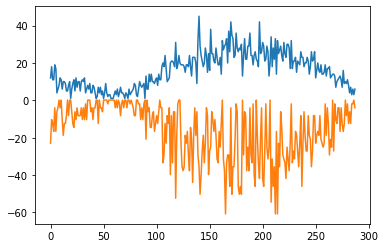

199 1.0 0.0


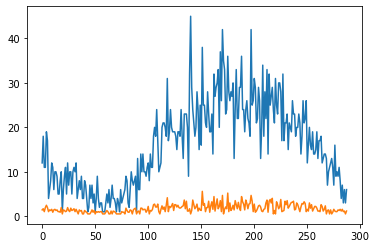

[[ 5.]
 [ 7.]
 [ 2.]
 [ 9.]
 [13.]
 [ 9.]
 [ 2.]
 [ 5.]
 [ 4.]
 [ 6.]
 [ 1.]
 [ 5.]
 [ 6.]
 [ 4.]
 [ 5.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 9.]
 [ 0.]
 [ 5.]
 [ 4.]
 [ 2.]
 [ 3.]
 [ 9.]
 [ 4.]
 [ 2.]
 [ 8.]
 [ 4.]
 [ 5.]
 [ 7.]
 [ 2.]
 [ 6.]
 [ 2.]
 [ 0.]
 [ 5.]
 [ 3.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 5.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 8.]
 [ 4.]
 [ 1.]
 [ 1.]
 [ 5.]
 [ 4.]
 [ 0.]
 [ 5.]
 [ 7.]
 [ 8.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 8.]
 [ 8.]
 [ 5.]
 [ 6.]
 [ 6.]
 [ 1.]
 [ 4.]
 [11.]
 [ 0.]
 [ 4.]
 [ 3.]
 [ 6.]
 [14.]
 [15.]
 [10.]
 [10.]
 [15.]
 [ 2.]
 [ 0.]
 [ 6.]
 [12.]
 [ 6.]
 [10.]
 [ 2.]
 [13.]
 [26.]
 [ 2.]
 [11.]
 [ 9.]
 [12.]
 [16.]
 [ 4.]
 [14.]
 [14.]
 [10.]
 [13.]
 [ 9.]
 [ 8.]
 [ 9.]
 [11.]
 [12.]
 [22.]
 [ 7.]
 [20.]
 [ 3.]
 [ 3.]
 [ 7.]
 [ 0.]
 [ 4.]
 [22.]

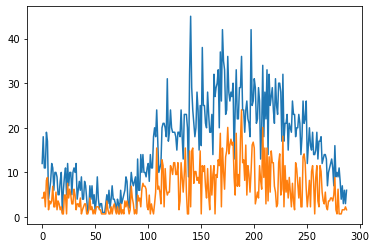

[[ 5.]
 [ 5.]
 [ 7.]
 [ 2.]
 [11.]
 [12.]
 [ 1.]
 [ 4.]
 [ 3.]
 [ 4.]
 [ 9.]
 [ 2.]
 [ 2.]
 [ 7.]
 [ 1.]
 [ 4.]
 [ 3.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 6.]
 [ 6.]
 [ 0.]
 [10.]
 [ 5.]
 [ 8.]
 [ 6.]
 [ 3.]
 [ 3.]
 [ 8.]
 [ 6.]
 [ 1.]
 [ 3.]
 [ 3.]
 [ 2.]
 [ 5.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 5.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 2.]
 [ 4.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 9.]
 [ 5.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 6.]
 [ 4.]
 [ 5.]
 [ 2.]
 [ 8.]
 [10.]
 [ 9.]
 [ 9.]
 [ 8.]
 [ 2.]
 [ 1.]
 [ 6.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 7.]
 [22.]
 [ 8.]
 [ 9.]
 [ 7.]
 [ 3.]
 [18.]
 [16.]
 [ 2.]
 [15.]
 [ 8.]
 [ 6.]
 [ 7.]
 [ 7.]
 [16.]
 [15.]
 [13.]
 [17.]
 [17.]
 [13.]
 [13.]
 [17.]
 [ 1.]
 [ 4.]
 [17.]
 [12.]
 [ 7.]
 [13.]
 [22.]
 [ 7.]
 [ 0.]
 [ 0.]
 [21.]
 [ 2.]
 [21.]
 [22.]

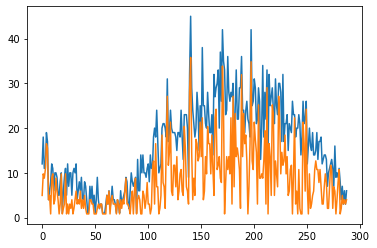

[[ 4.]
 [ 9.]
 [ 8.]
 [10.]
 [16.]
 [15.]
 [ 3.]
 [ 4.]
 [ 0.]
 [ 8.]
 [ 9.]
 [ 2.]
 [ 3.]
 [ 8.]
 [ 5.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 9.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 9.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 5.]
 [ 2.]
 [ 3.]
 [ 2.]
 [ 5.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 3.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 2.]
 [ 5.]
 [ 0.]
 [ 3.]
 [ 4.]
 [ 2.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 5.]
 [ 8.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 5.]
 [ 0.]
 [ 5.]
 [ 8.]
 [ 0.]
 [ 3.]
 [ 4.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 4.]
 [ 1.]
 [ 3.]
 [ 7.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 1.]
 [10.]
 [12.]
 [ 2.]
 [16.]
 [ 6.]
 [ 6.]
 [ 0.]
 [ 1.]
 [ 4.]
 [18.]
 [ 7.]
 [ 6.]
 [ 1.]
 [16.]
 [27.]
 [11.]
 [14.]
 [21.]
 [ 5.]
 [ 4.]
 [11.]
 [11.]
 [ 6.]
 [13.]
 [ 3.]
 [ 5.]
 [ 9.]
 [10.]
 [ 5.]
 [ 4.]
 [20.]
 [15.]
 [ 6.]
 [ 5.]
 [ 2.]
 [28.]
 [36.]
 [14.]
 [ 3.]

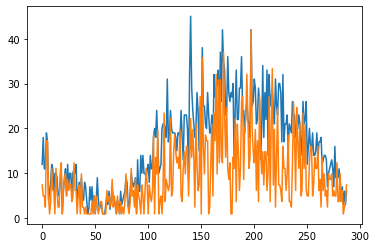

[[ 5.]
 [ 3.]
 [ 3.]
 [ 1.]
 [13.]
 [13.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 8.]
 [ 4.]
 [ 4.]
 [ 0.]
 [ 8.]
 [ 4.]
 [ 1.]
 [ 1.]
 [ 7.]
 [ 9.]
 [ 0.]
 [ 4.]
 [ 6.]
 [ 7.]
 [ 3.]
 [ 6.]
 [ 4.]
 [ 5.]
 [ 5.]
 [ 2.]
 [ 3.]
 [ 9.]
 [ 4.]
 [ 4.]
 [ 0.]
 [ 3.]
 [ 5.]
 [ 0.]
 [ 7.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 2.]
 [ 3.]
 [ 1.]
 [ 2.]
 [ 6.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 7.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 8.]
 [ 3.]
 [ 4.]
 [ 1.]
 [ 6.]
 [ 0.]
 [ 5.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 5.]
 [ 3.]
 [ 0.]
 [ 4.]
 [ 8.]
 [ 5.]
 [ 0.]
 [ 5.]
 [ 3.]
 [ 2.]
 [ 4.]
 [14.]
 [ 0.]
 [10.]
 [ 7.]
 [15.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 4.]
 [18.]
 [ 2.]
 [ 6.]
 [ 5.]
 [ 4.]
 [ 5.]
 [17.]
 [ 3.]
 [ 4.]
 [11.]
 [14.]
 [11.]
 [ 9.]
 [10.]
 [ 8.]
 [15.]
 [ 3.]
 [ 2.]
 [ 8.]
 [11.]
 [ 7.]
 [12.]
 [12.]
 [ 3.]
 [ 9.]
 [17.]
 [10.]
 [15.]

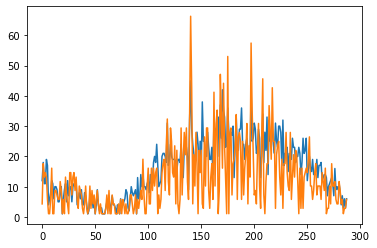

699 0.6111111044883728 0.4930555522441864


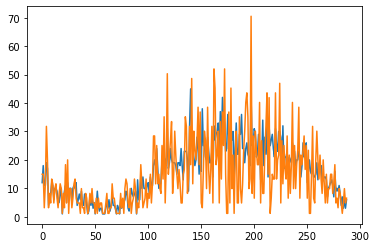

799 0.4166666567325592 0.7395833134651184


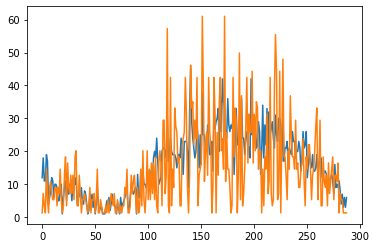

899 0.0590277761220932 0.84375


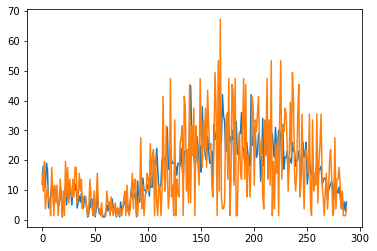

999 0.0 1.0


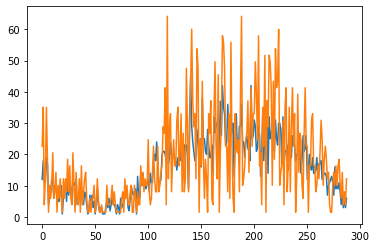

1099 0.0 1.0


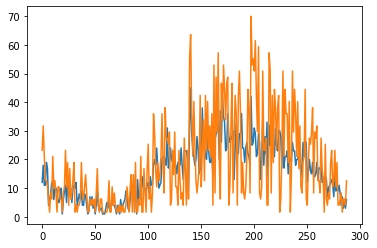

1199 0.0 1.0


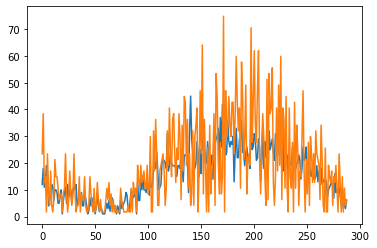

1299 0.0 1.0


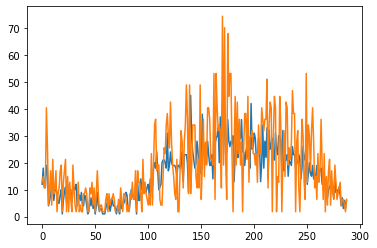

1399 0.0 1.0


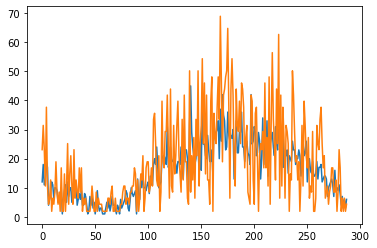

1499 0.1145833358168602 0.9375


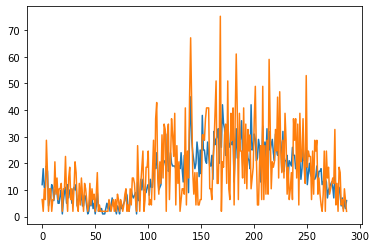

1599 0.2152777761220932 0.7916666865348816


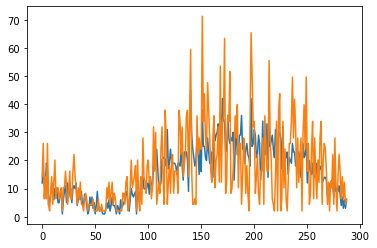

1699 0.3958333432674408 0.6493055820465088


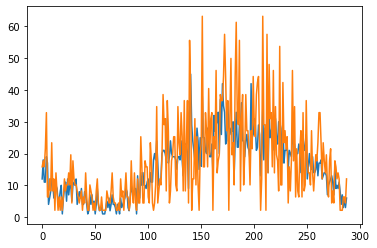

1799 0.3958333432674408 0.6076388955116272


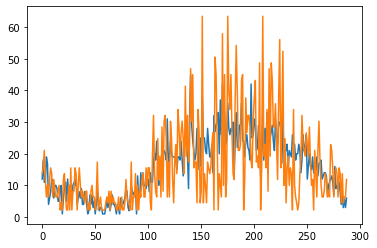

1899 0.6701388955116272 0.5


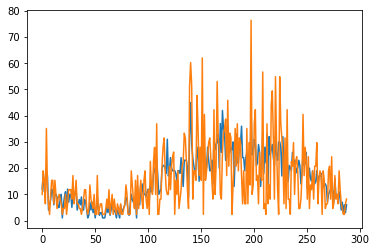

1999 0.5729166865348816 0.5347222089767456


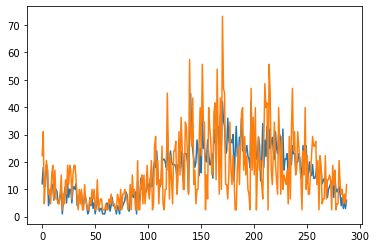

2099 0.6909722089767456 0.4409722089767456


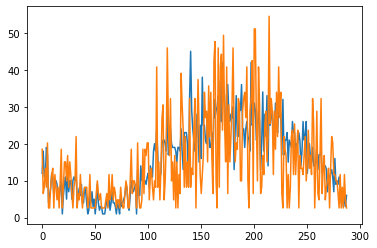

2199 0.7361111044883728 0.3784722089767456


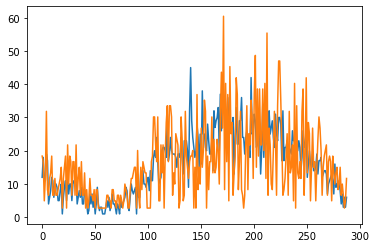

2299 0.5243055820465088 0.6493055820465088


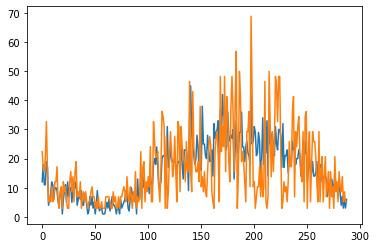

2399 0.2604166567325592 0.8958333134651184


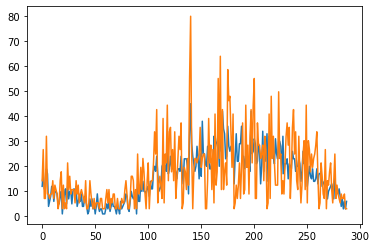

2499 0.2604166567325592 0.8402777910232544


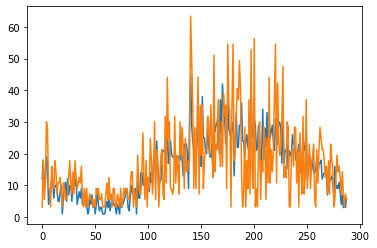

2599 0.3506944477558136 0.7569444179534912


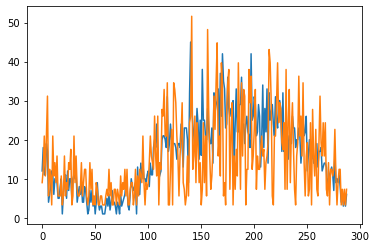

2699 0.4097222089767456 0.7256944179534912


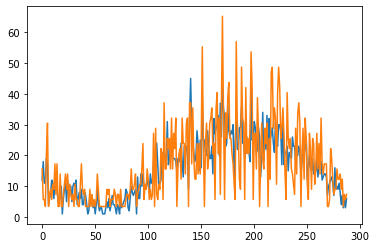

2799 0.3888888955116272 0.7430555820465088


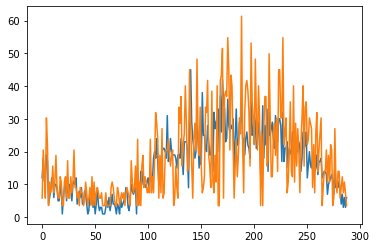

2899 0.5104166865348816 0.625


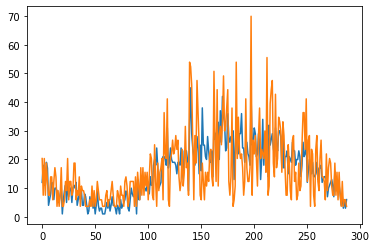

2999 0.5104166865348816 0.6458333134651184


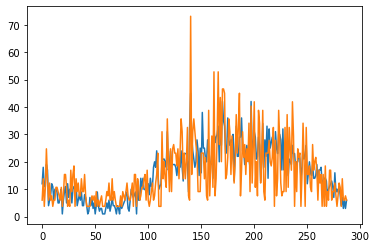

3099 0.46875 0.6215277910232544


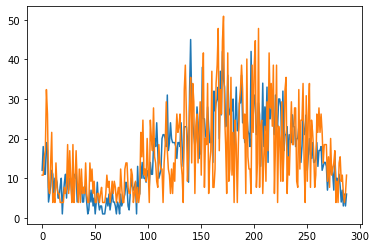

3199 0.4340277910232544 0.6736111044883728


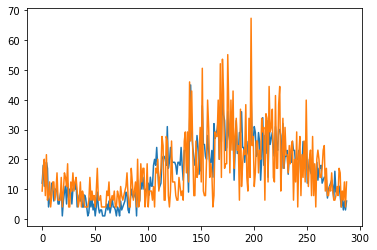

3299 0.4583333432674408 0.6909722089767456


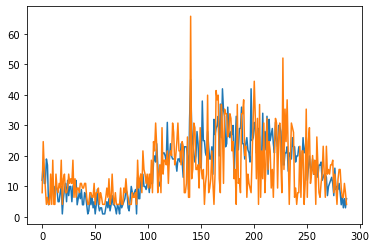

3399 0.4340277910232544 0.6840277910232544


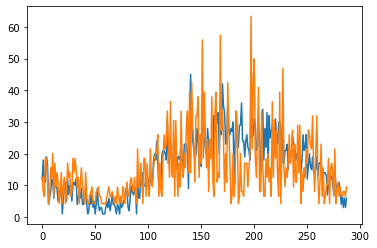

3499 0.4722222089767456 0.6770833134651184


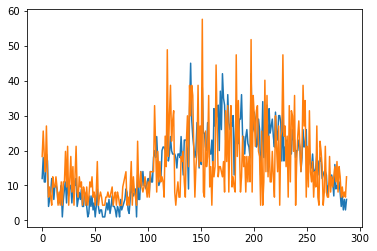

3599 0.5069444179534912 0.6319444179534912


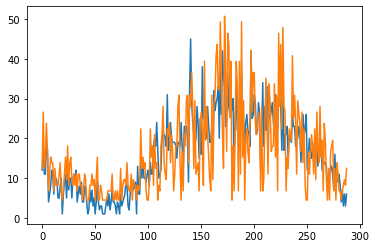

3699 0.4583333432674408 0.6736111044883728


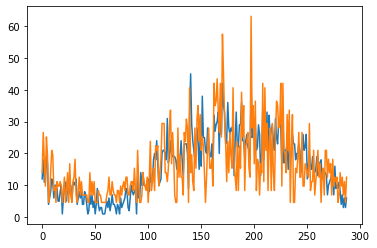

3799 0.4722222089767456 0.6527777910232544


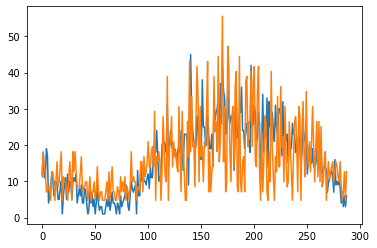

3899 0.4861111044883728 0.6597222089767456


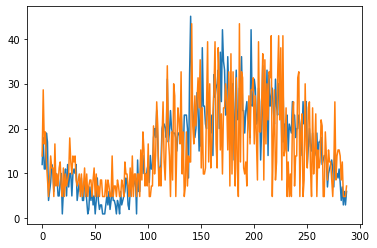

3999 0.4305555522441864 0.7430555820465088


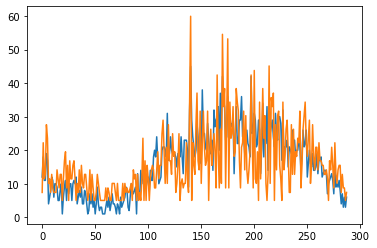

4099 0.4722222089767456 0.6180555820465088


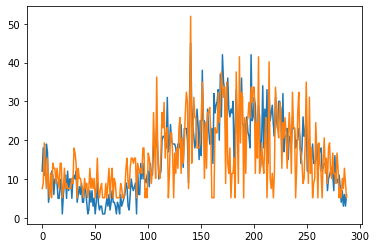

4199 0.4583333432674408 0.6631944179534912


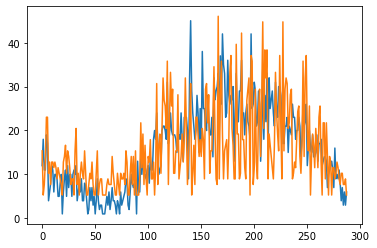

4299 0.4409722089767456 0.6875


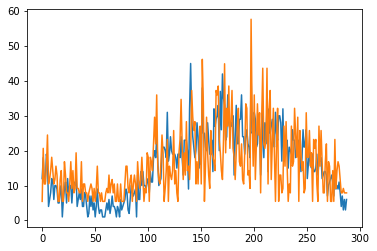

4399 0.4409722089767456 0.6423611044883728


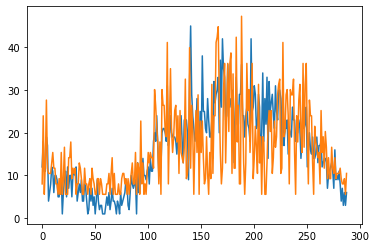

4499 0.4166666567325592 0.7326388955116272


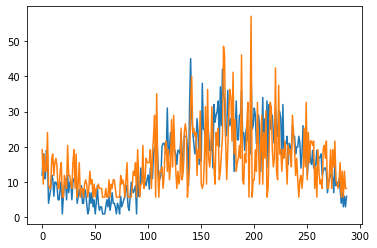

4599 0.4409722089767456 0.6909722089767456


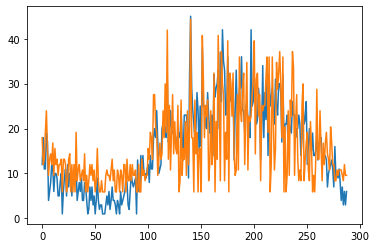

4699 0.4409722089767456 0.6875


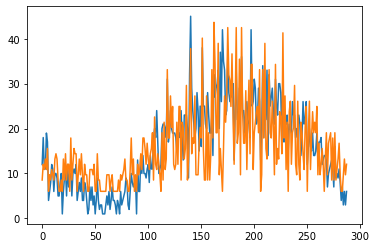

4799 0.4305555522441864 0.6736111044883728


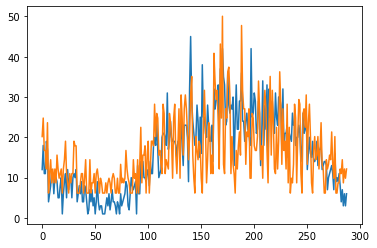

4899 0.2256944477558136 0.8194444179534912


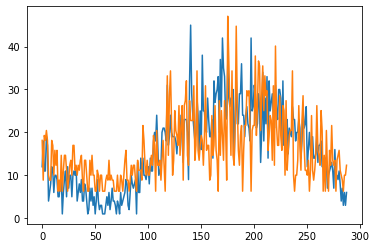

4999 0.3263888955116272 0.7534722089767456


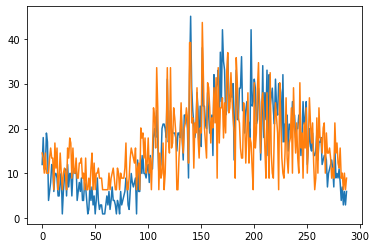

5099 0.3402777910232544 0.7638888955116272


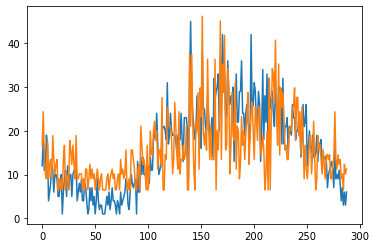

5199 0.2951388955116272 0.7777777910232544


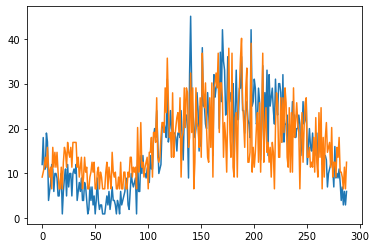

5299 0.2951388955116272 0.7673611044883728


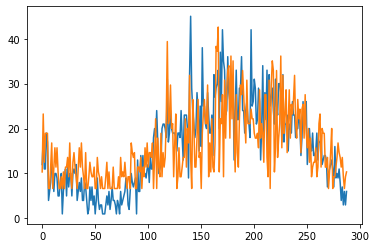

5399 0.2604166567325592 0.8090277910232544


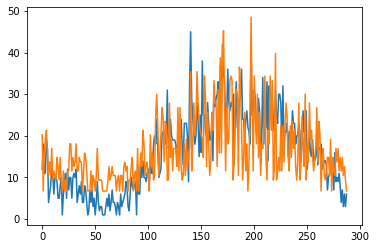

5499 0.2604166567325592 0.7534722089767456


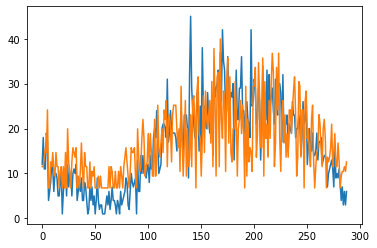

5599 0.3472222089767456 0.71875


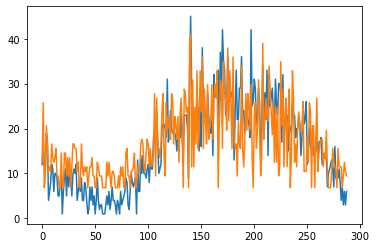

5699 0.4444444477558136 0.6666666865348816


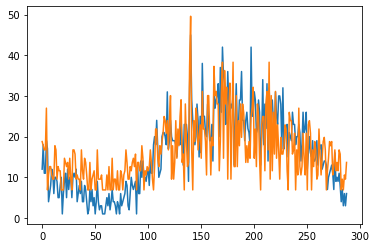

5799 0.0 1.0


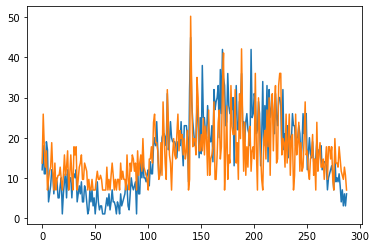

5899 0.09375 0.9409722089767456


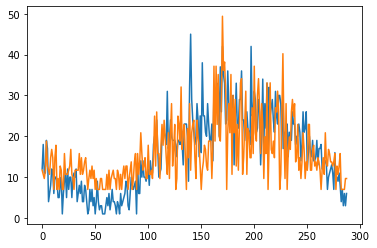

5999 0.3611111044883728 0.71875


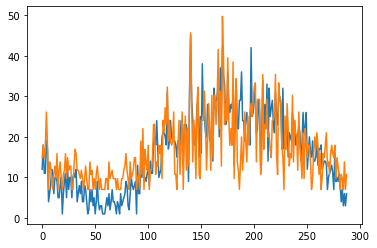

6099 0.0486111119389534 0.9756944179534912


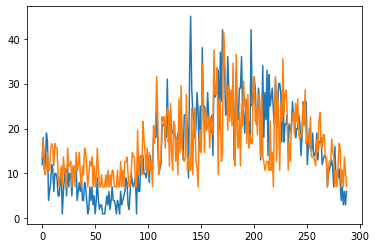

6199 0.0 1.0


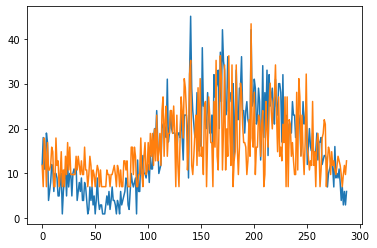

6299 0.0 1.0


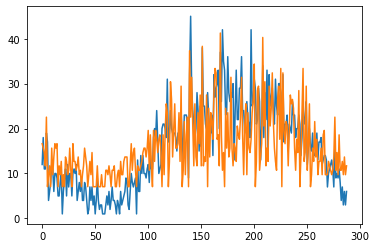

6399 0.7673611044883728 0.1319444477558136


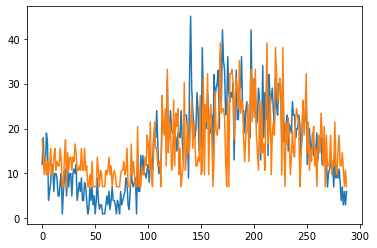

6499 0.0 1.0


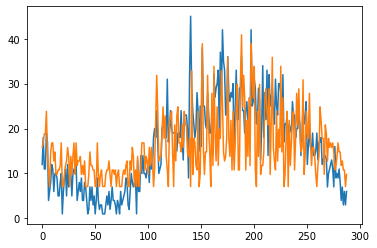

6599 0.0 1.0


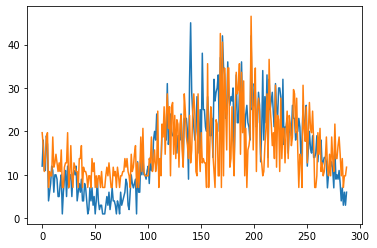

6699 0.7361111044883728 0.1284722238779068


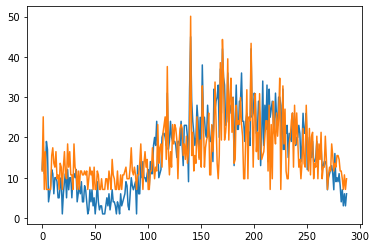

6799 0.84375 0.0


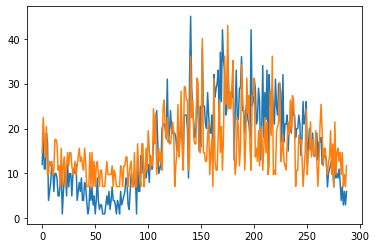

[[ 6.]
 [14.]
 [ 9.]
 [ 5.]
 [12.]
 [ 1.]
 [ 1.]
 [ 4.]
 [ 3.]
 [ 4.]
 [ 1.]
 [ 2.]
 [ 9.]
 [ 9.]
 [ 8.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 7.]
 [ 0.]
 [ 3.]
 [ 5.]
 [ 0.]
 [ 3.]
 [ 6.]
 [ 3.]
 [ 6.]
 [ 6.]
 [ 3.]
 [ 1.]
 [ 2.]
 [ 4.]
 [ 1.]
 [ 3.]
 [ 5.]
 [ 7.]
 [ 4.]
 [ 5.]
 [ 3.]
 [ 2.]
 [ 7.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 6.]
 [ 0.]
 [ 6.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 3.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 3.]
 [ 5.]
 [ 5.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 6.]
 [ 0.]
 [ 0.]
 [ 8.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 8.]
 [ 8.]
 [ 0.]
 [ 1.]
 [ 7.]
 [ 2.]
 [11.]
 [ 7.]
 [ 2.]
 [ 5.]
 [ 3.]
 [16.]
 [ 8.]
 [15.]
 [ 1.]
 [ 4.]
 [ 7.]
 [ 4.]
 [ 6.]
 [ 2.]
 [16.]
 [18.]
 [12.]
 [ 9.]
 [14.]
 [10.]
 [ 8.]
 [ 8.]
 [10.]
 [13.]
 [11.]
 [ 0.]
 [ 3.]
 [ 6.]
 [17.]
 [ 5.]
 [ 9.]
 [20.]
 [ 7.]
 [ 2.]
 [21.]
 [21.]
 [18.]
 [18.]
 [ 2.]
 [ 5.]
 [28.]
 [14.]
 [18.]

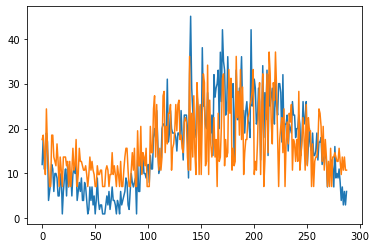

6999 0.7986111044883728 0.0


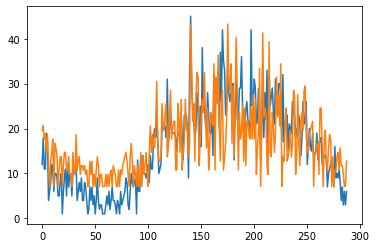

7099 0.0 1.0


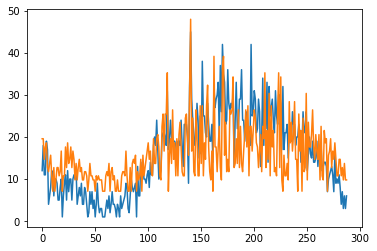

7199 0.7013888955116272 0.1145833358168602


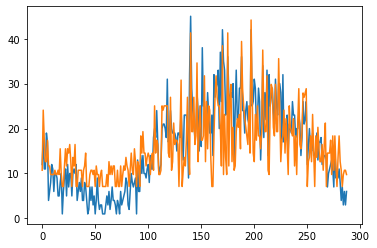

7299 0.0 1.0


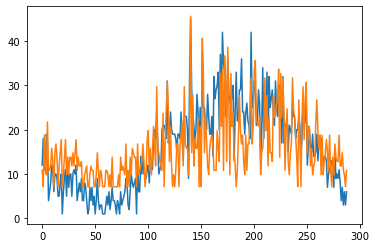

7399 0.0 1.0


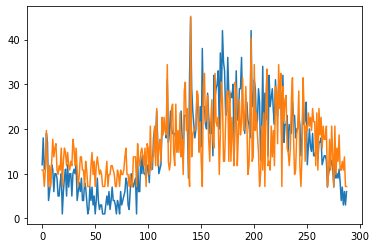

7499 0.0 1.0


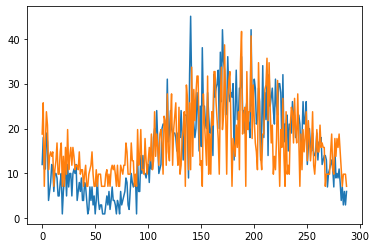

7599 0.6111111044883728 0.3263888955116272


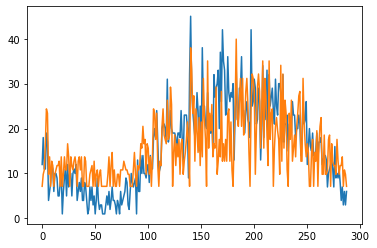

7699 0.8680555820465088 0.0


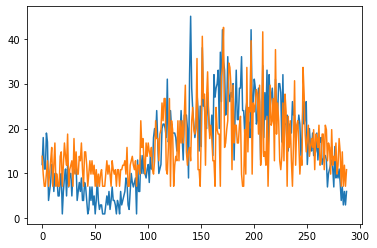

[[ 5.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 7.]
 [ 0.]
 [ 3.]
 [ 8.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 6.]
 [ 0.]
 [ 3.]
 [ 8.]
 [ 5.]
 [ 3.]
 [10.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 4.]
 [ 0.]
 [ 9.]
 [ 1.]
 [ 6.]
 [ 1.]
 [ 1.]
 [ 5.]
 [ 4.]
 [ 8.]
 [ 2.]
 [ 0.]
 [ 6.]
 [ 6.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 1.]
 [ 4.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 3.]
 [ 3.]
 [ 4.]
 [ 1.]
 [ 7.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 4.]
 [ 5.]
 [ 3.]
 [ 2.]
 [ 4.]
 [ 0.]
 [ 3.]
 [ 3.]
 [ 1.]
 [13.]
 [ 7.]
 [ 9.]
 [ 4.]
 [ 1.]
 [ 8.]
 [ 5.]
 [ 8.]
 [ 6.]
 [ 5.]
 [ 7.]
 [ 2.]
 [ 1.]
 [ 4.]
 [13.]
 [ 9.]
 [ 9.]
 [ 4.]
 [10.]
 [11.]
 [17.]
 [13.]
 [18.]
 [18.]
 [ 2.]
 [ 1.]
 [ 7.]
 [18.]
 [ 0.]
 [13.]
 [11.]
 [ 0.]
 [ 3.]
 [ 5.]
 [ 4.]
 [13.]
 [ 4.]
 [13.]
 [ 8.]
 [13.]
 [ 8.]
 [14.]
 [21.]
 [ 6.]
 [ 3.]
 [ 6.]
 [ 7.]
 [ 4.]
 [13.]
 [16.]

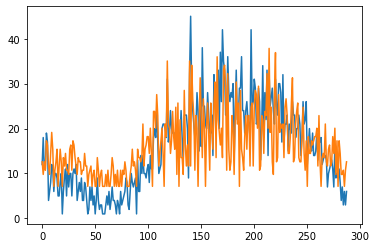

7899 0.0 1.0


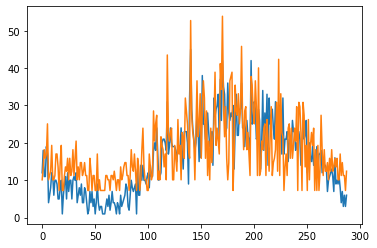

7999 1.0 0.0


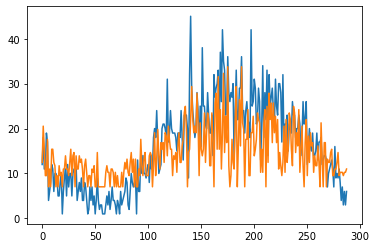

[[ 5.]
 [16.]
 [ 9.]
 [ 1.]
 [ 1.]
 [12.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 9.]
 [ 9.]
 [ 5.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 3.]
 [ 7.]
 [ 3.]
 [ 3.]
 [ 1.]
 [ 5.]
 [ 9.]
 [ 1.]
 [ 7.]
 [ 8.]
 [ 0.]
 [ 7.]
 [ 3.]
 [ 3.]
 [ 7.]
 [ 5.]
 [ 6.]
 [ 3.]
 [ 0.]
 [ 4.]
 [ 6.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 8.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 4.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 5.]
 [ 3.]
 [ 6.]
 [ 2.]
 [ 1.]
 [ 5.]
 [ 8.]
 [ 2.]
 [ 6.]
 [ 0.]
 [ 6.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 1.]
 [12.]
 [ 4.]
 [ 1.]
 [ 6.]
 [ 8.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 7.]
 [ 8.]
 [ 7.]
 [ 0.]
 [ 4.]
 [14.]
 [ 1.]
 [ 6.]
 [15.]
 [ 7.]
 [ 3.]
 [11.]
 [ 9.]
 [11.]
 [ 5.]
 [14.]
 [13.]
 [ 7.]
 [16.]
 [12.]
 [ 9.]
 [ 9.]
 [ 1.]
 [ 7.]
 [ 6.]
 [ 8.]
 [ 2.]
 [10.]
 [14.]
 [ 5.]
 [ 5.]
 [10.]
 [12.]
 [20.]
 [22.]
 [15.]
 [ 0.]
 [ 8.]
 [ 9.]
 [18.]
 [28.]
 [18.]

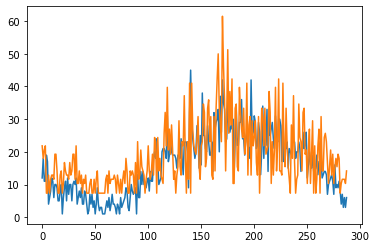

8199 1.0 0.0


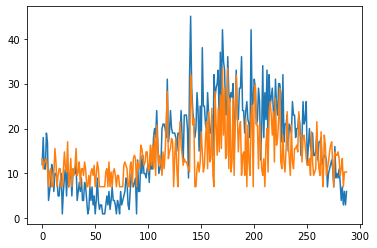

[[ 6.]
 [ 3.]
 [ 5.]
 [ 5.]
 [ 6.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 9.]
 [ 5.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 8.]
 [ 3.]
 [ 2.]
 [11.]
 [ 0.]
 [ 1.]
 [ 6.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 4.]
 [ 9.]
 [ 1.]
 [ 2.]
 [ 5.]
 [ 0.]
 [ 3.]
 [ 3.]
 [ 1.]
 [ 5.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 5.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 5.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 5.]
 [ 4.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 5.]
 [ 0.]
 [ 6.]
 [ 7.]
 [ 6.]
 [ 0.]
 [ 5.]
 [ 4.]
 [ 3.]
 [10.]
 [ 9.]
 [ 6.]
 [ 4.]
 [ 5.]
 [ 8.]
 [ 8.]
 [ 2.]
 [ 3.]
 [10.]
 [ 4.]
 [10.]
 [ 3.]
 [13.]
 [ 1.]
 [16.]
 [10.]
 [ 4.]
 [ 7.]
 [ 5.]
 [ 1.]
 [ 8.]
 [ 3.]
 [ 8.]
 [17.]
 [26.]
 [ 6.]
 [ 8.]
 [ 9.]
 [12.]
 [11.]
 [ 0.]
 [ 7.]
 [12.]
 [ 3.]
 [ 0.]
 [11.]
 [17.]
 [10.]
 [ 7.]
 [ 4.]
 [ 6.]
 [ 5.]
 [ 5.]
 [ 4.]
 [ 3.]
 [ 2.]
 [31.]
 [24.]
 [16.]

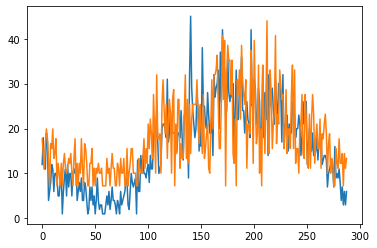

8399 0.0 1.0


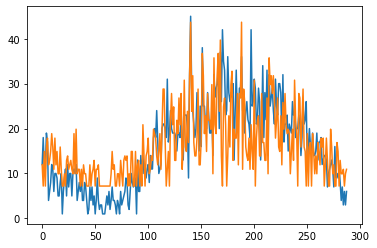

8499 0.96875 0.0


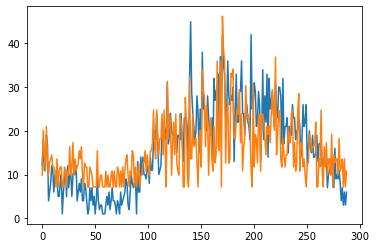

[[ 1.]
 [12.]
 [ 7.]
 [ 2.]
 [13.]
 [ 5.]
 [ 1.]
 [ 4.]
 [ 5.]
 [ 6.]
 [ 3.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 5.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 8.]
 [ 1.]
 [ 3.]
 [ 9.]
 [ 1.]
 [ 5.]
 [ 2.]
 [ 3.]
 [ 4.]
 [ 7.]
 [ 5.]
 [ 8.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 3.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 7.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 5.]
 [ 6.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 7.]
 [ 6.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 4.]
 [ 4.]
 [ 7.]
 [ 2.]
 [ 6.]
 [ 3.]
 [ 1.]
 [ 7.]
 [ 7.]
 [ 9.]
 [17.]
 [ 8.]
 [ 5.]
 [17.]
 [10.]
 [ 6.]
 [10.]
 [10.]
 [16.]
 [ 6.]
 [17.]
 [ 7.]
 [ 0.]
 [24.]
 [10.]
 [16.]
 [14.]
 [ 1.]
 [ 9.]
 [14.]
 [ 6.]
 [16.]
 [ 4.]
 [ 2.]
 [ 1.]
 [16.]
 [14.]
 [11.]
 [ 0.]
 [ 0.]
 [20.]
 [14.]
 [ 1.]
 [ 0.]
 [25.]
 [ 5.]
 [ 5.]
 [16.]

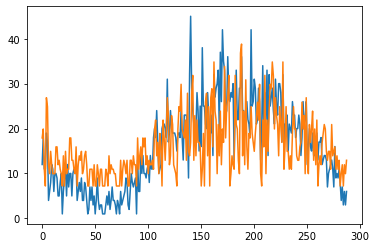

8699 0.9548611044883728 0.0


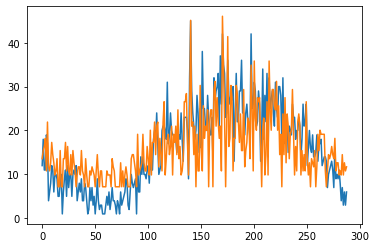

[[ 5.]
 [ 7.]
 [ 8.]
 [10.]
 [ 2.]
 [14.]
 [ 3.]
 [ 2.]
 [ 4.]
 [ 9.]
 [ 6.]
 [ 4.]
 [ 1.]
 [ 2.]
 [ 5.]
 [ 0.]
 [ 0.]
 [ 7.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 5.]
 [ 9.]
 [ 2.]
 [ 8.]
 [ 2.]
 [ 1.]
 [ 6.]
 [ 1.]
 [ 7.]
 [ 4.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 3.]
 [ 1.]
 [ 7.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 5.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 6.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 5.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 6.]
 [ 6.]
 [ 4.]
 [ 2.]
 [ 0.]
 [11.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 4.]
 [11.]
 [ 4.]
 [ 2.]
 [ 2.]
 [ 8.]
 [ 5.]
 [ 1.]
 [12.]
 [ 1.]
 [ 9.]
 [ 9.]
 [14.]
 [ 6.]
 [13.]
 [14.]
 [ 3.]
 [10.]
 [ 6.]
 [ 2.]
 [14.]
 [19.]
 [ 1.]
 [ 5.]
 [10.]
 [11.]
 [ 6.]
 [ 8.]
 [13.]
 [ 1.]
 [11.]
 [ 9.]
 [13.]
 [ 6.]
 [17.]
 [ 5.]
 [ 8.]
 [ 1.]
 [ 2.]
 [ 5.]
 [19.]
 [19.]
 [21.]
 [ 9.]
 [ 1.]
 [14.]
 [39.]
 [13.]
 [14.]

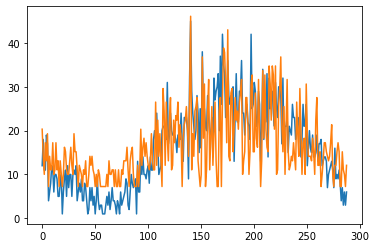

8899 0.96875 0.0


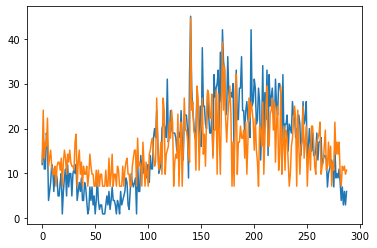

[[ 4.]
 [17.]
 [ 5.]
 [ 9.]
 [ 8.]
 [15.]
 [ 3.]
 [ 5.]
 [ 7.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 3.]
 [ 4.]
 [ 4.]
 [ 2.]
 [ 5.]
 [ 0.]
 [ 4.]
 [ 7.]
 [ 5.]
 [ 1.]
 [ 6.]
 [ 4.]
 [ 7.]
 [ 4.]
 [ 3.]
 [ 3.]
 [ 2.]
 [ 9.]
 [11.]
 [ 0.]
 [ 4.]
 [ 7.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 6.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 0.]
 [ 1.]
 [ 6.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 4.]
 [ 5.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 5.]
 [ 7.]
 [ 7.]
 [ 0.]
 [10.]
 [ 3.]
 [ 4.]
 [ 3.]
 [ 0.]
 [ 9.]
 [ 4.]
 [ 0.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 6.]
 [ 7.]
 [ 9.]
 [10.]
 [ 6.]
 [ 3.]
 [ 4.]
 [20.]
 [ 9.]
 [ 2.]
 [ 5.]
 [ 9.]
 [ 1.]
 [20.]
 [17.]
 [ 1.]
 [ 6.]
 [ 7.]
 [ 8.]
 [14.]
 [10.]
 [17.]
 [14.]
 [ 0.]
 [ 4.]
 [ 6.]
 [ 5.]
 [16.]
 [ 0.]
 [ 8.]
 [14.]
 [ 0.]
 [ 7.]
 [20.]
 [12.]
 [12.]
 [10.]
 [ 6.]
 [ 4.]
 [40.]
 [17.]
 [19.]

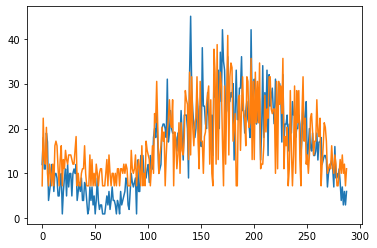

9099 1.0 0.0


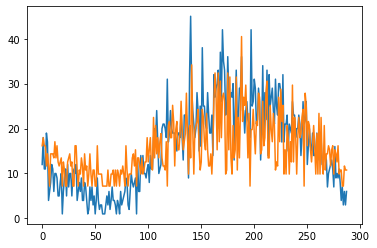

[[ 8.]
 [10.]
 [ 8.]
 [ 8.]
 [ 3.]
 [ 6.]
 [ 3.]
 [ 0.]
 [ 6.]
 [ 6.]
 [ 6.]
 [ 5.]
 [ 9.]
 [ 5.]
 [ 8.]
 [ 4.]
 [ 3.]
 [ 4.]
 [ 5.]
 [ 0.]
 [ 4.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 5.]
 [ 6.]
 [ 3.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 8.]
 [ 8.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 5.]
 [ 3.]
 [ 0.]
 [ 6.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 6.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 8.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 8.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 5.]
 [ 6.]
 [ 3.]
 [ 7.]
 [ 0.]
 [ 5.]
 [ 5.]
 [ 3.]
 [ 1.]
 [ 5.]
 [ 1.]
 [ 2.]
 [ 4.]
 [ 4.]
 [10.]
 [ 4.]
 [ 7.]
 [10.]
 [ 3.]
 [ 2.]
 [15.]
 [ 5.]
 [13.]
 [ 6.]
 [10.]
 [ 5.]
 [ 9.]
 [11.]
 [ 5.]
 [ 3.]
 [ 3.]
 [ 2.]
 [ 9.]
 [ 0.]
 [13.]
 [14.]
 [10.]
 [10.]
 [18.]
 [14.]
 [ 3.]
 [12.]
 [14.]
 [ 7.]
 [ 7.]
 [11.]
 [19.]
 [12.]
 [ 7.]
 [ 9.]
 [11.]
 [21.]
 [11.]
 [ 1.]
 [13.]
 [ 5.]
 [28.]
 [12.]

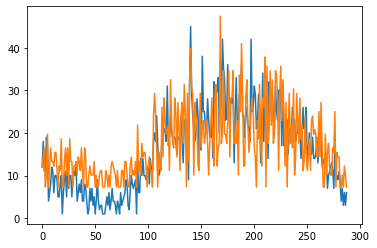

9299 1.0 0.0


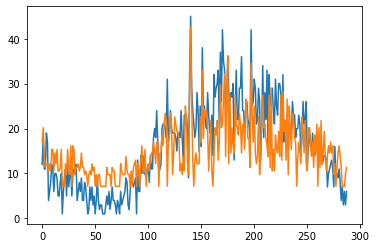

[[10.]
 [14.]
 [ 6.]
 [ 3.]
 [ 4.]
 [ 4.]
 [ 2.]
 [ 4.]
 [ 2.]
 [ 8.]
 [ 8.]
 [ 2.]
 [ 7.]
 [ 4.]
 [ 8.]
 [ 2.]
 [ 2.]
 [ 3.]
 [ 8.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 1.]
 [ 8.]
 [ 3.]
 [ 1.]
 [ 9.]
 [ 0.]
 [ 9.]
 [ 8.]
 [ 1.]
 [ 3.]
 [ 3.]
 [ 4.]
 [ 2.]
 [ 3.]
 [ 7.]
 [ 3.]
 [ 3.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 4.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 6.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 4.]
 [ 5.]
 [ 0.]
 [ 4.]
 [ 2.]
 [ 0.]
 [ 4.]
 [ 9.]
 [ 2.]
 [ 2.]
 [ 8.]
 [ 0.]
 [ 2.]
 [ 4.]
 [ 2.]
 [ 5.]
 [ 7.]
 [ 7.]
 [10.]
 [ 8.]
 [ 4.]
 [10.]
 [10.]
 [ 0.]
 [ 7.]
 [ 7.]
 [12.]
 [ 9.]
 [15.]
 [18.]
 [16.]
 [ 0.]
 [10.]
 [12.]
 [18.]
 [14.]
 [ 1.]
 [ 7.]
 [17.]
 [15.]
 [13.]
 [13.]
 [11.]
 [ 2.]
 [ 4.]
 [ 1.]
 [ 6.]
 [ 2.]
 [20.]
 [17.]
 [ 5.]
 [ 1.]
 [23.]
 [42.]
 [21.]
 [ 5.]

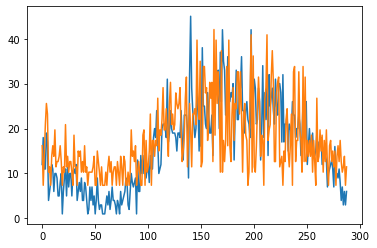

9499 1.0 0.0


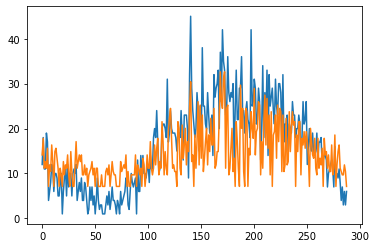

[[ 7.]
 [12.]
 [ 3.]
 [ 5.]
 [ 3.]
 [ 9.]
 [ 0.]
 [ 4.]
 [ 2.]
 [10.]
 [ 5.]
 [ 0.]
 [ 8.]
 [ 9.]
 [ 6.]
 [ 3.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 5.]
 [ 1.]
 [ 4.]
 [ 3.]
 [ 7.]
 [ 1.]
 [ 0.]
 [ 8.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 4.]
 [11.]
 [ 3.]
 [ 5.]
 [ 7.]
 [ 5.]
 [ 7.]
 [ 1.]
 [ 1.]
 [ 4.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 5.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 3.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 5.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 2.]
 [ 3.]
 [ 4.]
 [ 3.]
 [ 7.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 7.]
 [ 0.]
 [ 4.]
 [ 3.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 6.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 7.]
 [ 3.]
 [ 3.]
 [11.]
 [ 3.]
 [ 1.]
 [ 3.]
 [10.]
 [ 4.]
 [ 9.]
 [12.]
 [ 1.]
 [ 5.]
 [ 3.]
 [17.]
 [11.]
 [ 1.]
 [ 8.]
 [ 3.]
 [ 1.]
 [14.]
 [18.]
 [21.]
 [12.]
 [ 3.]
 [ 4.]
 [ 2.]
 [ 2.]
 [ 0.]
 [17.]
 [15.]
 [ 3.]
 [ 1.]
 [16.]
 [ 6.]
 [10.]
 [15.]
 [ 4.]
 [11.]
 [ 8.]
 [21.]
 [29.]
 [ 5.]
 [ 7.]

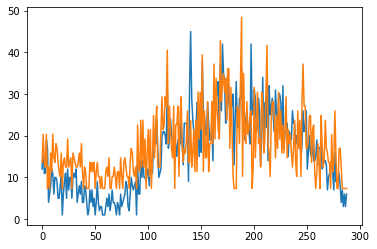

9699 0.0 1.0


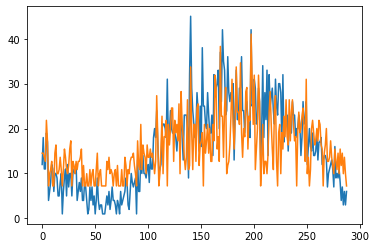

9799 0.96875 0.0


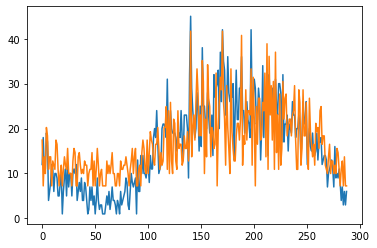

[[ 9.]
 [ 0.]
 [ 5.]
 [ 1.]
 [12.]
 [10.]
 [ 2.]
 [ 5.]
 [ 5.]
 [ 0.]
 [ 4.]
 [ 3.]
 [ 2.]
 [ 9.]
 [ 8.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 5.]
 [ 3.]
 [ 2.]
 [ 7.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 7.]
 [ 6.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 6.]
 [ 3.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 4.]
 [ 3.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 2.]
 [ 6.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 2.]
 [ 7.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 3.]
 [ 6.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 2.]
 [ 2.]
 [ 3.]
 [ 3.]
 [ 5.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 4.]
 [ 7.]
 [ 1.]
 [ 5.]
 [ 7.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 6.]
 [ 9.]
 [ 7.]
 [ 2.]
 [ 1.]
 [ 9.]
 [ 1.]
 [ 6.]
 [11.]
 [ 9.]
 [ 8.]
 [ 4.]
 [ 3.]
 [ 8.]
 [ 8.]
 [12.]
 [ 7.]
 [ 2.]
 [ 6.]
 [ 3.]
 [ 4.]
 [12.]
 [12.]
 [17.]
 [ 2.]
 [16.]
 [ 1.]
 [18.]
 [ 4.]
 [ 1.]
 [14.]
 [13.]
 [ 4.]
 [ 2.]
 [16.]
 [ 7.]
 [ 8.]
 [ 8.]
 [ 3.]
 [ 4.]
 [10.]
 [ 7.]
 [ 7.]
 [11.]
 [ 4.]
 [ 9.]
 [35.]
 [ 5.]
 [12.]

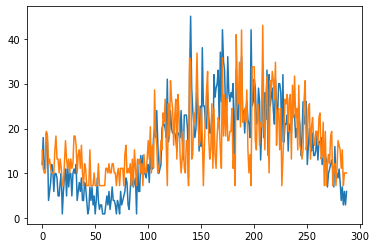

9999 1.0 0.0


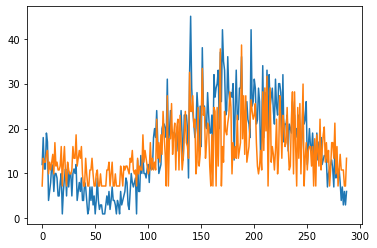

[[ 0.]
 [ 5.]
 [ 4.]
 [ 4.]
 [ 6.]
 [ 7.]
 [ 1.]
 [ 4.]
 [ 2.]
 [ 4.]
 [ 6.]
 [ 1.]
 [ 9.]
 [ 3.]
 [ 4.]
 [ 2.]
 [ 2.]
 [ 3.]
 [ 8.]
 [ 0.]
 [ 4.]
 [ 8.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 8.]
 [ 5.]
 [ 5.]
 [11.]
 [ 3.]
 [ 5.]
 [ 7.]
 [ 5.]
 [ 8.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 5.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 3.]
 [ 3.]
 [ 2.]
 [ 1.]
 [ 5.]
 [ 4.]
 [ 7.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 5.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 2.]
 [11.]
 [ 4.]
 [ 7.]
 [ 5.]
 [ 3.]
 [ 1.]
 [ 2.]
 [ 9.]
 [ 2.]
 [ 5.]
 [ 2.]
 [ 4.]
 [ 2.]
 [15.]
 [ 5.]
 [ 9.]
 [ 4.]
 [11.]
 [ 6.]
 [17.]
 [11.]
 [ 6.]
 [ 0.]
 [21.]
 [ 0.]
 [10.]
 [10.]
 [19.]
 [ 6.]
 [11.]
 [14.]
 [ 2.]
 [13.]
 [15.]
 [ 2.]
 [16.]
 [ 9.]
 [ 2.]
 [ 5.]
 [11.]
 [17.]
 [ 9.]
 [ 8.]
 [ 5.]
 [27.]
 [17.]
 [17.]
 [21.]

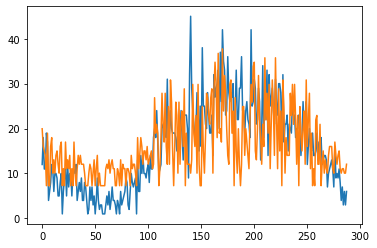

10199 0.9166666865348816 0.0


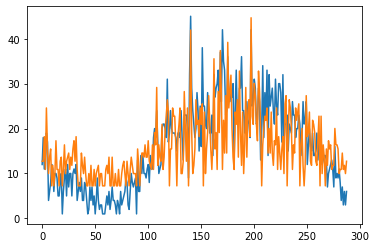

[[ 4.]
 [ 4.]
 [10.]
 [ 2.]
 [17.]
 [ 7.]
 [ 1.]
 [ 5.]
 [ 7.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 9.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 4.]
 [ 5.]
 [ 0.]
 [ 2.]
 [ 8.]
 [ 1.]
 [ 4.]
 [ 5.]
 [ 6.]
 [ 2.]
 [ 5.]
 [ 3.]
 [ 7.]
 [ 9.]
 [ 4.]
 [10.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 6.]
 [ 3.]
 [ 1.]
 [ 5.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 1.]
 [ 5.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 5.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 7.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 6.]
 [ 6.]
 [ 5.]
 [ 8.]
 [ 5.]
 [ 5.]
 [ 9.]
 [ 4.]
 [ 3.]
 [ 2.]
 [ 8.]
 [ 2.]
 [11.]
 [ 8.]
 [22.]
 [ 3.]
 [ 8.]
 [ 5.]
 [ 4.]
 [13.]
 [ 2.]
 [ 5.]
 [12.]
 [15.]
 [19.]
 [16.]
 [ 0.]
 [ 7.]
 [ 7.]
 [17.]
 [15.]
 [15.]
 [ 8.]
 [ 0.]
 [10.]
 [13.]
 [17.]
 [ 1.]
 [ 1.]
 [ 4.]
 [21.]
 [12.]
 [ 4.]
 [17.]
 [ 0.]
 [11.]
 [36.]
 [11.]
 [ 1.]

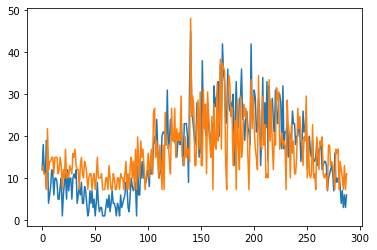

10399 0.96875 0.0


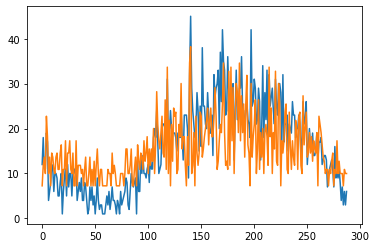

[[ 0.]
 [ 3.]
 [ 5.]
 [ 1.]
 [15.]
 [10.]
 [ 1.]
 [ 5.]
 [ 0.]
 [ 6.]
 [ 5.]
 [ 2.]
 [ 1.]
 [ 5.]
 [ 6.]
 [ 2.]
 [ 2.]
 [ 6.]
 [ 8.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 9.]
 [ 0.]
 [ 6.]
 [ 6.]
 [ 9.]
 [ 2.]
 [ 1.]
 [ 6.]
 [ 0.]
 [ 0.]
 [ 9.]
 [ 0.]
 [ 3.]
 [ 3.]
 [ 3.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 5.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 5.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 3.]
 [ 7.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 6.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 7.]
 [ 7.]
 [ 1.]
 [ 1.]
 [ 3.]
 [ 7.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 5.]
 [ 0.]
 [ 8.]
 [ 4.]
 [ 2.]
 [ 6.]
 [ 5.]
 [ 2.]
 [ 9.]
 [ 4.]
 [ 6.]
 [10.]
 [ 1.]
 [ 7.]
 [ 3.]
 [ 7.]
 [ 4.]
 [12.]
 [ 1.]
 [ 8.]
 [21.]
 [13.]
 [ 9.]
 [ 7.]
 [11.]
 [15.]
 [ 6.]
 [ 5.]
 [19.]
 [ 2.]
 [27.]
 [ 1.]
 [14.]
 [ 0.]
 [13.]
 [ 4.]
 [17.]
 [15.]
 [16.]
 [ 1.]
 [ 2.]
 [13.]
 [10.]
 [23.]
 [ 7.]
 [10.]
 [10.]
 [ 3.]
 [ 0.]
 [10.]
 [ 3.]
 [28.]
 [32.]
 [ 1.]
 [ 3.]

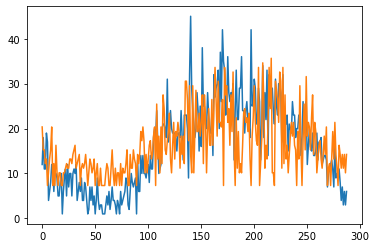

10599 1.0 0.0


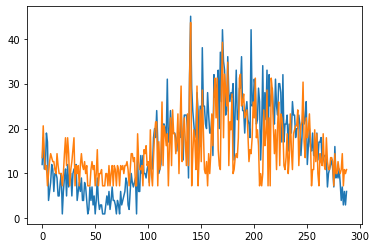

[[ 5.]
 [13.]
 [ 6.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 6.]
 [ 5.]
 [ 4.]
 [ 4.]
 [ 2.]
 [ 1.]
 [ 6.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 6.]
 [10.]
 [ 3.]
 [10.]
 [ 6.]
 [ 0.]
 [ 2.]
 [ 4.]
 [ 7.]
 [10.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 3.]
 [ 6.]
 [ 3.]
 [ 2.]
 [ 4.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 4.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 7.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 3.]
 [ 1.]
 [ 3.]
 [ 3.]
 [ 4.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 6.]
 [ 6.]
 [ 4.]
 [ 5.]
 [ 0.]
 [ 0.]
 [11.]
 [ 4.]
 [ 2.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 7.]
 [ 6.]
 [ 8.]
 [ 3.]
 [ 4.]
 [ 0.]
 [12.]
 [ 1.]
 [ 0.]
 [ 5.]
 [11.]
 [14.]
 [14.]
 [ 0.]
 [ 9.]
 [ 2.]
 [ 5.]
 [19.]
 [ 3.]
 [13.]
 [11.]
 [ 8.]
 [11.]
 [ 0.]
 [ 8.]
 [15.]
 [ 3.]
 [17.]
 [11.]
 [11.]
 [ 6.]
 [ 9.]
 [16.]
 [ 1.]
 [13.]
 [23.]
 [ 4.]
 [11.]
 [15.]
 [ 9.]
 [ 3.]
 [16.]
 [ 3.]
 [25.]
 [39.]
 [ 0.]
 [ 6.]

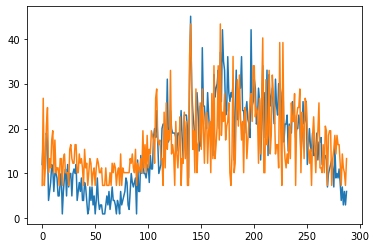

10799 1.0 0.0


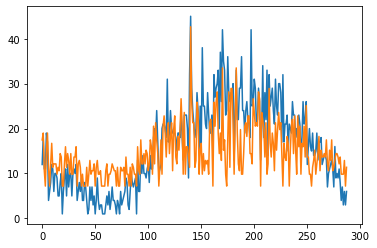

[[11.]
 [13.]
 [ 2.]
 [ 0.]
 [ 8.]
 [13.]
 [ 3.]
 [ 0.]
 [ 4.]
 [10.]
 [ 3.]
 [ 4.]
 [ 4.]
 [ 4.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 7.]
 [ 6.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 9.]
 [ 3.]
 [ 7.]
 [ 5.]
 [ 1.]
 [ 7.]
 [ 1.]
 [ 1.]
 [ 6.]
 [ 6.]
 [ 9.]
 [ 0.]
 [ 4.]
 [ 5.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 5.]
 [ 1.]
 [ 2.]
 [ 2.]
 [ 4.]
 [ 0.]
 [ 3.]
 [ 5.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 4.]
 [ 3.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 6.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 4.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 9.]
 [ 2.]
 [ 1.]
 [11.]
 [ 4.]
 [ 4.]
 [ 7.]
 [ 4.]
 [ 8.]
 [ 7.]
 [ 2.]
 [ 4.]
 [11.]
 [ 9.]
 [ 1.]
 [15.]
 [ 4.]
 [16.]
 [11.]
 [ 7.]
 [ 0.]
 [ 3.]
 [11.]
 [ 1.]
 [15.]
 [18.]
 [13.]
 [ 6.]
 [13.]
 [16.]
 [ 7.]
 [12.]
 [16.]
 [ 2.]
 [14.]
 [18.]
 [ 6.]
 [ 4.]
 [12.]
 [ 8.]
 [14.]
 [23.]
 [15.]
 [ 1.]
 [19.]
 [ 1.]
 [ 9.]
 [ 9.]
 [ 6.]
 [ 3.]
 [44.]
 [22.]
 [16.]

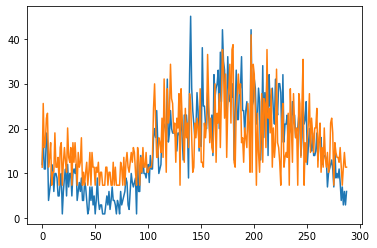

10999 1.0 0.0


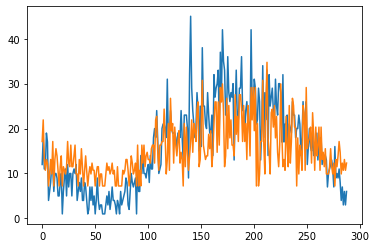

[[10.]
 [16.]
 [ 5.]
 [ 2.]
 [ 5.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 5.]
 [ 1.]
 [10.]
 [ 0.]
 [ 5.]
 [ 8.]
 [ 6.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 6.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 1.]
 [ 3.]
 [10.]
 [ 4.]
 [ 3.]
 [ 9.]
 [ 3.]
 [ 3.]
 [ 6.]
 [ 9.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 5.]
 [ 1.]
 [ 8.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 6.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 4.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 2.]
 [ 3.]
 [ 1.]
 [ 2.]
 [ 4.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 5.]
 [ 5.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 6.]
 [ 4.]
 [ 1.]
 [ 2.]
 [ 4.]
 [ 0.]
 [ 9.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 9.]
 [ 4.]
 [ 9.]
 [ 3.]
 [ 6.]
 [ 7.]
 [ 5.]
 [ 5.]
 [ 4.]
 [ 8.]
 [ 9.]
 [ 9.]
 [ 4.]
 [16.]
 [17.]
 [ 7.]
 [ 2.]
 [ 9.]
 [ 9.]
 [10.]
 [10.]
 [19.]
 [11.]
 [ 1.]
 [ 5.]
 [15.]
 [ 2.]
 [22.]
 [13.]
 [15.]
 [ 4.]
 [14.]
 [ 9.]
 [ 6.]
 [10.]
 [13.]
 [ 4.]
 [ 7.]
 [ 5.]
 [ 0.]
 [15.]
 [ 3.]
 [14.]
 [ 7.]
 [ 2.]
 [ 6.]
 [10.]
 [16.]
 [ 7.]

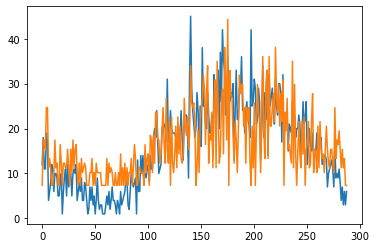

[[ 0.]
 [ 8.]
 [ 8.]
 [ 6.]
 [15.]
 [15.]
 [ 2.]
 [ 4.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 8.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 7.]
 [ 3.]
 [ 0.]
 [ 3.]
 [ 3.]
 [ 2.]
 [ 2.]
 [ 6.]
 [ 2.]
 [ 0.]
 [ 6.]
 [ 1.]
 [ 8.]
 [ 2.]
 [ 6.]
 [ 7.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 4.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 5.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 2.]
 [ 7.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 7.]
 [ 1.]
 [ 4.]
 [ 5.]
 [ 0.]
 [ 9.]
 [ 8.]
 [ 1.]
 [ 9.]
 [ 3.]
 [14.]
 [14.]
 [ 8.]
 [ 8.]
 [ 3.]
 [ 5.]
 [10.]
 [15.]
 [ 7.]
 [ 3.]
 [17.]
 [ 6.]
 [ 3.]
 [12.]
 [ 0.]
 [13.]
 [ 3.]
 [ 1.]
 [ 5.]
 [11.]
 [ 2.]
 [13.]
 [ 5.]
 [11.]
 [ 4.]
 [ 3.]
 [ 5.]
 [17.]
 [11.]
 [ 9.]
 [13.]
 [ 6.]
 [ 9.]
 [24.]
 [16.]
 [15.]

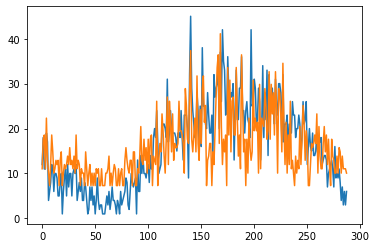

11299 0.96875 0.0


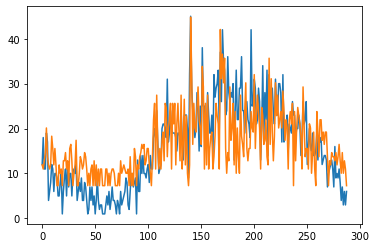

[[ 3.]
 [ 2.]
 [ 4.]
 [ 6.]
 [12.]
 [ 5.]
 [ 3.]
 [ 2.]
 [ 3.]
 [10.]
 [ 7.]
 [ 3.]
 [ 7.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 4.]
 [ 4.]
 [ 6.]
 [ 2.]
 [ 4.]
 [ 0.]
 [ 7.]
 [ 8.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 9.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 5.]
 [ 4.]
 [ 2.]
 [ 3.]
 [ 6.]
 [ 5.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 5.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 7.]
 [ 5.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 5.]
 [ 6.]
 [ 8.]
 [ 7.]
 [ 8.]
 [ 3.]
 [ 4.]
 [ 7.]
 [ 7.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 5.]
 [14.]
 [18.]
 [ 2.]
 [20.]
 [ 8.]
 [ 2.]
 [ 7.]
 [ 2.]
 [ 9.]
 [11.]
 [ 4.]
 [18.]
 [17.]
 [ 5.]
 [12.]
 [14.]
 [18.]
 [ 2.]
 [18.]
 [13.]
 [18.]
 [ 3.]
 [13.]
 [18.]
 [11.]
 [ 4.]
 [20.]
 [ 2.]
 [ 8.]
 [19.]
 [ 3.]
 [15.]
 [ 1.]
 [ 0.]
 [ 3.]
 [39.]
 [25.]
 [ 8.]

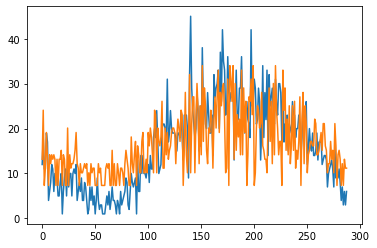

11499 1.0 0.0


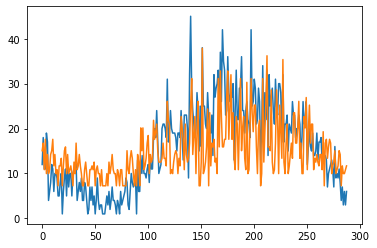

[[ 7.]
 [ 9.]
 [ 2.]
 [10.]
 [ 1.]
 [ 6.]
 [ 1.]
 [ 2.]
 [ 6.]
 [ 7.]
 [10.]
 [ 3.]
 [ 6.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 3.]
 [ 5.]
 [ 0.]
 [ 3.]
 [ 7.]
 [ 8.]
 [ 1.]
 [ 6.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 1.]
 [ 9.]
 [ 2.]
 [ 3.]
 [ 6.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 3.]
 [ 2.]
 [ 4.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 1.]
 [ 3.]
 [ 6.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 7.]
 [ 2.]
 [ 1.]
 [ 5.]
 [ 7.]
 [ 5.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 6.]
 [ 4.]
 [ 0.]
 [13.]
 [ 7.]
 [13.]
 [ 2.]
 [ 3.]
 [ 5.]
 [ 9.]
 [11.]
 [ 1.]
 [ 6.]
 [ 4.]
 [ 5.]
 [15.]
 [10.]
 [12.]
 [14.]
 [ 7.]
 [ 4.]
 [ 4.]
 [ 4.]
 [ 5.]
 [ 9.]
 [ 5.]
 [ 5.]
 [ 3.]
 [20.]
 [15.]
 [14.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 4.]
 [ 6.]
 [ 7.]
 [ 6.]
 [ 1.]
 [ 5.]
 [ 3.]
 [16.]
 [13.]
 [10.]
 [ 2.]
 [14.]
 [ 6.]
 [ 4.]
 [ 5.]
 [ 9.]
 [19.]
 [26.]
 [ 6.]

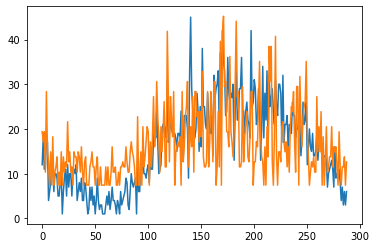

11699 1.0 0.0


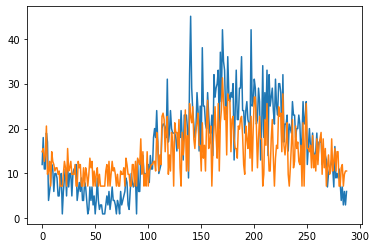

[[ 8.]
 [ 9.]
 [ 5.]
 [ 7.]
 [16.]
 [ 1.]
 [ 2.]
 [ 5.]
 [ 0.]
 [ 8.]
 [ 5.]
 [ 4.]
 [ 2.]
 [ 3.]
 [ 3.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 5.]
 [ 3.]
 [ 0.]
 [ 9.]
 [ 2.]
 [ 3.]
 [ 5.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 3.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 6.]
 [ 3.]
 [ 5.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 4.]
 [ 0.]
 [ 5.]
 [ 0.]
 [ 1.]
 [ 5.]
 [ 2.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 6.]
 [ 4.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 4.]
 [ 0.]
 [ 5.]
 [ 0.]
 [ 6.]
 [ 5.]
 [ 4.]
 [12.]
 [ 1.]
 [ 8.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 8.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 4.]
 [ 4.]
 [ 5.]
 [ 5.]
 [ 2.]
 [14.]
 [11.]
 [ 2.]
 [ 7.]
 [ 4.]
 [19.]
 [20.]
 [18.]
 [ 8.]
 [15.]
 [19.]
 [ 1.]
 [ 7.]
 [ 2.]
 [14.]
 [11.]
 [ 0.]
 [17.]
 [14.]
 [14.]
 [ 9.]
 [18.]
 [ 3.]
 [ 0.]
 [14.]
 [ 7.]
 [12.]
 [21.]
 [ 2.]
 [13.]
 [ 2.]
 [23.]
 [19.]
 [17.]
 [22.]

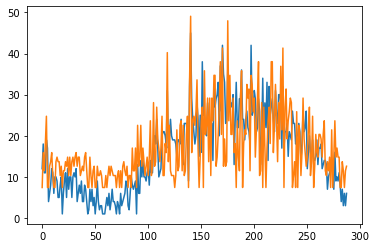

11899 0.0 1.0


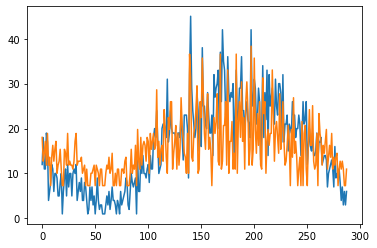

11999 1.0 0.0


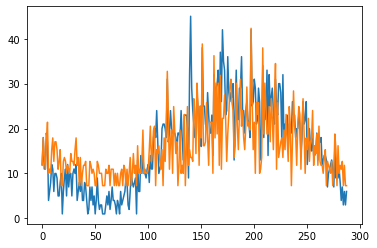

[[ 3.]
 [10.]
 [ 5.]
 [ 2.]
 [ 9.]
 [14.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 7.]
 [10.]
 [ 4.]
 [ 9.]
 [ 9.]
 [ 7.]
 [ 2.]
 [ 4.]
 [ 7.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 5.]
 [ 4.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 1.]
 [ 6.]
 [ 4.]
 [ 4.]
 [ 3.]
 [ 7.]
 [10.]
 [ 3.]
 [ 5.]
 [ 0.]
 [ 5.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 3.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 3.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 5.]
 [ 0.]
 [ 1.]
 [ 6.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 8.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 4.]
 [12.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 7.]
 [13.]
 [ 4.]
 [ 7.]
 [12.]
 [13.]
 [ 0.]
 [ 7.]
 [ 6.]
 [ 8.]
 [ 4.]
 [ 2.]
 [ 7.]
 [ 0.]
 [10.]
 [ 4.]
 [14.]
 [27.]
 [15.]
 [ 2.]
 [ 9.]
 [12.]
 [ 1.]
 [18.]
 [12.]
 [ 6.]
 [ 9.]
 [ 0.]
 [ 3.]
 [12.]
 [ 1.]
 [ 3.]
 [ 1.]
 [16.]
 [ 0.]
 [ 7.]
 [18.]
 [ 3.]
 [ 7.]
 [ 5.]
 [ 5.]
 [ 4.]

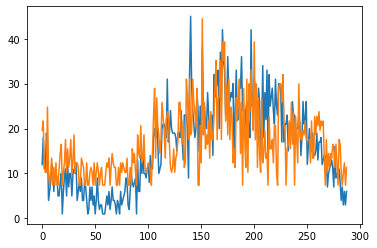

12199 0.6527777910232544 0.2291666716337204


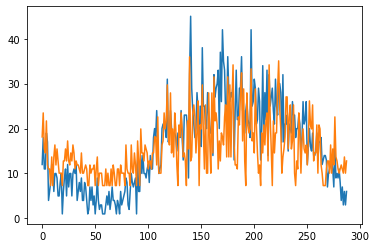

12299 0.0 1.0


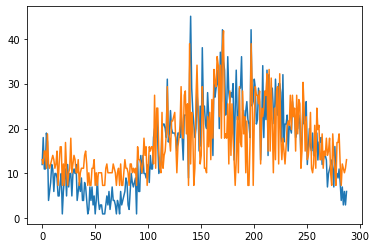

12399 0.0 1.0


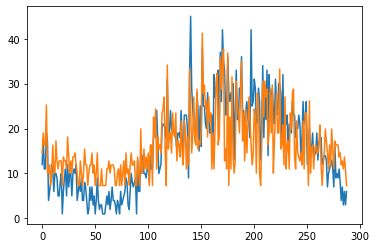

12499 0.7986111044883728 0.0034722222480922937


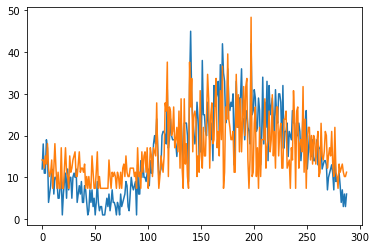

12599 0.0 1.0


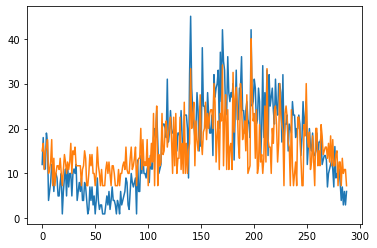

12699 0.9166666865348816 0.0


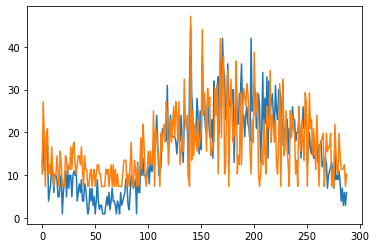

[[ 1.]
 [17.]
 [ 9.]
 [ 0.]
 [10.]
 [11.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 7.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 5.]
 [ 1.]
 [ 0.]
 [ 6.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 4.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 7.]
 [ 2.]
 [ 7.]
 [ 8.]
 [ 3.]
 [ 1.]
 [ 3.]
 [ 5.]
 [ 5.]
 [ 3.]
 [ 7.]
 [ 2.]
 [ 0.]
 [ 5.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 4.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 8.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 9.]
 [ 2.]
 [12.]
 [ 8.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 6.]
 [ 3.]
 [ 6.]
 [ 3.]
 [ 3.]
 [15.]
 [ 0.]
 [11.]
 [10.]
 [ 6.]
 [ 4.]
 [ 0.]
 [10.]
 [ 6.]
 [10.]
 [12.]
 [ 8.]
 [17.]
 [14.]
 [ 3.]
 [ 8.]
 [13.]
 [ 8.]
 [12.]
 [16.]
 [ 9.]
 [17.]
 [14.]
 [ 8.]
 [17.]
 [ 3.]
 [ 6.]
 [ 9.]
 [ 6.]
 [22.]
 [13.]
 [11.]
 [14.]
 [ 1.]
 [ 0.]
 [36.]
 [ 4.]
 [15.]

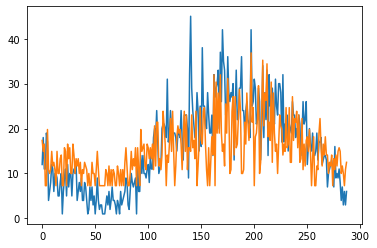

12899 0.96875 0.0


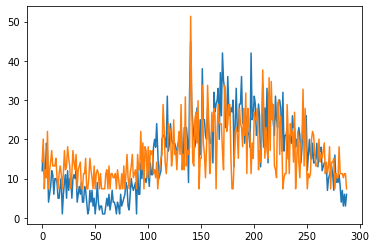

[[ 5.]
 [11.]
 [ 0.]
 [ 3.]
 [ 1.]
 [13.]
 [ 0.]
 [ 3.]
 [ 5.]
 [ 8.]
 [ 4.]
 [ 4.]
 [ 4.]
 [ 6.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 4.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 8.]
 [ 3.]
 [ 4.]
 [ 9.]
 [ 6.]
 [ 4.]
 [ 0.]
 [ 2.]
 [ 8.]
 [ 5.]
 [ 3.]
 [ 7.]
 [ 0.]
 [ 3.]
 [ 4.]
 [ 5.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 6.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 6.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 2.]
 [ 7.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 4.]
 [ 7.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 7.]
 [ 3.]
 [ 3.]
 [13.]
 [ 3.]
 [10.]
 [ 0.]
 [ 9.]
 [ 8.]
 [ 1.]
 [ 9.]
 [ 1.]
 [ 8.]
 [ 7.]
 [ 8.]
 [ 2.]
 [ 3.]
 [ 1.]
 [ 5.]
 [ 0.]
 [ 2.]
 [ 4.]
 [ 6.]
 [ 7.]
 [20.]
 [14.]
 [ 5.]
 [ 2.]
 [ 6.]
 [15.]
 [14.]
 [13.]
 [ 4.]
 [ 7.]
 [16.]
 [ 7.]
 [ 8.]
 [ 3.]
 [ 9.]
 [13.]
 [ 7.]
 [20.]
 [ 3.]
 [ 7.]
 [ 3.]
 [22.]
 [ 4.]
 [ 8.]
 [ 7.]
 [ 9.]
 [43.]
 [22.]
 [ 5.]

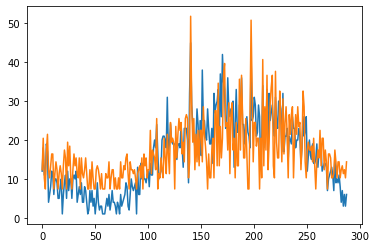

13099 1.0 0.0


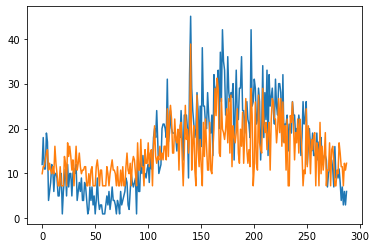

[[ 1.]
 [ 3.]
 [ 3.]
 [ 5.]
 [ 7.]
 [ 8.]
 [ 2.]
 [ 4.]
 [ 2.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 9.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 6.]
 [ 4.]
 [ 0.]
 [10.]
 [ 6.]
 [ 9.]
 [ 6.]
 [ 2.]
 [ 5.]
 [ 0.]
 [ 3.]
 [ 9.]
 [ 2.]
 [ 4.]
 [ 7.]
 [ 3.]
 [ 1.]
 [ 2.]
 [ 2.]
 [ 3.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 5.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 5.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 7.]
 [ 2.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 4.]
 [ 6.]
 [ 5.]
 [ 1.]
 [ 0.]
 [10.]
 [ 2.]
 [ 2.]
 [11.]
 [ 3.]
 [ 3.]
 [ 0.]
 [ 8.]
 [ 4.]
 [ 4.]
 [10.]
 [ 3.]
 [ 7.]
 [ 8.]
 [ 0.]
 [ 9.]
 [15.]
 [ 6.]
 [ 4.]
 [ 6.]
 [ 5.]
 [ 9.]
 [ 5.]
 [ 7.]
 [ 5.]
 [ 9.]
 [ 9.]
 [ 5.]
 [20.]
 [ 6.]
 [18.]
 [21.]
 [17.]
 [ 7.]
 [ 7.]
 [17.]
 [11.]
 [10.]
 [14.]
 [ 2.]
 [15.]
 [16.]
 [ 6.]
 [ 0.]
 [ 7.]
 [21.]
 [11.]
 [14.]
 [ 7.]
 [13.]
 [39.]
 [ 2.]
 [10.]

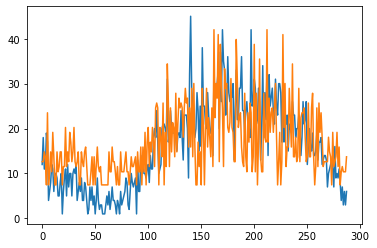

13299 0.0 1.0


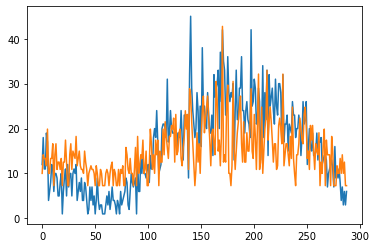

13399 0.9548611044883728 0.0


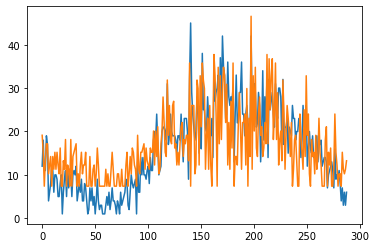

[[10.]
 [ 6.]
 [ 0.]
 [ 4.]
 [ 8.]
 [ 8.]
 [ 1.]
 [ 3.]
 [ 5.]
 [ 0.]
 [ 5.]
 [ 2.]
 [ 6.]
 [ 2.]
 [ 6.]
 [ 3.]
 [ 1.]
 [ 7.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 2.]
 [ 9.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 9.]
 [ 0.]
 [ 5.]
 [ 6.]
 [ 7.]
 [ 8.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 6.]
 [ 1.]
 [ 3.]
 [ 3.]
 [ 6.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 7.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 6.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 6.]
 [ 0.]
 [ 1.]
 [ 5.]
 [ 1.]
 [ 7.]
 [ 6.]
 [ 3.]
 [ 2.]
 [ 0.]
 [10.]
 [ 2.]
 [ 1.]
 [ 6.]
 [ 6.]
 [ 7.]
 [ 8.]
 [ 2.]
 [ 7.]
 [ 4.]
 [ 3.]
 [ 2.]
 [ 7.]
 [ 6.]
 [ 6.]
 [11.]
 [ 3.]
 [11.]
 [ 5.]
 [12.]
 [ 1.]
 [ 2.]
 [ 8.]
 [11.]
 [19.]
 [13.]
 [ 6.]
 [ 5.]
 [23.]
 [10.]
 [17.]
 [ 9.]
 [ 8.]
 [17.]
 [18.]
 [ 7.]
 [ 8.]
 [ 3.]
 [ 6.]
 [ 3.]
 [ 8.]
 [12.]
 [13.]
 [ 5.]
 [ 9.]
 [ 8.]
 [10.]
 [10.]
 [ 4.]
 [27.]
 [ 0.]
 [17.]
 [17.]

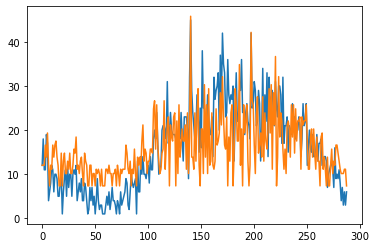

13599 1.0 0.0


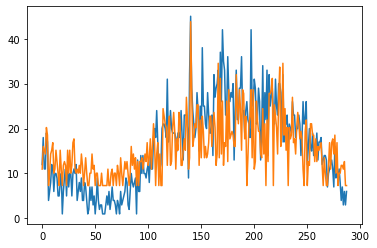

[[ 2.]
 [ 8.]
 [ 7.]
 [ 6.]
 [13.]
 [11.]
 [ 0.]
 [ 1.]
 [ 6.]
 [ 7.]
 [ 9.]
 [ 1.]
 [ 2.]
 [ 7.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 7.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 4.]
 [ 3.]
 [ 0.]
 [ 7.]
 [ 1.]
 [ 7.]
 [ 1.]
 [ 3.]
 [ 9.]
 [10.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 6.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 5.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 6.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 5.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 2.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 8.]
 [ 3.]
 [ 6.]
 [ 2.]
 [ 5.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 4.]
 [ 4.]
 [ 5.]
 [ 2.]
 [ 4.]
 [ 6.]
 [ 4.]
 [ 9.]
 [ 3.]
 [ 5.]
 [10.]
 [ 2.]
 [ 8.]
 [14.]
 [ 9.]
 [ 0.]
 [ 6.]
 [ 9.]
 [ 0.]
 [ 6.]
 [ 0.]
 [ 0.]
 [18.]
 [16.]
 [14.]
 [13.]
 [ 3.]
 [13.]
 [16.]
 [ 3.]
 [ 4.]
 [13.]
 [17.]
 [12.]
 [ 2.]
 [10.]
 [ 7.]
 [17.]
 [15.]
 [ 3.]
 [ 3.]
 [ 7.]
 [10.]
 [ 7.]
 [21.]
 [15.]
 [ 2.]
 [ 5.]
 [41.]
 [23.]
 [ 8.]

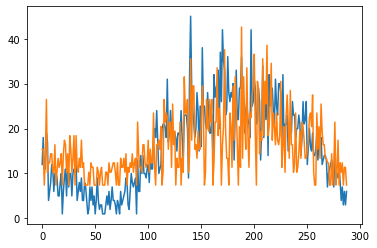

13799 0.9548611044883728 0.0


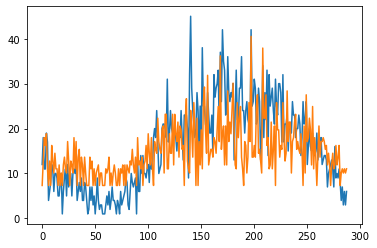

[[ 0.]
 [ 4.]
 [10.]
 [ 8.]
 [11.]
 [ 2.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 8.]
 [ 4.]
 [ 1.]
 [ 6.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 5.]
 [ 2.]
 [ 1.]
 [ 9.]
 [ 4.]
 [ 0.]
 [ 4.]
 [ 3.]
 [ 1.]
 [10.]
 [ 2.]
 [ 9.]
 [ 0.]
 [ 5.]
 [ 7.]
 [ 0.]
 [ 5.]
 [ 3.]
 [ 0.]
 [ 5.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 2.]
 [ 4.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 5.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 1.]
 [ 4.]
 [ 3.]
 [ 7.]
 [ 3.]
 [ 1.]
 [ 5.]
 [ 0.]
 [10.]
 [ 3.]
 [ 4.]
 [ 2.]
 [ 5.]
 [ 0.]
 [ 3.]
 [ 4.]
 [ 8.]
 [ 2.]
 [11.]
 [ 6.]
 [ 3.]
 [10.]
 [ 2.]
 [ 0.]
 [ 9.]
 [ 7.]
 [ 6.]
 [15.]
 [ 9.]
 [ 7.]
 [ 6.]
 [12.]
 [13.]
 [ 1.]
 [16.]
 [16.]
 [ 2.]
 [ 2.]
 [11.]
 [ 6.]
 [ 6.]
 [16.]
 [ 3.]
 [16.]
 [11.]
 [ 9.]
 [14.]
 [ 5.]
 [13.]
 [12.]
 [ 7.]
 [ 8.]
 [ 0.]
 [15.]
 [20.]
 [ 4.]
 [ 2.]
 [ 1.]
 [17.]
 [12.]
 [ 5.]

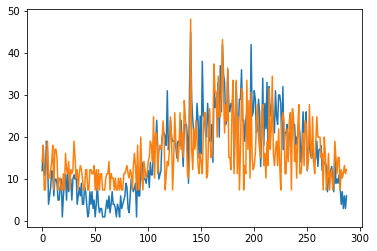

13999 0.0 1.0


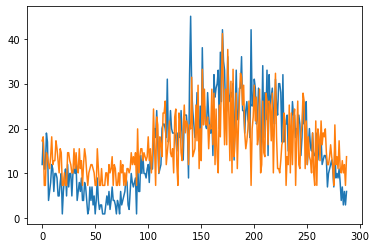

14099 0.9166666865348816 0.0


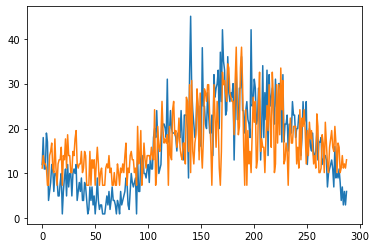

[[ 2.]
 [ 5.]
 [ 3.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 6.]
 [ 8.]
 [ 2.]
 [ 1.]
 [ 9.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 4.]
 [ 4.]
 [ 7.]
 [ 0.]
 [ 5.]
 [ 4.]
 [ 9.]
 [ 2.]
 [10.]
 [ 5.]
 [ 5.]
 [ 1.]
 [ 1.]
 [ 6.]
 [ 5.]
 [ 9.]
 [11.]
 [ 3.]
 [ 2.]
 [ 3.]
 [ 3.]
 [ 6.]
 [ 1.]
 [ 2.]
 [ 6.]
 [ 5.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 6.]
 [ 0.]
 [ 4.]
 [ 2.]
 [ 4.]
 [ 0.]
 [ 3.]
 [ 7.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 2.]
 [ 5.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 5.]
 [ 8.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 5.]
 [ 6.]
 [ 4.]
 [ 4.]
 [ 1.]
 [ 2.]
 [ 0.]
 [12.]
 [ 3.]
 [ 5.]
 [11.]
 [ 0.]
 [ 2.]
 [ 8.]
 [ 4.]
 [ 2.]
 [ 5.]
 [ 5.]
 [ 5.]
 [ 4.]
 [ 7.]
 [ 5.]
 [ 4.]
 [16.]
 [ 0.]
 [ 1.]
 [12.]
 [ 7.]
 [ 6.]
 [10.]
 [18.]
 [11.]
 [ 8.]
 [ 9.]
 [ 8.]
 [10.]
 [ 0.]
 [12.]
 [ 5.]
 [ 4.]
 [16.]
 [18.]
 [10.]
 [11.]
 [ 7.]
 [ 9.]
 [14.]
 [ 7.]
 [ 5.]
 [ 4.]
 [ 8.]
 [ 8.]
 [ 3.]
 [19.]
 [18.]
 [ 6.]
 [22.]
 [ 1.]
 [23.]
 [ 6.]

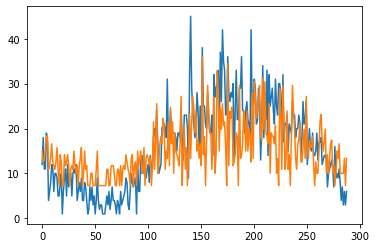

14299 0.7361111044883728 0.1493055522441864


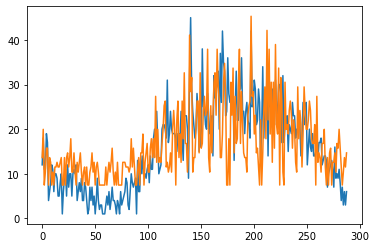

14399 0.0833333358168602 1.0


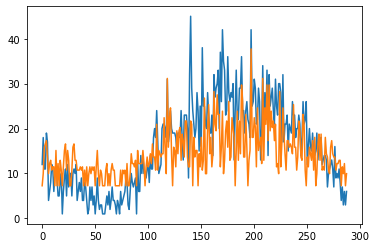

14499 0.8680555820465088 0.0


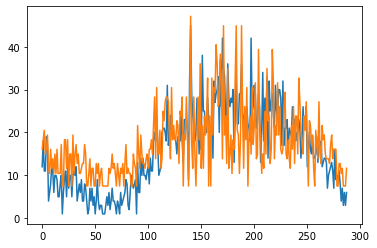

[[ 6.]
 [ 8.]
 [10.]
 [ 5.]
 [ 6.]
 [ 9.]
 [ 2.]
 [ 1.]
 [ 6.]
 [ 2.]
 [ 4.]
 [ 1.]
 [ 5.]
 [ 1.]
 [ 6.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 7.]
 [ 0.]
 [ 0.]
 [ 8.]
 [ 8.]
 [ 2.]
 [ 8.]
 [ 0.]
 [ 5.]
 [ 5.]
 [ 0.]
 [ 9.]
 [ 1.]
 [ 5.]
 [ 7.]
 [ 3.]
 [ 5.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 3.]
 [ 7.]
 [ 5.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 5.]
 [ 2.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 3.]
 [ 7.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 3.]
 [ 2.]
 [ 0.]
 [11.]
 [ 5.]
 [ 2.]
 [ 9.]
 [ 5.]
 [ 3.]
 [ 3.]
 [ 2.]
 [ 4.]
 [ 5.]
 [ 2.]
 [ 6.]
 [ 6.]
 [ 8.]
 [ 5.]
 [11.]
 [17.]
 [ 4.]
 [19.]
 [ 5.]
 [ 5.]
 [10.]
 [ 2.]
 [ 4.]
 [14.]
 [12.]
 [16.]
 [17.]
 [17.]
 [16.]
 [ 9.]
 [ 4.]
 [19.]
 [ 8.]
 [11.]
 [ 8.]
 [ 8.]
 [12.]
 [11.]
 [ 3.]
 [14.]
 [13.]
 [17.]
 [ 0.]
 [ 9.]
 [ 8.]
 [17.]
 [10.]
 [ 0.]
 [10.]
 [34.]
 [ 7.]
 [ 2.]

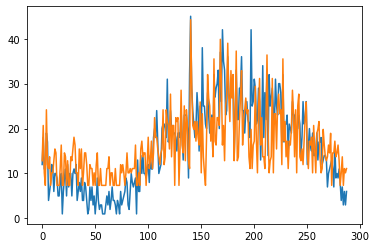

14699 1.0 0.0


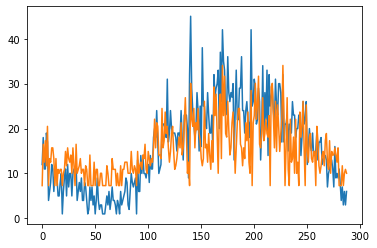

[[ 0.]
 [ 9.]
 [ 4.]
 [10.]
 [ 3.]
 [14.]
 [ 0.]
 [ 5.]
 [ 4.]
 [ 8.]
 [ 8.]
 [ 5.]
 [ 0.]
 [ 5.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 7.]
 [ 3.]
 [ 8.]
 [ 5.]
 [ 4.]
 [ 6.]
 [ 1.]
 [ 8.]
 [ 3.]
 [ 0.]
 [ 9.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 5.]
 [ 1.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 6.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 2.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 4.]
 [ 4.]
 [ 4.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 7.]
 [ 2.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 7.]
 [ 1.]
 [ 3.]
 [ 4.]
 [ 2.]
 [ 6.]
 [ 5.]
 [ 9.]
 [ 2.]
 [ 1.]
 [ 7.]
 [ 5.]
 [ 3.]
 [ 5.]
 [ 4.]
 [ 8.]
 [16.]
 [ 8.]
 [15.]
 [14.]
 [ 6.]
 [ 6.]
 [ 5.]
 [19.]
 [ 8.]
 [10.]
 [18.]
 [12.]
 [14.]
 [ 8.]
 [ 4.]
 [ 7.]
 [12.]
 [14.]
 [ 7.]
 [ 2.]
 [ 3.]
 [ 5.]
 [ 8.]
 [11.]
 [ 8.]
 [15.]
 [ 6.]
 [ 8.]
 [15.]
 [22.]
 [12.]
 [ 1.]
 [ 4.]
 [ 0.]
 [26.]
 [16.]
 [14.]

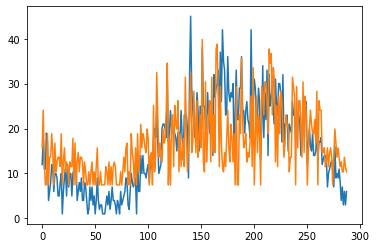

14899 0.4861111044883728 0.6423611044883728


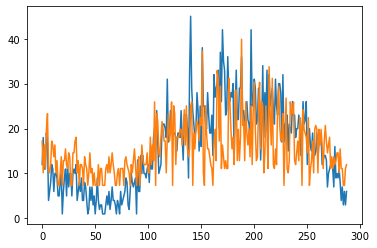

14999 0.84375 0.0


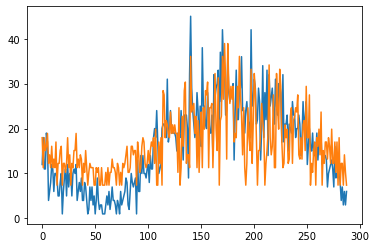

[[ 9.]
 [ 2.]
 [ 9.]
 [ 6.]
 [ 7.]
 [10.]
 [ 3.]
 [ 5.]
 [ 2.]
 [ 7.]
 [ 2.]
 [ 4.]
 [ 2.]
 [ 8.]
 [ 0.]
 [ 3.]
 [ 3.]
 [ 6.]
 [ 7.]
 [ 0.]
 [ 3.]
 [ 3.]
 [ 1.]
 [ 3.]
 [ 9.]
 [ 2.]
 [ 5.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 6.]
 [ 6.]
 [10.]
 [ 2.]
 [ 4.]
 [ 2.]
 [ 5.]
 [ 4.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 6.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 4.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 3.]
 [ 5.]
 [ 7.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 7.]
 [ 7.]
 [ 5.]
 [ 6.]
 [ 6.]
 [ 0.]
 [ 8.]
 [ 5.]
 [ 1.]
 [ 2.]
 [ 7.]
 [ 9.]
 [ 8.]
 [ 3.]
 [ 2.]
 [ 3.]
 [ 6.]
 [ 3.]
 [ 6.]
 [ 8.]
 [ 7.]
 [ 9.]
 [ 3.]
 [11.]
 [ 0.]
 [ 0.]
 [ 8.]
 [ 3.]
 [ 9.]
 [ 0.]
 [20.]
 [19.]
 [ 9.]
 [13.]
 [12.]
 [10.]
 [ 9.]
 [15.]
 [10.]
 [12.]
 [10.]
 [12.]
 [10.]
 [10.]
 [ 1.]
 [16.]
 [ 0.]
 [ 2.]
 [14.]
 [ 7.]
 [20.]
 [22.]
 [ 3.]
 [ 5.]
 [ 5.]
 [ 2.]
 [28.]
 [15.]
 [16.]

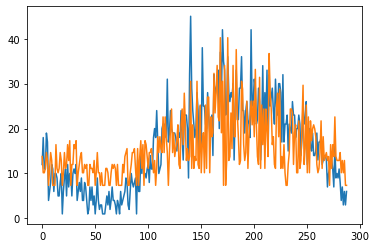

15199 0.96875 0.0


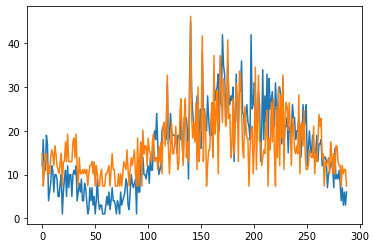

[[ 6.]
 [ 0.]
 [ 1.]
 [ 6.]
 [ 6.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 5.]
 [ 7.]
 [ 6.]
 [ 3.]
 [ 8.]
 [ 6.]
 [ 3.]
 [ 2.]
 [ 1.]
 [ 4.]
 [ 6.]
 [ 0.]
 [ 4.]
 [ 4.]
 [ 9.]
 [ 4.]
 [11.]
 [ 4.]
 [ 4.]
 [ 4.]
 [ 4.]
 [ 9.]
 [10.]
 [ 5.]
 [11.]
 [ 2.]
 [ 0.]
 [ 5.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 3.]
 [ 4.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 6.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 3.]
 [ 2.]
 [ 7.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 5.]
 [ 3.]
 [ 5.]
 [ 7.]
 [ 1.]
 [ 0.]
 [10.]
 [ 0.]
 [ 5.]
 [ 9.]
 [ 0.]
 [12.]
 [ 6.]
 [ 8.]
 [ 8.]
 [ 3.]
 [10.]
 [ 7.]
 [ 6.]
 [ 4.]
 [ 9.]
 [11.]
 [ 4.]
 [ 5.]
 [ 5.]
 [ 2.]
 [ 8.]
 [ 4.]
 [ 9.]
 [ 1.]
 [13.]
 [14.]
 [ 8.]
 [14.]
 [26.]
 [ 8.]
 [ 1.]
 [ 7.]
 [14.]
 [ 6.]
 [ 6.]
 [ 9.]
 [13.]
 [ 7.]
 [ 2.]
 [ 4.]
 [17.]
 [20.]
 [ 9.]
 [ 3.]
 [15.]
 [20.]
 [ 5.]
 [ 9.]
 [ 4.]
 [18.]
 [41.]
 [15.]
 [10.]

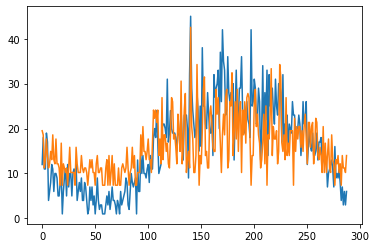

15399 1.0 0.0


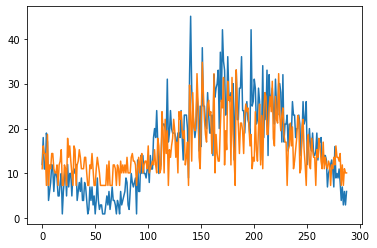

[[ 2.]
 [ 8.]
 [ 6.]
 [ 6.]
 [ 0.]
 [11.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 6.]
 [ 6.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 3.]
 [ 4.]
 [ 7.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 0.]
 [10.]
 [ 5.]
 [ 8.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 8.]
 [ 7.]
 [ 0.]
 [ 3.]
 [ 4.]
 [ 7.]
 [ 5.]
 [ 2.]
 [ 2.]
 [ 2.]
 [ 5.]
 [ 5.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 6.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 5.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 4.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 5.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 5.]
 [ 6.]
 [ 4.]
 [ 4.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 5.]
 [ 1.]
 [ 5.]
 [ 6.]
 [ 1.]
 [ 3.]
 [ 4.]
 [ 4.]
 [ 2.]
 [ 8.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 4.]
 [ 3.]
 [ 7.]
 [ 3.]
 [ 1.]
 [10.]
 [ 8.]
 [ 1.]
 [ 2.]
 [17.]
 [12.]
 [ 1.]
 [15.]
 [ 6.]
 [12.]
 [ 0.]
 [ 7.]
 [ 5.]
 [ 8.]
 [10.]
 [15.]
 [12.]
 [ 5.]
 [ 9.]
 [ 1.]
 [17.]
 [15.]
 [17.]
 [12.]
 [10.]
 [12.]
 [ 3.]
 [ 5.]
 [ 9.]
 [ 0.]
 [24.]
 [16.]
 [ 4.]
 [22.]

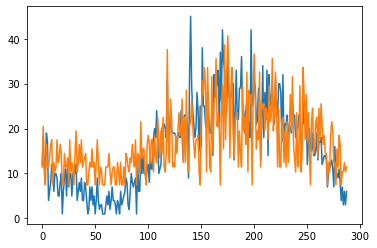

15599 1.0 0.0


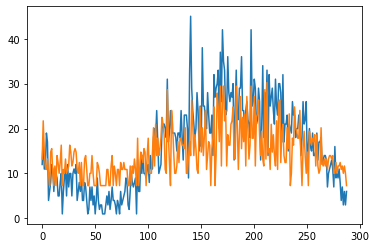

[[ 5.]
 [16.]
 [ 7.]
 [ 3.]
 [ 2.]
 [ 5.]
 [ 1.]
 [ 0.]
 [ 7.]
 [ 8.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 6.]
 [ 4.]
 [ 1.]
 [ 4.]
 [ 9.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 5.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 9.]
 [ 7.]
 [ 3.]
 [ 4.]
 [ 7.]
 [ 8.]
 [ 7.]
 [ 2.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 6.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 6.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 6.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 4.]
 [ 2.]
 [ 2.]
 [ 4.]
 [ 2.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 5.]
 [ 2.]
 [ 0.]
 [11.]
 [ 0.]
 [ 2.]
 [ 7.]
 [ 6.]
 [ 4.]
 [ 8.]
 [ 7.]
 [ 0.]
 [ 6.]
 [11.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 7.]
 [14.]
 [ 3.]
 [15.]
 [ 6.]
 [11.]
 [ 6.]
 [ 8.]
 [11.]
 [17.]
 [15.]
 [12.]
 [ 2.]
 [ 1.]
 [25.]
 [12.]
 [ 4.]
 [ 0.]
 [19.]
 [15.]
 [ 7.]
 [ 1.]
 [ 1.]
 [ 3.]
 [10.]
 [ 4.]
 [11.]
 [11.]
 [ 9.]
 [ 9.]
 [ 8.]
 [14.]
 [ 1.]
 [ 1.]
 [ 6.]
 [10.]
 [ 6.]
 [22.]
 [15.]

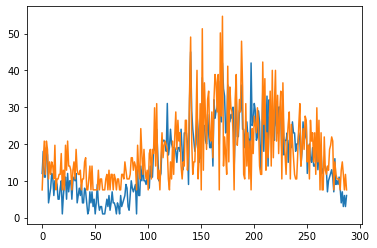

15799 1.0 0.0


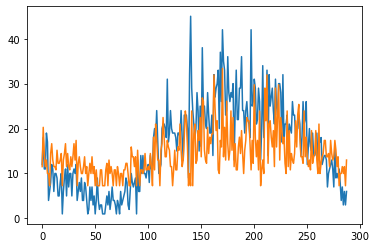

[[ 3.]
 [15.]
 [ 7.]
 [ 3.]
 [ 5.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 7.]
 [10.]
 [ 5.]
 [ 3.]
 [ 3.]
 [ 2.]
 [ 8.]
 [ 4.]
 [ 4.]
 [ 5.]
 [ 7.]
 [ 0.]
 [ 5.]
 [ 7.]
 [10.]
 [ 3.]
 [ 7.]
 [ 3.]
 [ 2.]
 [ 6.]
 [ 3.]
 [ 6.]
 [10.]
 [ 5.]
 [11.]
 [ 0.]
 [ 4.]
 [ 6.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 3.]
 [ 6.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 1.]
 [ 6.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 4.]
 [ 0.]
 [ 5.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 4.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 9.]
 [ 6.]
 [ 6.]
 [ 3.]
 [ 6.]
 [ 0.]
 [ 8.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 7.]
 [ 2.]
 [ 2.]
 [ 3.]
 [ 2.]
 [ 7.]
 [ 3.]
 [ 0.]
 [12.]
 [ 2.]
 [16.]
 [11.]
 [ 5.]
 [ 5.]
 [ 0.]
 [ 8.]
 [10.]
 [18.]
 [12.]
 [ 6.]
 [ 6.]
 [11.]
 [ 9.]
 [ 8.]
 [ 3.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 8.]
 [ 2.]
 [ 2.]
 [ 9.]
 [ 8.]
 [16.]
 [ 8.]
 [ 3.]
 [ 5.]
 [12.]
 [20.]
 [17.]
 [ 9.]
 [ 0.]
 [ 1.]
 [ 0.]
 [20.]
 [ 0.]

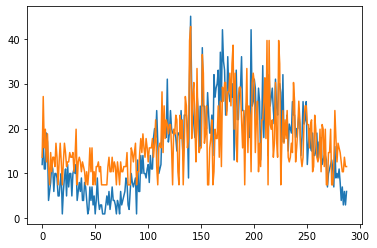

15999 0.0 1.0


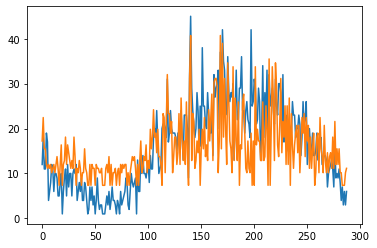

16099 1.0 0.0


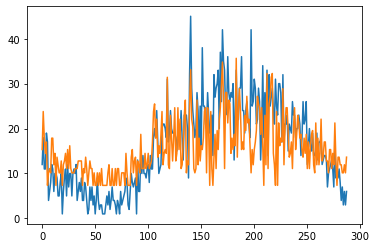

[[ 7.]
 [17.]
 [10.]
 [ 6.]
 [ 9.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 1.]
 [10.]
 [10.]
 [ 3.]
 [ 6.]
 [ 0.]
 [ 5.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 3.]
 [ 4.]
 [ 6.]
 [ 2.]
 [ 7.]
 [ 2.]
 [ 8.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 2.]
 [ 2.]
 [ 4.]
 [ 4.]
 [ 4.]
 [ 4.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 5.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 6.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 7.]
 [ 1.]
 [ 4.]
 [ 5.]
 [ 0.]
 [ 4.]
 [ 3.]
 [ 1.]
 [11.]
 [ 2.]
 [ 2.]
 [ 2.]
 [ 6.]
 [ 2.]
 [ 3.]
 [ 6.]
 [ 2.]
 [ 3.]
 [ 4.]
 [ 9.]
 [17.]
 [19.]
 [10.]
 [15.]
 [ 5.]
 [ 8.]
 [ 6.]
 [11.]
 [17.]
 [ 3.]
 [ 6.]
 [ 7.]
 [ 6.]
 [26.]
 [ 3.]
 [ 2.]
 [16.]
 [10.]
 [ 4.]
 [10.]
 [18.]
 [ 4.]
 [ 6.]
 [18.]
 [ 7.]
 [15.]
 [ 2.]
 [ 3.]
 [ 9.]
 [16.]
 [20.]
 [ 1.]
 [ 4.]
 [ 3.]
 [19.]
 [28.]
 [15.]
 [13.]

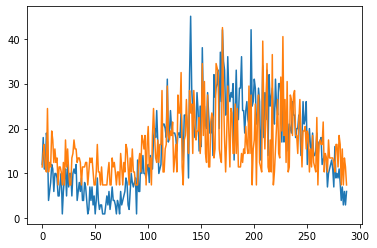

16299 0.96875 0.0


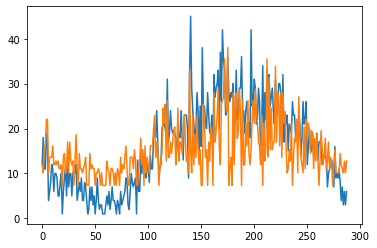

[[ 3.]
 [ 1.]
 [ 8.]
 [ 8.]
 [15.]
 [15.]
 [ 1.]
 [ 5.]
 [ 5.]
 [ 5.]
 [ 8.]
 [ 3.]
 [ 3.]
 [ 4.]
 [ 3.]
 [ 4.]
 [ 2.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 5.]
 [ 6.]
 [ 1.]
 [ 2.]
 [ 9.]
 [ 1.]
 [ 9.]
 [ 4.]
 [ 3.]
 [ 4.]
 [ 0.]
 [ 4.]
 [11.]
 [ 2.]
 [ 0.]
 [ 6.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 5.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 6.]
 [ 2.]
 [ 3.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 5.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 5.]
 [ 8.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 5.]
 [ 5.]
 [ 2.]
 [ 7.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 4.]
 [10.]
 [ 3.]
 [ 7.]
 [ 0.]
 [ 8.]
 [ 1.]
 [ 5.]
 [ 3.]
 [ 1.]
 [ 8.]
 [ 8.]
 [ 8.]
 [12.]
 [16.]
 [ 5.]
 [ 9.]
 [ 8.]
 [ 0.]
 [ 2.]
 [ 5.]
 [ 6.]
 [18.]
 [14.]
 [19.]
 [ 4.]
 [20.]
 [ 5.]
 [ 5.]
 [ 9.]
 [ 6.]
 [ 9.]
 [12.]
 [13.]
 [ 3.]
 [ 7.]
 [18.]
 [ 4.]
 [ 9.]
 [ 9.]
 [ 6.]
 [11.]
 [16.]
 [10.]
 [ 4.]
 [ 4.]
 [ 1.]
 [28.]
 [ 7.]
 [ 1.]
 [16.]

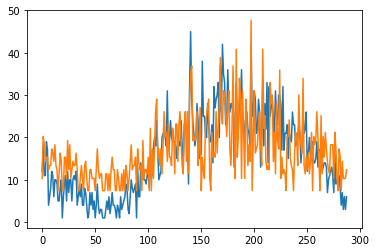

16499 1.0 0.0


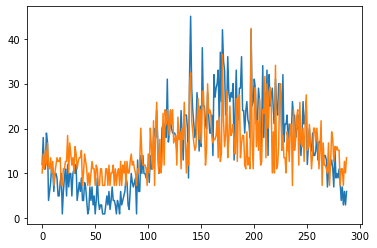

[[ 1.]
 [ 6.]
 [ 2.]
 [ 7.]
 [ 3.]
 [ 9.]
 [ 3.]
 [ 2.]
 [ 5.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 5.]
 [ 4.]
 [ 4.]
 [ 5.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 4.]
 [ 4.]
 [11.]
 [ 1.]
 [ 9.]
 [ 6.]
 [ 3.]
 [ 5.]
 [ 1.]
 [ 8.]
 [ 6.]
 [ 2.]
 [ 4.]
 [ 5.]
 [ 5.]
 [ 7.]
 [ 0.]
 [ 1.]
 [ 6.]
 [ 4.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 4.]
 [ 1.]
 [ 1.]
 [ 4.]
 [ 6.]
 [ 3.]
 [ 4.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 4.]
 [13.]
 [ 6.]
 [ 3.]
 [ 3.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 6.]
 [ 1.]
 [13.]
 [ 8.]
 [ 2.]
 [15.]
 [ 0.]
 [13.]
 [20.]
 [ 6.]
 [ 1.]
 [10.]
 [ 1.]
 [ 4.]
 [17.]
 [ 3.]
 [18.]
 [14.]
 [18.]
 [14.]
 [11.]
 [18.]
 [14.]
 [18.]
 [ 9.]
 [10.]
 [11.]
 [ 3.]
 [16.]
 [10.]
 [12.]
 [ 2.]
 [13.]
 [10.]
 [20.]
 [10.]
 [ 1.]
 [ 9.]
 [ 3.]
 [25.]
 [28.]
 [15.]
 [12.]

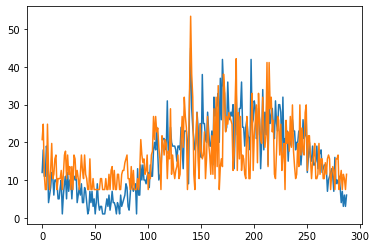

16699 1.0 0.0


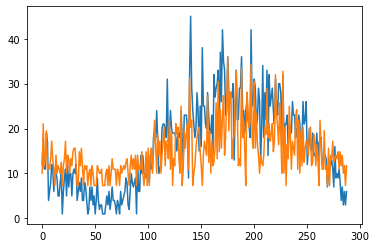

[[ 1.]
 [15.]
 [ 3.]
 [ 5.]
 [13.]
 [ 2.]
 [ 3.]
 [ 2.]
 [ 5.]
 [10.]
 [ 5.]
 [ 2.]
 [ 0.]
 [ 6.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 3.]
 [ 5.]
 [10.]
 [ 1.]
 [ 6.]
 [ 5.]
 [ 1.]
 [ 5.]
 [ 3.]
 [ 7.]
 [ 8.]
 [ 8.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 7.]
 [ 3.]
 [ 8.]
 [ 3.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 5.]
 [ 2.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 2.]
 [ 4.]
 [ 5.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 6.]
 [ 2.]
 [ 5.]
 [ 2.]
 [ 6.]
 [ 0.]
 [ 6.]
 [ 2.]
 [ 3.]
 [ 2.]
 [ 7.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 7.]
 [ 0.]
 [ 8.]
 [ 0.]
 [ 6.]
 [ 8.]
 [ 1.]
 [ 7.]
 [16.]
 [ 9.]
 [ 1.]
 [12.]
 [ 6.]
 [10.]
 [ 1.]
 [ 6.]
 [10.]
 [14.]
 [ 3.]
 [10.]
 [ 9.]
 [ 5.]
 [16.]
 [ 2.]
 [13.]
 [ 0.]
 [ 5.]
 [ 3.]
 [15.]
 [12.]
 [14.]
 [ 5.]
 [ 1.]
 [20.]
 [ 0.]
 [ 2.]
 [13.]
 [ 8.]
 [12.]
 [15.]
 [ 2.]
 [28.]
 [14.]
 [16.]
 [ 0.]

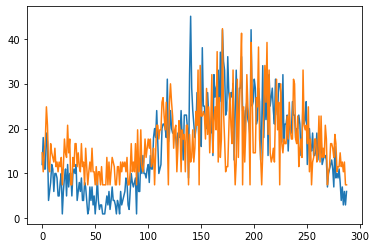

16899 1.0 0.0


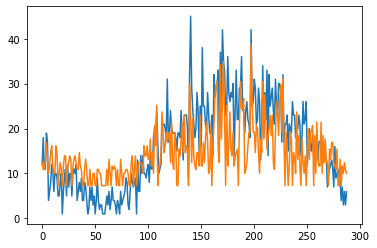

[[ 4.]
 [ 2.]
 [ 2.]
 [ 5.]
 [10.]
 [ 5.]
 [ 1.]
 [ 3.]
 [ 7.]
 [ 9.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 9.]
 [ 7.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 6.]
 [ 6.]
 [ 0.]
 [ 3.]
 [ 4.]
 [ 6.]
 [ 5.]
 [ 0.]
 [ 3.]
 [ 5.]
 [ 6.]
 [ 4.]
 [ 2.]
 [ 2.]
 [ 7.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 5.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 5.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 6.]
 [ 0.]
 [ 2.]
 [ 6.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 4.]
 [ 4.]
 [ 3.]
 [ 1.]
 [ 9.]
 [ 6.]
 [ 6.]
 [ 9.]
 [ 5.]
 [ 5.]
 [11.]
 [ 3.]
 [ 7.]
 [ 1.]
 [15.]
 [ 9.]
 [21.]
 [ 0.]
 [ 3.]
 [ 3.]
 [ 7.]
 [19.]
 [13.]
 [ 7.]
 [ 9.]
 [13.]
 [10.]
 [12.]
 [13.]
 [ 4.]
 [16.]
 [ 4.]
 [ 2.]
 [13.]
 [ 9.]
 [ 0.]
 [ 0.]
 [ 8.]
 [ 6.]
 [11.]
 [16.]
 [ 7.]
 [18.]
 [ 7.]
 [ 9.]
 [ 8.]
 [ 0.]
 [27.]
 [18.]
 [ 4.]
 [17.]

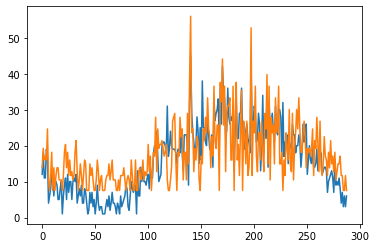

17099 0.0 1.0


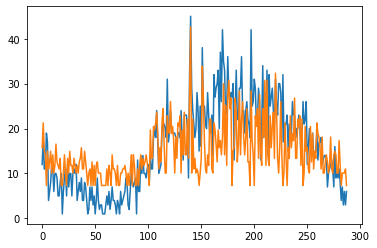

17199 1.0 0.0


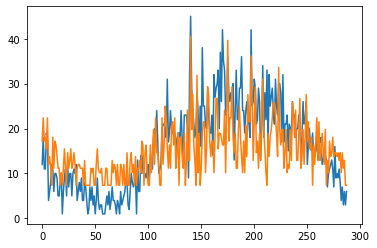

[[ 9.]
 [15.]
 [ 9.]
 [10.]
 [ 7.]
 [15.]
 [ 3.]
 [ 5.]
 [ 2.]
 [ 0.]
 [10.]
 [ 2.]
 [ 9.]
 [ 8.]
 [ 5.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 7.]
 [ 2.]
 [ 0.]
 [ 6.]
 [ 2.]
 [ 4.]
 [ 7.]
 [ 2.]
 [ 3.]
 [ 6.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 3.]
 [ 2.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 7.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 6.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 6.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 5.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 4.]
 [ 1.]
 [ 9.]
 [ 8.]
 [ 0.]
 [ 6.]
 [ 8.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 8.]
 [ 1.]
 [ 6.]
 [12.]
 [ 3.]
 [15.]
 [ 6.]
 [ 6.]
 [ 3.]
 [ 0.]
 [ 0.]
 [15.]
 [ 3.]
 [ 8.]
 [18.]
 [15.]
 [ 7.]
 [ 2.]
 [ 8.]
 [ 2.]
 [13.]
 [14.]
 [ 8.]
 [15.]
 [ 2.]
 [ 6.]
 [11.]
 [ 0.]
 [10.]
 [10.]
 [ 5.]
 [ 2.]
 [11.]
 [ 0.]
 [ 3.]
 [17.]
 [ 4.]
 [ 4.]
 [36.]
 [12.]
 [21.]

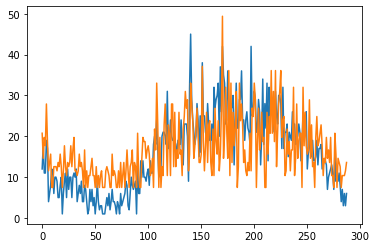

17399 1.0 0.0


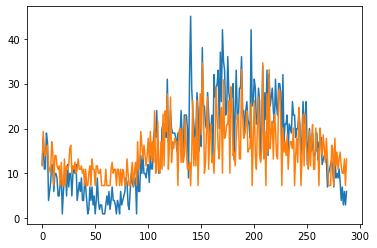

[[ 3.]
 [13.]
 [ 7.]
 [ 6.]
 [ 8.]
 [ 9.]
 [ 3.]
 [ 2.]
 [ 1.]
 [10.]
 [ 7.]
 [ 0.]
 [ 6.]
 [ 6.]
 [ 3.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 3.]
 [ 8.]
 [ 9.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 4.]
 [ 1.]
 [ 2.]
 [ 5.]
 [ 2.]
 [ 2.]
 [ 3.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 5.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 4.]
 [ 1.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 0.]
 [10.]
 [ 2.]
 [ 4.]
 [13.]
 [ 9.]
 [ 5.]
 [ 9.]
 [ 6.]
 [ 3.]
 [ 6.]
 [11.]
 [ 4.]
 [13.]
 [ 5.]
 [10.]
 [ 4.]
 [19.]
 [ 1.]
 [ 2.]
 [16.]
 [ 2.]
 [ 1.]
 [10.]
 [ 2.]
 [18.]
 [ 3.]
 [19.]
 [13.]
 [24.]
 [ 2.]
 [ 9.]
 [23.]
 [ 4.]
 [10.]
 [ 8.]
 [11.]
 [10.]
 [10.]
 [ 0.]
 [13.]
 [14.]
 [ 4.]
 [14.]
 [ 4.]
 [ 6.]
 [17.]
 [ 7.]
 [ 2.]
 [ 2.]
 [ 4.]
 [ 0.]
 [ 7.]
 [22.]

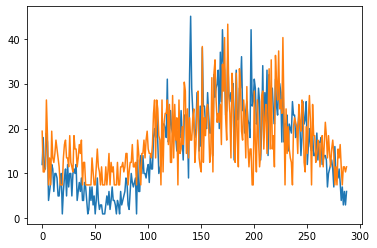

[[10.]
 [ 1.]
 [ 1.]
 [ 2.]
 [17.]
 [ 9.]
 [ 0.]
 [ 4.]
 [ 0.]
 [10.]
 [ 4.]
 [ 3.]
 [ 5.]
 [ 8.]
 [ 6.]
 [ 4.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 7.]
 [ 8.]
 [ 4.]
 [ 4.]
 [ 2.]
 [ 9.]
 [ 3.]
 [ 2.]
 [ 1.]
 [ 9.]
 [ 6.]
 [ 6.]
 [ 2.]
 [ 4.]
 [ 7.]
 [ 5.]
 [ 8.]
 [ 0.]
 [ 3.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 6.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 5.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 3.]
 [ 1.]
 [ 2.]
 [ 5.]
 [ 5.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 3.]
 [ 7.]
 [ 2.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 8.]
 [ 5.]
 [ 2.]
 [ 0.]
 [ 5.]
 [ 5.]
 [ 8.]
 [ 4.]
 [ 8.]
 [10.]
 [ 6.]
 [ 5.]
 [ 5.]
 [ 4.]
 [ 7.]
 [14.]
 [17.]
 [ 4.]
 [17.]
 [15.]
 [ 9.]
 [ 8.]
 [ 0.]
 [17.]
 [ 1.]
 [12.]
 [14.]
 [14.]
 [17.]
 [ 7.]
 [16.]
 [ 3.]
 [ 3.]
 [18.]
 [ 4.]
 [16.]
 [ 8.]
 [13.]
 [ 0.]
 [17.]
 [ 5.]
 [ 6.]
 [11.]
 [ 7.]
 [21.]
 [19.]
 [ 5.]
 [15.]
 [ 4.]
 [13.]
 [ 8.]
 [ 8.]
 [13.]

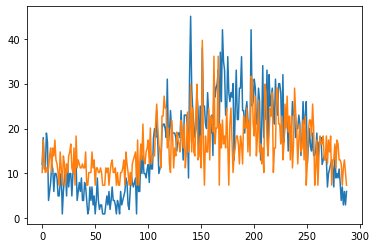

17699 1.0 0.0


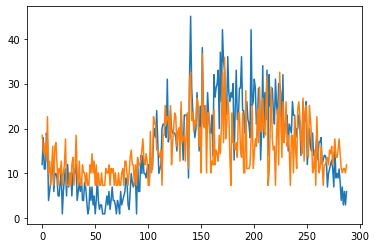

[[11.]
 [ 7.]
 [ 6.]
 [ 9.]
 [ 4.]
 [16.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 3.]
 [ 8.]
 [ 0.]
 [ 8.]
 [ 9.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 3.]
 [10.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 5.]
 [ 0.]
 [ 2.]
 [11.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 6.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 4.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 5.]
 [ 7.]
 [ 3.]
 [ 3.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 5.]
 [ 3.]
 [ 3.]
 [ 4.]
 [ 7.]
 [10.]
 [ 4.]
 [ 3.]
 [ 6.]
 [ 4.]
 [ 0.]
 [ 0.]
 [12.]
 [ 1.]
 [ 3.]
 [16.]
 [14.]
 [14.]
 [ 7.]
 [ 7.]
 [ 6.]
 [ 5.]
 [ 7.]
 [ 0.]
 [11.]
 [11.]
 [19.]
 [14.]
 [16.]
 [16.]
 [10.]
 [19.]
 [ 3.]
 [ 9.]
 [13.]
 [17.]
 [16.]
 [ 8.]
 [12.]
 [13.]
 [ 4.]
 [20.]
 [ 9.]
 [10.]
 [11.]
 [ 4.]
 [13.]
 [17.]
 [ 2.]
 [26.]
 [28.]
 [15.]
 [17.]

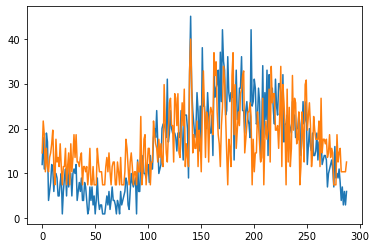

17899 1.0 0.0


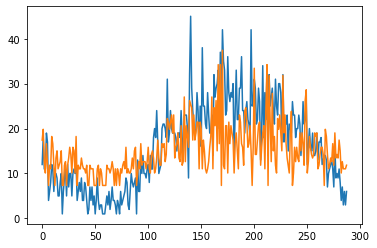

[[10.]
 [13.]
 [ 4.]
 [ 1.]
 [ 9.]
 [ 3.]
 [ 0.]
 [ 3.]
 [ 2.]
 [11.]
 [ 9.]
 [ 3.]
 [ 0.]
 [ 5.]
 [ 7.]
 [ 2.]
 [ 3.]
 [ 4.]
 [ 7.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 4.]
 [ 0.]
 [ 3.]
 [ 5.]
 [ 8.]
 [ 6.]
 [ 1.]
 [ 8.]
 [ 7.]
 [ 1.]
 [11.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 2.]
 [ 5.]
 [ 3.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 4.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 3.]
 [ 4.]
 [ 2.]
 [ 8.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 5.]
 [ 2.]
 [ 7.]
 [ 8.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 2.]
 [ 9.]
 [ 3.]
 [ 4.]
 [ 4.]
 [ 4.]
 [ 2.]
 [ 4.]
 [ 8.]
 [ 2.]
 [ 1.]
 [ 6.]
 [ 7.]
 [ 5.]
 [ 1.]
 [ 2.]
 [ 5.]
 [10.]
 [ 5.]
 [ 3.]
 [ 3.]
 [ 9.]
 [ 8.]
 [ 9.]
 [ 4.]
 [ 6.]
 [16.]
 [15.]
 [13.]
 [15.]
 [17.]
 [12.]
 [17.]
 [ 5.]
 [ 8.]
 [ 9.]
 [12.]
 [ 5.]
 [ 4.]
 [14.]
 [ 3.]
 [ 4.]
 [22.]
 [ 4.]
 [14.]
 [11.]
 [ 8.]
 [21.]
 [20.]
 [19.]
 [10.]

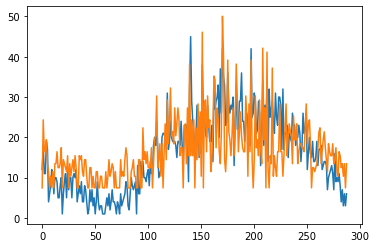

18099 0.0 1.0


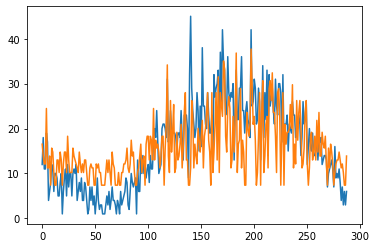

18199 1.0 0.0


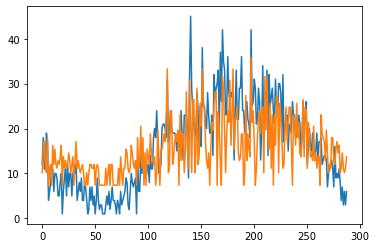

[[ 1.]
 [ 7.]
 [ 9.]
 [ 3.]
 [ 1.]
 [10.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 8.]
 [ 3.]
 [ 7.]
 [ 3.]
 [ 2.]
 [ 4.]
 [ 3.]
 [ 5.]
 [ 8.]
 [ 0.]
 [ 5.]
 [ 2.]
 [ 4.]
 [ 2.]
 [ 3.]
 [ 6.]
 [ 4.]
 [ 1.]
 [ 3.]
 [ 5.]
 [ 0.]
 [ 4.]
 [ 9.]
 [ 2.]
 [ 4.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 3.]
 [ 2.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 3.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 5.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 7.]
 [ 6.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 8.]
 [ 6.]
 [ 3.]
 [ 2.]
 [ 4.]
 [ 0.]
 [10.]
 [ 2.]
 [ 4.]
 [13.]
 [ 2.]
 [10.]
 [ 0.]
 [ 6.]
 [ 0.]
 [ 7.]
 [ 5.]
 [ 3.]
 [11.]
 [ 6.]
 [ 4.]
 [ 3.]
 [ 5.]
 [ 0.]
 [ 1.]
 [12.]
 [ 6.]
 [ 0.]
 [ 7.]
 [ 7.]
 [ 9.]
 [11.]
 [ 9.]
 [16.]
 [28.]
 [ 1.]
 [ 2.]
 [17.]
 [17.]
 [ 3.]
 [ 5.]
 [ 9.]
 [11.]
 [ 9.]
 [12.]
 [ 0.]
 [16.]
 [ 4.]
 [11.]
 [11.]
 [ 1.]
 [ 7.]
 [22.]
 [ 7.]
 [ 2.]
 [25.]
 [14.]
 [ 1.]
 [20.]

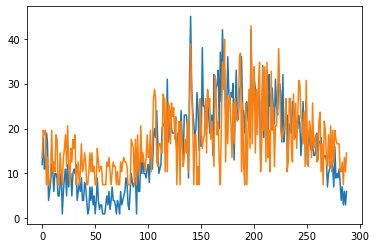

18399 1.0 0.0


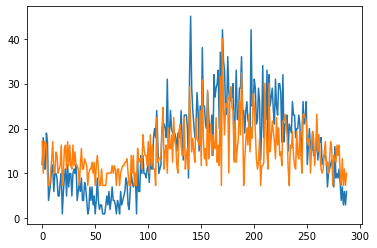

[[10.]
 [ 1.]
 [10.]
 [10.]
 [ 9.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 5.]
 [10.]
 [ 1.]
 [ 1.]
 [ 7.]
 [ 6.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 9.]
 [ 0.]
 [ 1.]
 [ 8.]
 [ 9.]
 [ 2.]
 [10.]
 [ 3.]
 [ 9.]
 [ 3.]
 [ 2.]
 [ 9.]
 [ 3.]
 [ 7.]
 [ 3.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 8.]
 [ 2.]
 [ 2.]
 [ 5.]
 [ 4.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 2.]
 [ 4.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 3.]
 [ 6.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 3.]
 [ 4.]
 [ 4.]
 [ 5.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 6.]
 [ 1.]
 [ 6.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 8.]
 [ 4.]
 [ 5.]
 [ 5.]
 [ 2.]
 [12.]
 [ 8.]
 [ 6.]
 [ 6.]
 [ 3.]
 [10.]
 [ 1.]
 [12.]
 [ 3.]
 [ 9.]
 [ 2.]
 [ 2.]
 [ 0.]
 [17.]
 [ 4.]
 [ 5.]
 [ 5.]
 [ 6.]
 [14.]
 [20.]
 [ 2.]
 [ 7.]
 [ 9.]
 [ 1.]
 [14.]
 [ 8.]
 [ 8.]
 [12.]
 [ 4.]
 [17.]
 [10.]
 [ 9.]
 [ 3.]
 [ 1.]
 [13.]
 [15.]
 [ 9.]
 [ 6.]
 [ 6.]
 [17.]
 [ 2.]
 [ 6.]
 [ 8.]
 [ 2.]
 [26.]
 [15.]
 [ 7.]
 [11.]

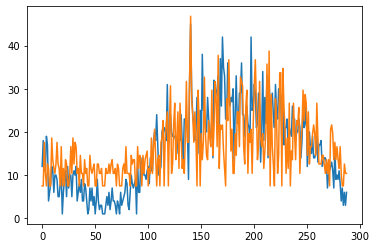

18599 0.96875 0.0


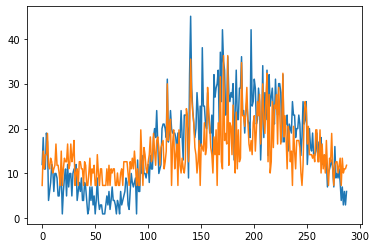

[[ 0.]
 [ 7.]
 [ 2.]
 [ 6.]
 [ 6.]
 [12.]
 [ 3.]
 [ 2.]
 [ 5.]
 [ 4.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 9.]
 [ 3.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 7.]
 [ 0.]
 [ 2.]
 [ 5.]
 [ 4.]
 [ 4.]
 [ 9.]
 [ 2.]
 [ 3.]
 [ 9.]
 [ 4.]
 [ 6.]
 [10.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 4.]
 [ 4.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 4.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 5.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 6.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 4.]
 [ 4.]
 [ 4.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 2.]
 [ 5.]
 [ 2.]
 [ 7.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [13.]
 [ 5.]
 [ 0.]
 [ 8.]
 [ 6.]
 [ 2.]
 [ 1.]
 [ 4.]
 [ 6.]
 [11.]
 [ 4.]
 [ 5.]
 [12.]
 [ 7.]
 [ 3.]
 [10.]
 [11.]
 [ 8.]
 [ 3.]
 [ 8.]
 [ 9.]
 [10.]
 [ 2.]
 [ 4.]
 [ 7.]
 [26.]
 [10.]
 [14.]
 [16.]
 [ 0.]
 [ 9.]
 [13.]
 [ 2.]
 [ 6.]
 [ 9.]
 [ 0.]
 [13.]
 [ 3.]
 [ 1.]
 [ 5.]
 [ 2.]
 [ 1.]
 [ 4.]
 [19.]
 [17.]
 [ 4.]
 [10.]
 [33.]
 [22.]
 [18.]

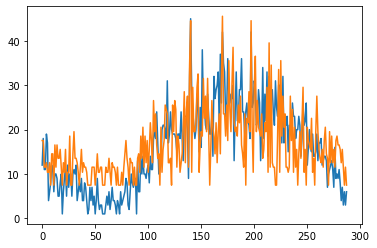

18799 0.0 1.0


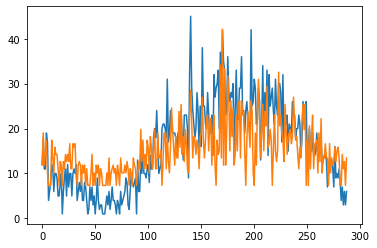

18899 1.0 0.0


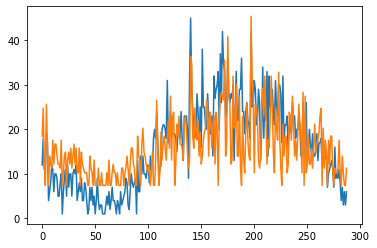

[[10.]
 [17.]
 [ 3.]
 [ 0.]
 [18.]
 [ 7.]
 [ 0.]
 [ 5.]
 [ 3.]
 [ 2.]
 [ 9.]
 [ 3.]
 [ 8.]
 [ 8.]
 [ 5.]
 [ 3.]
 [ 3.]
 [ 2.]
 [ 9.]
 [ 0.]
 [ 1.]
 [ 5.]
 [ 6.]
 [ 0.]
 [ 4.]
 [ 6.]
 [ 3.]
 [ 7.]
 [ 2.]
 [ 5.]
 [ 8.]
 [ 3.]
 [ 7.]
 [ 1.]
 [ 1.]
 [ 7.]
 [ 0.]
 [ 6.]
 [ 3.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 5.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 7.]
 [ 7.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 0.]
 [10.]
 [ 5.]
 [ 4.]
 [ 0.]
 [ 8.]
 [12.]
 [ 6.]
 [ 5.]
 [ 3.]
 [ 2.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 6.]
 [ 0.]
 [ 0.]
 [ 4.]
 [19.]
 [ 7.]
 [ 0.]
 [ 1.]
 [11.]
 [ 4.]
 [ 8.]
 [10.]
 [ 7.]
 [ 4.]
 [10.]
 [14.]
 [ 7.]
 [20.]
 [ 4.]
 [15.]
 [16.]
 [ 0.]
 [ 3.]
 [13.]
 [10.]
 [15.]
 [ 8.]
 [ 8.]
 [ 7.]
 [ 4.]
 [13.]
 [15.]
 [12.]
 [ 6.]
 [ 2.]
 [ 4.]
 [30.]
 [28.]
 [10.]

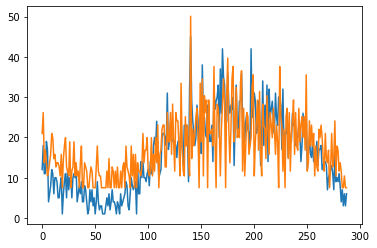

19099 1.0 0.0


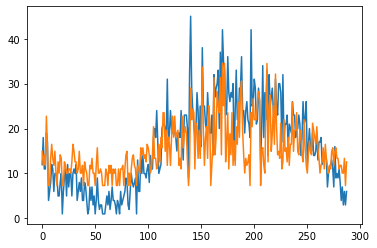

[[ 7.]
 [ 3.]
 [ 6.]
 [ 3.]
 [17.]
 [ 7.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 9.]
 [ 5.]
 [ 3.]
 [ 7.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 1.]
 [ 6.]
 [ 5.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 4.]
 [ 9.]
 [ 7.]
 [ 4.]
 [ 4.]
 [ 1.]
 [ 2.]
 [ 7.]
 [ 1.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 4.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 5.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 8.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 6.]
 [ 7.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 5.]
 [ 6.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 1.]
 [ 8.]
 [ 6.]
 [ 8.]
 [ 5.]
 [ 6.]
 [ 4.]
 [ 9.]
 [ 8.]
 [ 6.]
 [ 1.]
 [ 2.]
 [ 6.]
 [14.]
 [ 5.]
 [ 5.]
 [ 2.]
 [ 3.]
 [ 9.]
 [ 4.]
 [11.]
 [ 8.]
 [18.]
 [18.]
 [ 7.]
 [13.]
 [ 3.]
 [11.]
 [ 9.]
 [ 3.]
 [11.]
 [17.]
 [11.]
 [17.]
 [11.]
 [12.]
 [13.]
 [ 3.]
 [ 5.]
 [ 2.]
 [17.]
 [ 8.]
 [12.]
 [14.]
 [12.]
 [ 4.]
 [ 0.]
 [ 3.]
 [25.]
 [16.]
 [19.]

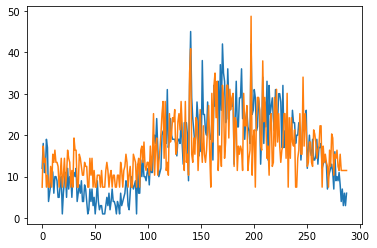

19299 0.0 1.0


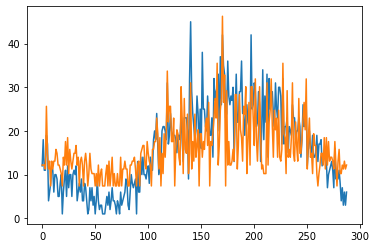

19399 1.0 0.0


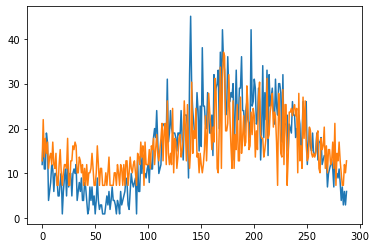

[[ 4.]
 [15.]
 [ 5.]
 [10.]
 [ 6.]
 [ 9.]
 [ 2.]
 [ 5.]
 [ 6.]
 [ 3.]
 [ 9.]
 [ 3.]
 [ 2.]
 [ 6.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 7.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 3.]
 [ 2.]
 [10.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 4.]
 [ 8.]
 [ 7.]
 [ 9.]
 [ 8.]
 [ 1.]
 [ 1.]
 [ 5.]
 [ 4.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 6.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 8.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 5.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 4.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 5.]
 [ 2.]
 [ 1.]
 [ 3.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 6.]
 [ 5.]
 [ 3.]
 [ 9.]
 [ 5.]
 [ 8.]
 [ 0.]
 [ 9.]
 [ 3.]
 [ 3.]
 [ 3.]
 [ 7.]
 [ 2.]
 [ 8.]
 [ 7.]
 [10.]
 [ 3.]
 [ 7.]
 [11.]
 [ 6.]
 [ 4.]
 [ 7.]
 [10.]
 [14.]
 [ 4.]
 [12.]
 [14.]
 [ 3.]
 [20.]
 [ 6.]
 [ 3.]
 [ 6.]
 [ 3.]
 [18.]
 [ 1.]
 [10.]
 [ 9.]
 [ 2.]
 [ 5.]
 [10.]
 [11.]
 [ 5.]
 [ 7.]
 [10.]
 [20.]
 [13.]
 [ 4.]
 [19.]
 [ 7.]
 [ 2.]
 [ 7.]
 [25.]
 [ 6.]

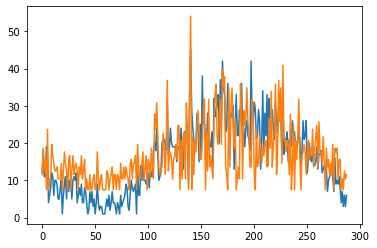

19599 1.0 0.0


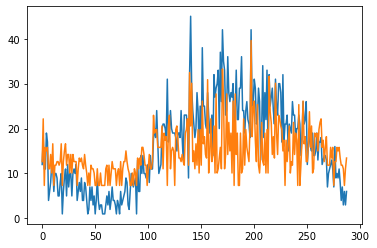

[[ 4.]
 [16.]
 [ 0.]
 [ 8.]
 [ 7.]
 [ 8.]
 [ 2.]
 [ 2.]
 [ 6.]
 [ 1.]
 [ 9.]
 [ 0.]
 [ 3.]
 [ 3.]
 [ 4.]
 [ 4.]
 [ 3.]
 [ 4.]
 [ 9.]
 [ 0.]
 [ 4.]
 [ 7.]
 [ 9.]
 [ 3.]
 [ 6.]
 [ 6.]
 [ 1.]
 [ 6.]
 [ 1.]
 [ 6.]
 [ 4.]
 [ 4.]
 [ 4.]
 [ 0.]
 [ 2.]
 [ 5.]
 [ 4.]
 [ 5.]
 [ 3.]
 [ 2.]
 [ 6.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 2.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 2.]
 [ 4.]
 [ 4.]
 [ 7.]
 [ 4.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 5.]
 [ 2.]
 [ 5.]
 [ 3.]
 [ 8.]
 [ 8.]
 [ 6.]
 [ 3.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 6.]
 [ 2.]
 [ 2.]
 [ 4.]
 [17.]
 [12.]
 [13.]
 [13.]
 [ 8.]
 [ 8.]
 [ 8.]
 [ 8.]
 [14.]
 [ 2.]
 [12.]
 [10.]
 [11.]
 [ 0.]
 [14.]
 [17.]
 [ 2.]
 [ 7.]
 [ 8.]
 [ 7.]
 [ 0.]
 [13.]
 [14.]
 [10.]
 [ 5.]
 [ 5.]
 [ 4.]
 [ 6.]
 [ 4.]
 [ 3.]
 [12.]
 [13.]
 [16.]
 [ 3.]
 [29.]
 [14.]
 [26.]
 [ 4.]

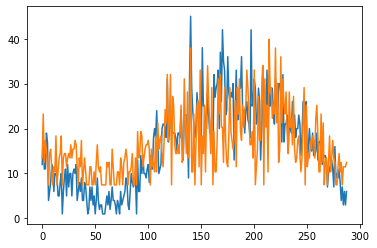

19799 1.0 0.0


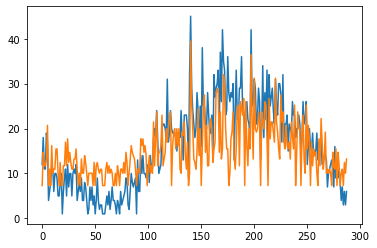

[[ 0.]
 [ 7.]
 [ 3.]
 [ 3.]
 [ 5.]
 [15.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 9.]
 [ 1.]
 [ 2.]
 [ 2.]
 [ 8.]
 [ 8.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 3.]
 [10.]
 [ 3.]
 [11.]
 [ 4.]
 [ 7.]
 [ 4.]
 [ 2.]
 [ 2.]
 [ 5.]
 [ 5.]
 [ 8.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 5.]
 [ 1.]
 [ 1.]
 [ 6.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 3.]
 [ 4.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 4.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 4.]
 [ 1.]
 [ 7.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 5.]
 [ 9.]
 [ 7.]
 [ 6.]
 [ 5.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 1.]
 [11.]
 [ 9.]
 [11.]
 [ 7.]
 [ 9.]
 [ 6.]
 [ 0.]
 [ 2.]
 [ 6.]
 [ 1.]
 [ 3.]
 [ 1.]
 [16.]
 [ 3.]
 [11.]
 [19.]
 [ 3.]
 [ 7.]
 [ 7.]
 [ 9.]
 [18.]
 [ 3.]
 [ 5.]
 [ 7.]
 [14.]
 [10.]
 [14.]
 [17.]
 [19.]
 [ 0.]
 [ 9.]
 [13.]
 [14.]
 [ 8.]
 [14.]
 [ 9.]
 [14.]
 [ 2.]
 [ 1.]
 [13.]
 [12.]
 [16.]
 [ 6.]
 [ 2.]
 [10.]
 [ 0.]
 [ 1.]
 [40.]
 [21.]
 [14.]

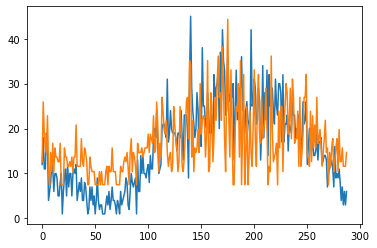

19999 0.0 1.0


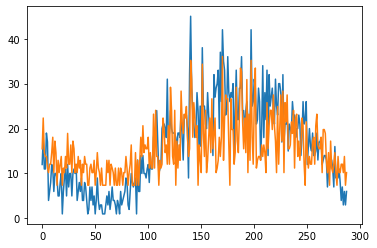

20099 1.0 0.0


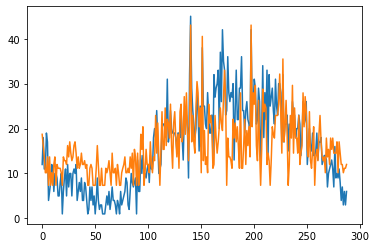

[[11.]
 [ 8.]
 [ 5.]
 [ 1.]
 [ 1.]
 [ 5.]
 [ 0.]
 [ 5.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 5.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 5.]
 [ 4.]
 [ 4.]
 [ 3.]
 [ 8.]
 [ 5.]
 [ 9.]
 [ 6.]
 [ 4.]
 [ 5.]
 [ 8.]
 [ 9.]
 [ 6.]
 [ 2.]
 [ 5.]
 [ 2.]
 [ 3.]
 [ 6.]
 [ 3.]
 [ 3.]
 [ 4.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 8.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 6.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 5.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 5.]
 [ 2.]
 [ 6.]
 [ 0.]
 [ 7.]
 [ 5.]
 [ 0.]
 [ 6.]
 [ 0.]
 [ 1.]
 [11.]
 [ 7.]
 [13.]
 [ 0.]
 [ 1.]
 [ 7.]
 [ 3.]
 [ 3.]
 [ 1.]
 [ 9.]
 [ 3.]
 [ 1.]
 [ 5.]
 [ 4.]
 [16.]
 [ 6.]
 [14.]
 [ 5.]
 [ 0.]
 [ 7.]
 [17.]
 [ 7.]
 [ 7.]
 [18.]
 [ 8.]
 [15.]
 [14.]
 [10.]
 [19.]
 [ 8.]
 [ 2.]
 [14.]
 [17.]
 [10.]
 [ 5.]
 [11.]
 [ 2.]
 [17.]
 [19.]
 [ 9.]
 [11.]
 [21.]
 [11.]
 [22.]
 [13.]
 [ 4.]
 [14.]
 [40.]
 [ 9.]
 [16.]

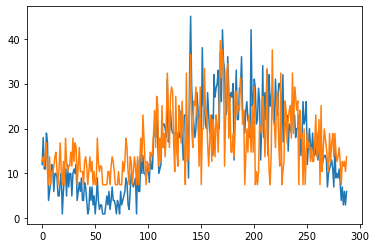

20299 1.0 0.0


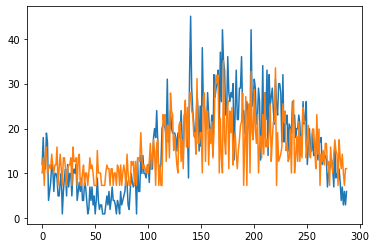

[[ 1.]
 [ 5.]
 [ 0.]
 [ 6.]
 [ 8.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 2.]
 [ 6.]
 [ 3.]
 [ 1.]
 [ 3.]
 [ 3.]
 [ 8.]
 [ 0.]
 [ 2.]
 [ 6.]
 [ 2.]
 [ 0.]
 [ 5.]
 [ 5.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 3.]
 [ 5.]
 [ 0.]
 [ 8.]
 [ 4.]
 [ 4.]
 [ 5.]
 [ 0.]
 [ 5.]
 [ 6.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 5.]
 [ 2.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 7.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 6.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 3.]
 [ 4.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 5.]
 [ 5.]
 [ 4.]
 [12.]
 [ 5.]
 [ 2.]
 [ 3.]
 [ 2.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 4.]
 [ 9.]
 [ 2.]
 [ 6.]
 [10.]
 [ 7.]
 [ 0.]
 [ 9.]
 [10.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 0.]
 [17.]
 [14.]
 [17.]
 [ 4.]
 [14.]
 [14.]
 [ 5.]
 [23.]
 [18.]
 [17.]
 [ 7.]
 [11.]
 [ 7.]
 [ 3.]
 [ 1.]
 [14.]
 [15.]
 [ 4.]
 [10.]
 [ 2.]
 [16.]
 [21.]
 [ 8.]
 [19.]
 [ 8.]
 [23.]
 [23.]
 [18.]
 [17.]

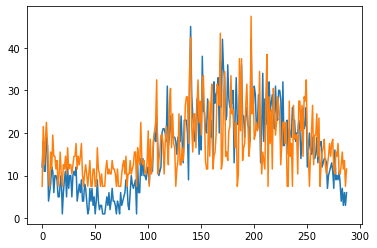

20499 0.0 1.0


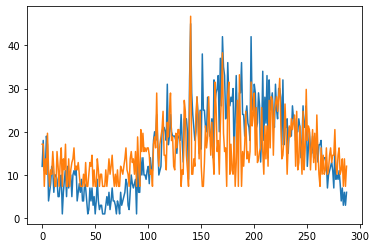

20599 0.96875 0.0


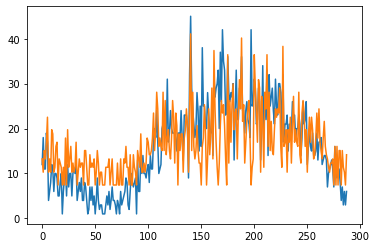

[[ 4.]
 [ 1.]
 [ 6.]
 [ 4.]
 [ 8.]
 [14.]
 [ 1.]
 [ 4.]
 [ 1.]
 [11.]
 [10.]
 [ 1.]
 [ 2.]
 [ 7.]
 [ 8.]
 [ 0.]
 [ 4.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 9.]
 [ 0.]
 [11.]
 [ 2.]
 [ 4.]
 [ 7.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 2.]
 [ 8.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 2.]
 [ 3.]
 [ 3.]
 [ 0.]
 [ 6.]
 [ 6.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 2.]
 [ 3.]
 [ 2.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 6.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 2.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 3.]
 [ 7.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 5.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 6.]
 [ 4.]
 [ 2.]
 [10.]
 [ 1.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 3.]
 [ 9.]
 [ 8.]
 [ 5.]
 [ 5.]
 [ 6.]
 [ 9.]
 [15.]
 [ 6.]
 [11.]
 [20.]
 [16.]
 [ 7.]
 [ 9.]
 [ 7.]
 [ 6.]
 [20.]
 [ 6.]
 [18.]
 [ 5.]
 [ 9.]
 [11.]
 [ 6.]
 [ 4.]
 [ 9.]
 [18.]
 [14.]
 [ 3.]
 [15.]
 [12.]
 [ 0.]
 [10.]
 [ 6.]
 [10.]
 [10.]
 [ 1.]
 [ 9.]
 [11.]
 [16.]
 [12.]
 [ 1.]
 [16.]
 [34.]
 [ 6.]
 [20.]

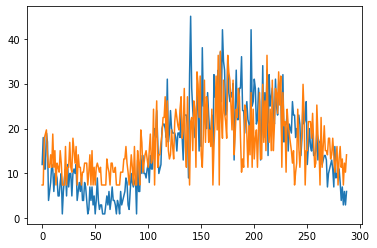

20799 1.0 0.0


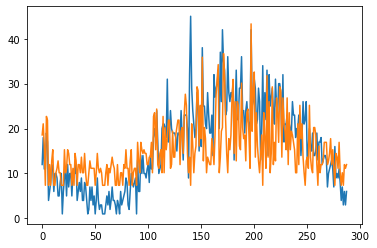

[[11.]
 [14.]
 [ 8.]
 [ 0.]
 [16.]
 [15.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 4.]
 [ 7.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 4.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 7.]
 [ 1.]
 [ 2.]
 [ 7.]
 [ 6.]
 [ 3.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 6.]
 [ 4.]
 [ 0.]
 [ 3.]
 [ 3.]
 [ 1.]
 [ 5.]
 [ 1.]
 [ 1.]
 [ 6.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 2.]
 [ 2.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 6.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 3.]
 [ 5.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 7.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 4.]
 [ 7.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 9.]
 [ 4.]
 [ 1.]
 [ 9.]
 [ 7.]
 [ 6.]
 [ 7.]
 [ 6.]
 [ 6.]
 [ 3.]
 [ 3.]
 [ 5.]
 [ 5.]
 [ 9.]
 [ 1.]
 [16.]
 [17.]
 [ 7.]
 [18.]
 [ 3.]
 [ 2.]
 [ 6.]
 [ 7.]
 [ 1.]
 [16.]
 [ 1.]
 [13.]
 [ 7.]
 [10.]
 [15.]
 [15.]
 [ 2.]
 [ 3.]
 [12.]
 [ 5.]
 [ 5.]
 [11.]
 [13.]
 [15.]
 [15.]
 [ 3.]
 [12.]
 [13.]
 [ 6.]
 [17.]
 [22.]
 [19.]
 [ 6.]
 [ 1.]
 [ 5.]
 [ 0.]
 [14.]
 [ 8.]

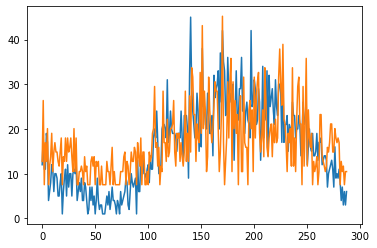

20999 1.0 0.0


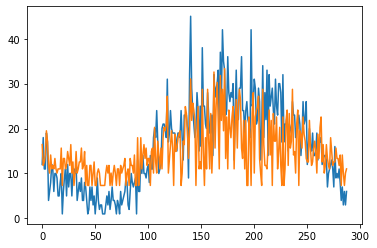

[[ 9.]
 [ 3.]
 [ 4.]
 [ 6.]
 [13.]
 [10.]
 [ 3.]
 [ 1.]
 [ 6.]
 [ 2.]
 [ 3.]
 [ 2.]
 [ 5.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 2.]
 [ 2.]
 [ 8.]
 [ 0.]
 [ 5.]
 [ 5.]
 [ 2.]
 [ 3.]
 [ 7.]
 [ 5.]
 [ 3.]
 [ 9.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 7.]
 [ 1.]
 [ 2.]
 [ 4.]
 [ 4.]
 [ 8.]
 [ 2.]
 [ 3.]
 [ 7.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 5.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 5.]
 [ 3.]
 [ 3.]
 [ 1.]
 [ 6.]
 [ 0.]
 [ 0.]
 [11.]
 [ 0.]
 [ 1.]
 [11.]
 [ 2.]
 [ 6.]
 [ 9.]
 [ 5.]
 [ 8.]
 [ 3.]
 [ 5.]
 [ 5.]
 [ 0.]
 [ 7.]
 [ 8.]
 [ 1.]
 [14.]
 [ 4.]
 [ 1.]
 [10.]
 [ 6.]
 [ 2.]
 [ 8.]
 [ 2.]
 [11.]
 [14.]
 [13.]
 [15.]
 [23.]
 [ 1.]
 [ 5.]
 [ 9.]
 [13.]
 [ 8.]
 [ 0.]
 [12.]
 [ 7.]
 [ 8.]
 [11.]
 [12.]
 [13.]
 [ 0.]
 [ 1.]
 [10.]
 [ 9.]
 [20.]
 [18.]
 [13.]
 [ 5.]
 [13.]
 [28.]
 [16.]
 [21.]

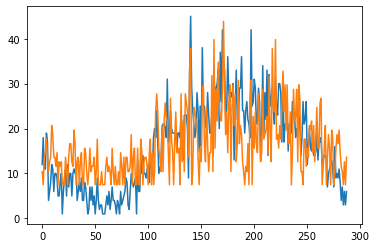

21199 0.0 1.0


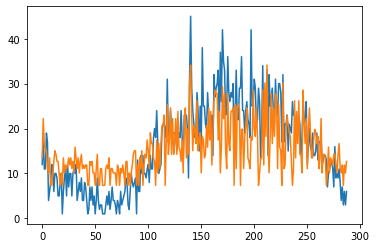

21299 0.9166666865348816 0.0


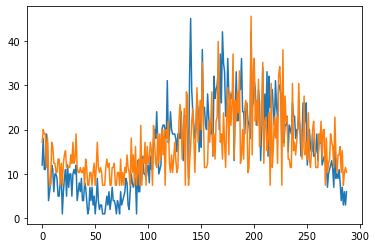

[[ 8.]
 [11.]
 [10.]
 [10.]
 [ 2.]
 [ 9.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 8.]
 [ 7.]
 [ 3.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 4.]
 [ 4.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 3.]
 [ 5.]
 [ 6.]
 [ 2.]
 [ 2.]
 [ 2.]
 [ 2.]
 [ 5.]
 [ 3.]
 [ 8.]
 [ 3.]
 [ 4.]
 [10.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 4.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 8.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 4.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 5.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 9.]
 [ 1.]
 [ 5.]
 [ 0.]
 [ 7.]
 [ 0.]
 [ 2.]
 [ 4.]
 [ 0.]
 [12.]
 [ 0.]
 [ 4.]
 [ 3.]
 [ 8.]
 [ 0.]
 [ 7.]
 [ 3.]
 [ 4.]
 [ 8.]
 [ 6.]
 [ 0.]
 [12.]
 [ 8.]
 [ 3.]
 [ 2.]
 [10.]
 [ 3.]
 [10.]
 [ 4.]
 [11.]
 [ 5.]
 [11.]
 [ 0.]
 [11.]
 [ 9.]
 [13.]
 [ 3.]
 [ 1.]
 [ 5.]
 [ 1.]
 [ 4.]
 [ 8.]
 [ 4.]
 [ 1.]
 [ 2.]
 [13.]
 [17.]
 [14.]
 [ 4.]
 [10.]
 [16.]
 [ 0.]
 [20.]
 [19.]
 [ 0.]
 [ 3.]
 [ 7.]
 [13.]
 [16.]

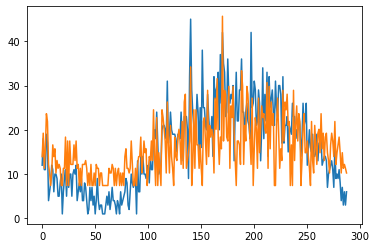

21499 0.96875 0.0


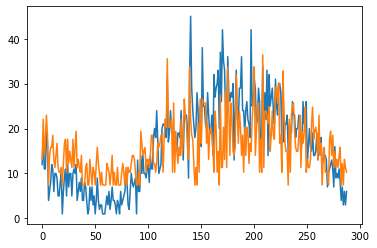

[[ 4.]
 [14.]
 [ 5.]
 [ 9.]
 [15.]
 [10.]
 [ 0.]
 [ 5.]
 [ 7.]
 [ 7.]
 [10.]
 [ 4.]
 [ 2.]
 [ 5.]
 [ 8.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 8.]
 [ 9.]
 [ 1.]
 [ 9.]
 [ 3.]
 [ 6.]
 [ 4.]
 [ 2.]
 [ 9.]
 [ 2.]
 [ 7.]
 [11.]
 [ 2.]
 [ 4.]
 [ 2.]
 [ 1.]
 [ 5.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 7.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 5.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 3.]
 [ 5.]
 [ 5.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [11.]
 [ 8.]
 [ 5.]
 [ 6.]
 [ 7.]
 [ 1.]
 [ 4.]
 [ 4.]
 [ 2.]
 [ 5.]
 [10.]
 [10.]
 [ 3.]
 [ 3.]
 [ 1.]
 [ 3.]
 [ 8.]
 [ 7.]
 [ 8.]
 [10.]
 [10.]
 [ 1.]
 [ 9.]
 [14.]
 [12.]
 [29.]
 [12.]
 [12.]
 [13.]
 [14.]
 [ 1.]
 [18.]
 [ 1.]
 [11.]
 [ 6.]
 [ 3.]
 [ 7.]
 [ 5.]
 [14.]
 [ 5.]
 [ 9.]
 [19.]
 [15.]
 [13.]
 [ 7.]
 [ 4.]
 [27.]
 [14.]
 [10.]
 [ 9.]

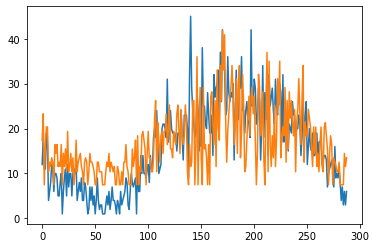

21699 1.0 0.0


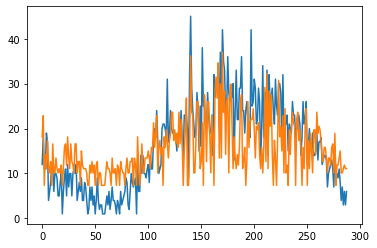

[[11.]
 [17.]
 [ 0.]
 [ 6.]
 [ 2.]
 [10.]
 [ 3.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 9.]
 [ 1.]
 [ 1.]
 [ 5.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 8.]
 [ 9.]
 [ 3.]
 [11.]
 [ 5.]
 [ 2.]
 [ 9.]
 [ 4.]
 [ 3.]
 [ 1.]
 [ 9.]
 [ 9.]
 [ 1.]
 [ 4.]
 [ 4.]
 [ 0.]
 [ 7.]
 [ 3.]
 [ 2.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 4.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 3.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 5.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 4.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 5.]
 [ 1.]
 [ 1.]
 [ 4.]
 [ 4.]
 [ 5.]
 [ 0.]
 [ 5.]
 [ 3.]
 [ 0.]
 [11.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 9.]
 [ 2.]
 [ 1.]
 [ 5.]
 [ 5.]
 [ 5.]
 [ 7.]
 [ 5.]
 [ 2.]
 [ 8.]
 [ 7.]
 [15.]
 [ 8.]
 [12.]
 [17.]
 [ 1.]
 [ 8.]
 [10.]
 [ 6.]
 [ 8.]
 [ 0.]
 [11.]
 [ 8.]
 [13.]
 [ 9.]
 [ 5.]
 [10.]
 [12.]
 [18.]
 [18.]
 [10.]
 [13.]
 [ 9.]
 [12.]
 [ 8.]
 [18.]
 [ 9.]
 [16.]
 [10.]
 [ 0.]
 [ 7.]
 [13.]
 [22.]
 [ 0.]
 [ 0.]
 [ 7.]
 [34.]
 [18.]
 [17.]

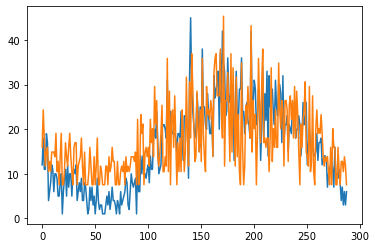

21899 1.0 0.0


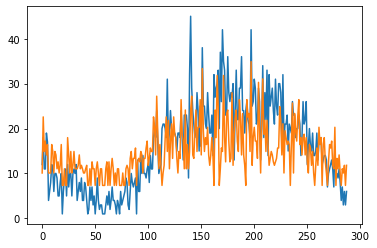

[[ 1.]
 [17.]
 [ 7.]
 [10.]
 [ 6.]
 [ 9.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 9.]
 [ 7.]
 [ 1.]
 [ 7.]
 [ 6.]
 [ 2.]
 [ 4.]
 [ 1.]
 [ 3.]
 [ 9.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [11.]
 [ 6.]
 [ 1.]
 [ 7.]
 [ 1.]
 [ 3.]
 [ 7.]
 [ 2.]
 [ 2.]
 [ 2.]
 [ 3.]
 [ 6.]
 [ 2.]
 [ 3.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 4.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 4.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 2.]
 [ 5.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 5.]
 [ 7.]
 [ 2.]
 [ 5.]
 [ 5.]
 [ 8.]
 [ 0.]
 [ 4.]
 [ 5.]
 [ 4.]
 [ 7.]
 [ 6.]
 [ 1.]
 [ 5.]
 [ 5.]
 [ 8.]
 [10.]
 [ 3.]
 [ 5.]
 [ 8.]
 [ 7.]
 [ 7.]
 [17.]
 [14.]
 [ 6.]
 [23.]
 [12.]
 [ 2.]
 [ 9.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 3.]
 [11.]
 [17.]
 [ 7.]
 [16.]
 [ 2.]
 [10.]
 [15.]
 [ 5.]
 [17.]
 [12.]
 [11.]
 [ 5.]
 [ 1.]
 [ 7.]
 [ 5.]
 [22.]
 [12.]
 [10.]
 [ 2.]
 [19.]
 [ 2.]
 [ 9.]
 [ 2.]
 [ 7.]
 [19.]
 [23.]
 [ 6.]

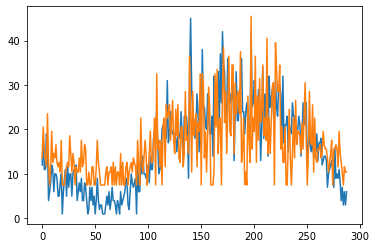

22099 0.0 1.0


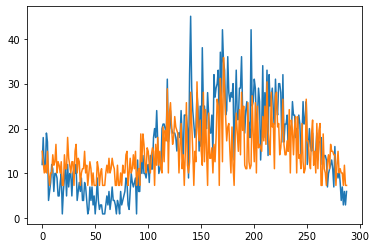

22199 0.96875 0.0


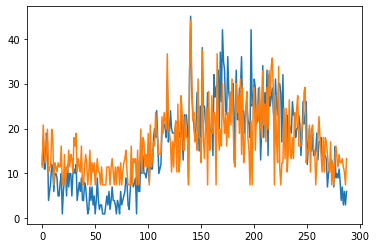

[[ 2.]
 [12.]
 [ 6.]
 [ 3.]
 [ 5.]
 [11.]
 [ 1.]
 [ 2.]
 [ 2.]
 [11.]
 [ 9.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 2.]
 [ 7.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 6.]
 [ 2.]
 [ 5.]
 [ 4.]
 [ 1.]
 [ 9.]
 [ 7.]
 [10.]
 [ 1.]
 [ 4.]
 [ 2.]
 [ 1.]
 [ 7.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 5.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 6.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 4.]
 [ 6.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 7.]
 [ 0.]
 [ 4.]
 [ 3.]
 [ 4.]
 [ 0.]
 [ 6.]
 [ 0.]
 [ 3.]
 [11.]
 [ 1.]
 [ 9.]
 [ 8.]
 [ 2.]
 [ 5.]
 [ 2.]
 [10.]
 [ 0.]
 [12.]
 [ 2.]
 [ 4.]
 [ 8.]
 [ 7.]
 [15.]
 [11.]
 [ 8.]
 [ 5.]
 [ 5.]
 [ 5.]
 [14.]
 [10.]
 [15.]
 [13.]
 [11.]
 [29.]
 [12.]
 [10.]
 [ 8.]
 [ 1.]
 [ 8.]
 [ 2.]
 [11.]
 [13.]
 [ 1.]
 [17.]
 [ 1.]
 [ 4.]
 [19.]
 [15.]
 [ 6.]
 [ 6.]
 [14.]
 [ 9.]
 [ 9.]
 [ 0.]
 [25.]
 [37.]
 [23.]
 [13.]

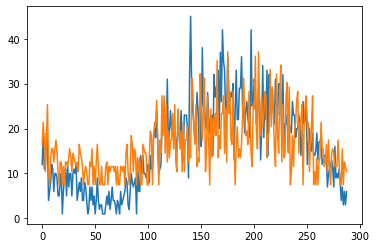

22399 1.0 0.0


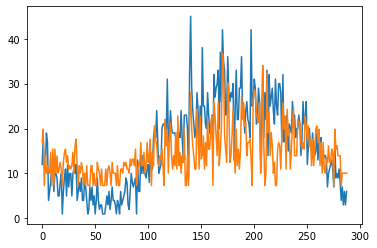

[[10.]
 [14.]
 [ 0.]
 [ 6.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 1.]
 [ 7.]
 [ 0.]
 [ 8.]
 [ 0.]
 [ 8.]
 [ 1.]
 [ 6.]
 [ 1.]
 [ 2.]
 [ 4.]
 [ 2.]
 [ 0.]
 [ 4.]
 [ 7.]
 [ 8.]
 [ 4.]
 [ 6.]
 [ 2.]
 [ 3.]
 [ 2.]
 [ 3.]
 [ 7.]
 [ 1.]
 [ 9.]
 [11.]
 [ 3.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 4.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 4.]
 [ 3.]
 [ 4.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 5.]
 [ 3.]
 [ 5.]
 [ 5.]
 [ 3.]
 [ 8.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 3.]
 [10.]
 [ 3.]
 [ 3.]
 [ 7.]
 [ 1.]
 [ 3.]
 [10.]
 [ 4.]
 [ 6.]
 [11.]
 [ 0.]
 [ 7.]
 [ 3.]
 [15.]
 [11.]
 [ 9.]
 [ 4.]
 [ 3.]
 [ 6.]
 [ 5.]
 [ 8.]
 [ 2.]
 [ 0.]
 [17.]
 [ 9.]
 [14.]
 [ 1.]
 [11.]
 [16.]
 [ 6.]
 [ 2.]
 [ 6.]
 [ 3.]
 [13.]
 [ 2.]
 [18.]
 [ 3.]
 [ 7.]
 [ 1.]
 [ 6.]
 [ 4.]
 [14.]
 [ 0.]
 [ 0.]
 [ 6.]
 [ 0.]
 [18.]
 [25.]
 [14.]
 [ 9.]

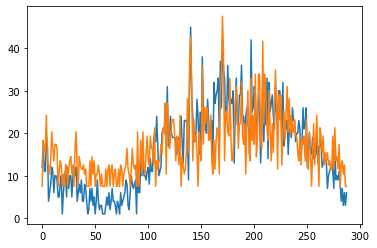

22599 0.0 1.0


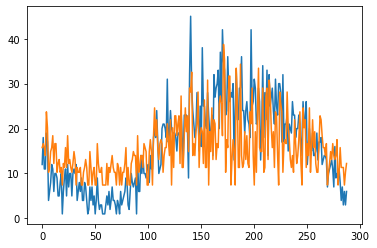

22699 1.0 0.0


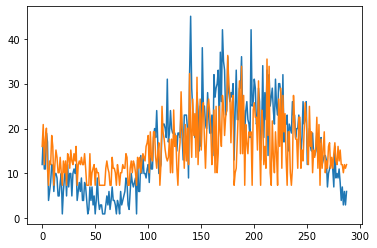

[[ 8.]
 [14.]
 [ 3.]
 [10.]
 [13.]
 [ 2.]
 [ 0.]
 [ 4.]
 [ 3.]
 [11.]
 [ 8.]
 [ 0.]
 [ 3.]
 [ 7.]
 [ 5.]
 [ 1.]
 [ 1.]
 [ 5.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 6.]
 [ 5.]
 [ 2.]
 [ 7.]
 [ 4.]
 [ 3.]
 [ 6.]
 [ 4.]
 [ 8.]
 [ 0.]
 [ 3.]
 [ 4.]
 [ 3.]
 [ 5.]
 [ 3.]
 [ 3.]
 [ 6.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 6.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 4.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 2.]
 [ 6.]
 [ 5.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 4.]
 [ 1.]
 [ 4.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 5.]
 [ 2.]
 [ 5.]
 [ 1.]
 [ 4.]
 [ 6.]
 [ 5.]
 [ 4.]
 [ 8.]
 [ 9.]
 [11.]
 [ 1.]
 [12.]
 [ 5.]
 [ 4.]
 [12.]
 [12.]
 [ 5.]
 [ 2.]
 [ 6.]
 [ 9.]
 [ 0.]
 [ 3.]
 [19.]
 [12.]
 [10.]
 [ 7.]
 [ 5.]
 [ 4.]
 [ 5.]
 [10.]
 [ 1.]
 [10.]
 [ 1.]
 [18.]
 [ 8.]
 [11.]
 [ 2.]
 [ 0.]
 [ 6.]
 [ 9.]
 [23.]
 [13.]
 [10.]
 [ 2.]
 [14.]
 [ 4.]
 [13.]
 [ 3.]
 [28.]
 [13.]
 [ 5.]
 [21.]

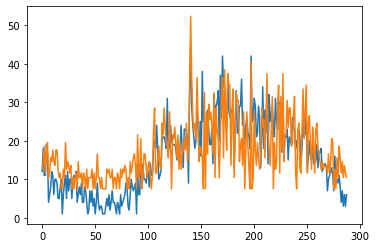

22899 0.0 1.0


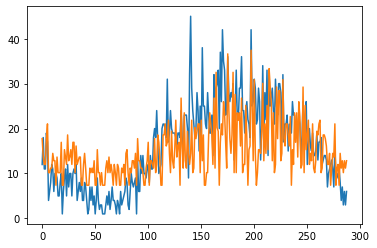

22999 0.96875 0.0


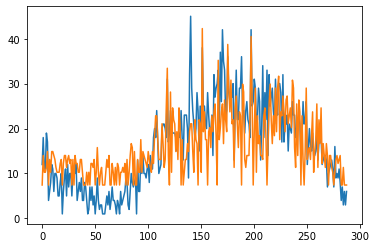

[[ 0.]
 [ 5.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 6.]
 [ 0.]
 [ 4.]
 [ 1.]
 [ 6.]
 [ 6.]
 [ 5.]
 [ 4.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 3.]
 [ 4.]
 [ 0.]
 [ 3.]
 [ 5.]
 [ 5.]
 [ 2.]
 [ 4.]
 [ 5.]
 [ 3.]
 [ 4.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 5.]
 [ 3.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 4.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 3.]
 [ 2.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 7.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 2.]
 [ 5.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 5.]
 [ 8.]
 [ 7.]
 [ 0.]
 [ 6.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 1.]
 [ 1.]
 [ 9.]
 [ 1.]
 [ 6.]
 [ 5.]
 [ 4.]
 [ 3.]
 [ 2.]
 [ 6.]
 [ 4.]
 [ 2.]
 [ 1.]
 [ 6.]
 [ 3.]
 [10.]
 [15.]
 [15.]
 [ 9.]
 [ 4.]
 [ 4.]
 [ 4.]
 [13.]
 [ 8.]
 [ 2.]
 [ 4.]
 [17.]
 [27.]
 [ 5.]
 [ 0.]
 [21.]
 [ 1.]
 [17.]
 [14.]
 [13.]
 [ 6.]
 [11.]
 [ 4.]
 [17.]
 [13.]
 [ 0.]
 [ 9.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 4.]
 [ 8.]
 [ 6.]
 [11.]
 [13.]
 [13.]
 [ 6.]

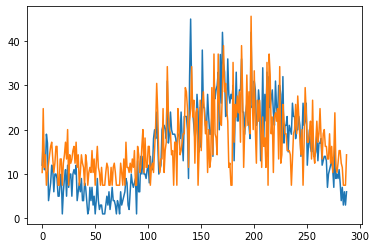

23199 1.0 0.0


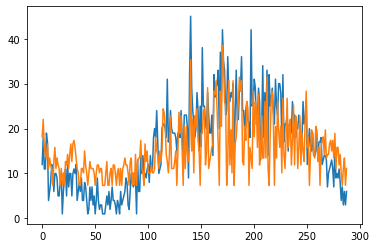

[[11.]
 [16.]
 [ 8.]
 [ 6.]
 [ 5.]
 [ 9.]
 [ 2.]
 [ 5.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 4.]
 [ 8.]
 [ 2.]
 [ 5.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 3.]
 [ 6.]
 [ 2.]
 [ 6.]
 [ 9.]
 [ 4.]
 [ 9.]
 [10.]
 [ 8.]
 [ 5.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 7.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 2.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 3.]
 [ 1.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 5.]
 [ 3.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 5.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 6.]
 [ 0.]
 [ 4.]
 [ 5.]
 [ 5.]
 [10.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 9.]
 [ 4.]
 [ 7.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 2.]
 [11.]
 [ 7.]
 [ 6.]
 [ 2.]
 [ 7.]
 [ 4.]
 [ 7.]
 [19.]
 [18.]
 [14.]
 [ 6.]
 [ 4.]
 [ 1.]
 [ 6.]
 [17.]
 [ 2.]
 [ 2.]
 [ 2.]
 [ 4.]
 [ 7.]
 [ 0.]
 [ 7.]
 [18.]
 [12.]
 [17.]
 [ 7.]
 [ 0.]
 [14.]
 [ 2.]
 [14.]
 [ 6.]
 [ 4.]
 [ 9.]
 [33.]
 [ 7.]
 [16.]

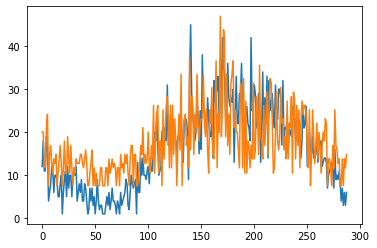

23399 1.0 0.0


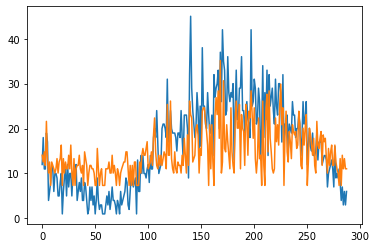

[[ 6.]
 [ 4.]
 [ 7.]
 [ 3.]
 [16.]
 [ 5.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 4.]
 [ 3.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 5.]
 [ 1.]
 [ 4.]
 [ 5.]
 [ 9.]
 [ 0.]
 [ 5.]
 [ 1.]
 [ 4.]
 [ 2.]
 [ 2.]
 [ 6.]
 [ 2.]
 [ 9.]
 [ 1.]
 [ 0.]
 [ 5.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 3.]
 [ 6.]
 [ 2.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 7.]
 [ 5.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 3.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 8.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 2.]
 [ 4.]
 [ 1.]
 [ 1.]
 [ 6.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 4.]
 [ 4.]
 [ 7.]
 [ 7.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 4.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 1.]
 [ 6.]
 [ 8.]
 [ 6.]
 [ 6.]
 [ 8.]
 [10.]
 [ 2.]
 [ 3.]
 [ 4.]
 [ 7.]
 [ 3.]
 [12.]
 [17.]
 [ 7.]
 [ 3.]
 [ 2.]
 [ 6.]
 [ 3.]
 [ 6.]
 [ 3.]
 [ 5.]
 [ 7.]
 [ 6.]
 [ 2.]
 [21.]
 [ 6.]
 [ 6.]
 [22.]
 [ 5.]
 [ 2.]
 [ 1.]
 [ 7.]
 [ 2.]
 [ 1.]
 [ 4.]
 [ 3.]
 [ 3.]
 [ 1.]
 [ 6.]
 [ 3.]
 [11.]
 [ 6.]
 [ 1.]
 [12.]
 [ 3.]
 [22.]
 [18.]
 [17.]
 [ 4.]

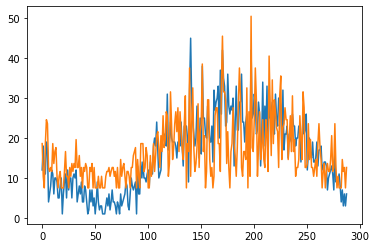

23599 0.0 1.0


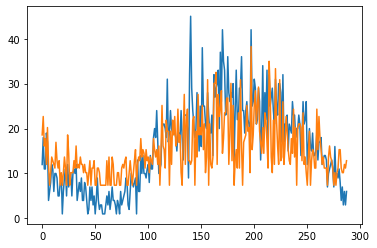

23699 0.96875 0.0


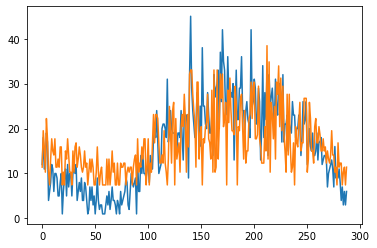

[[ 2.]
 [11.]
 [ 7.]
 [ 1.]
 [14.]
 [ 9.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 9.]
 [ 6.]
 [ 5.]
 [ 9.]
 [ 2.]
 [ 2.]
 [ 4.]
 [ 2.]
 [ 7.]
 [ 7.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 6.]
 [ 4.]
 [ 9.]
 [ 5.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 6.]
 [ 1.]
 [ 7.]
 [ 8.]
 [ 2.]
 [ 4.]
 [ 7.]
 [ 5.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 6.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 1.]
 [ 4.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 7.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 6.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 2.]
 [ 3.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 4.]
 [ 5.]
 [ 0.]
 [ 9.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 7.]
 [ 4.]
 [ 9.]
 [ 9.]
 [ 0.]
 [ 2.]
 [ 9.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 8.]
 [15.]
 [ 8.]
 [15.]
 [15.]
 [14.]
 [ 8.]
 [ 3.]
 [ 3.]
 [ 5.]
 [ 3.]
 [11.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 4.]
 [17.]
 [11.]
 [ 3.]
 [16.]
 [18.]
 [ 0.]
 [14.]
 [ 4.]
 [ 6.]
 [ 8.]
 [ 1.]
 [12.]
 [15.]
 [12.]
 [20.]
 [14.]
 [ 1.]
 [15.]
 [ 7.]
 [25.]
 [26.]
 [26.]
 [20.]

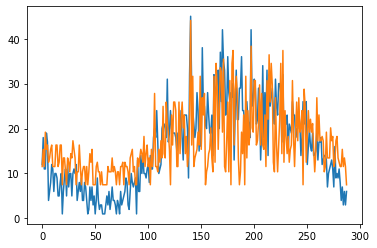

23899 1.0 0.0


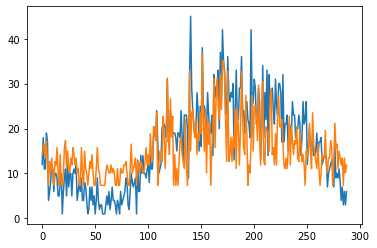

[[ 6.]
 [ 8.]
 [ 9.]
 [ 5.]
 [10.]
 [ 3.]
 [ 0.]
 [ 4.]
 [ 1.]
 [ 5.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 3.]
 [ 8.]
 [ 1.]
 [ 0.]
 [ 6.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 8.]
 [10.]
 [ 2.]
 [ 7.]
 [ 2.]
 [ 1.]
 [ 5.]
 [ 3.]
 [ 8.]
 [ 6.]
 [ 3.]
 [ 5.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 8.]
 [ 1.]
 [ 0.]
 [ 7.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 2.]
 [ 6.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 8.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 3.]
 [ 3.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 9.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 5.]
 [ 0.]
 [ 4.]
 [ 4.]
 [ 1.]
 [ 4.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 4.]
 [ 8.]
 [ 3.]
 [ 6.]
 [ 3.]
 [12.]
 [ 6.]
 [ 4.]
 [14.]
 [14.]
 [10.]
 [18.]
 [ 0.]
 [ 3.]
 [ 7.]
 [ 7.]
 [ 4.]
 [17.]
 [12.]
 [ 2.]
 [11.]
 [28.]
 [12.]
 [ 6.]
 [22.]
 [11.]
 [17.]
 [ 0.]
 [ 6.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 3.]
 [10.]
 [11.]
 [ 6.]
 [ 4.]
 [ 2.]
 [16.]
 [ 3.]
 [ 0.]
 [ 6.]
 [30.]
 [ 7.]
 [18.]
 [19.]

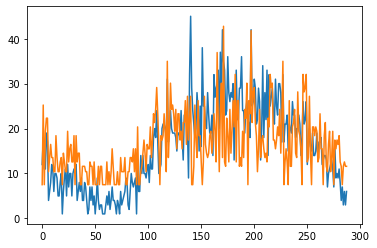

24099 0.0 1.0


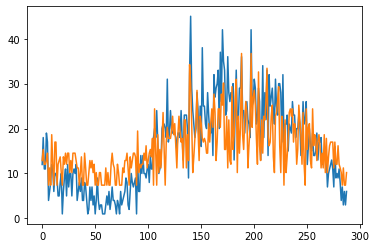

24199 0.9166666865348816 0.0


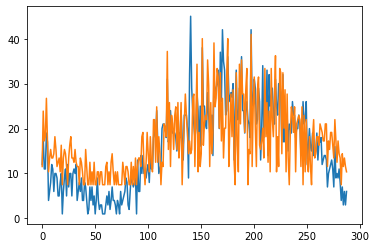

[[ 2.]
 [15.]
 [ 8.]
 [ 9.]
 [18.]
 [ 8.]
 [ 1.]
 [ 4.]
 [ 6.]
 [ 4.]
 [ 4.]
 [ 5.]
 [ 9.]
 [ 6.]
 [ 2.]
 [ 3.]
 [ 4.]
 [ 1.]
 [ 7.]
 [ 0.]
 [ 4.]
 [ 6.]
 [ 5.]
 [ 2.]
 [ 0.]
 [ 4.]
 [ 7.]
 [ 9.]
 [ 4.]
 [ 4.]
 [ 3.]
 [ 6.]
 [ 3.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 4.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 6.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 5.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 2.]
 [ 4.]
 [ 4.]
 [ 2.]
 [ 9.]
 [10.]
 [ 2.]
 [ 0.]
 [ 3.]
 [10.]
 [ 5.]
 [ 1.]
 [ 9.]
 [ 3.]
 [ 1.]
 [13.]
 [13.]
 [ 3.]
 [16.]
 [ 3.]
 [ 9.]
 [ 5.]
 [ 0.]
 [ 3.]
 [ 2.]
 [12.]
 [11.]
 [ 9.]
 [29.]
 [ 6.]
 [17.]
 [ 2.]
 [14.]
 [12.]
 [ 6.]
 [14.]
 [16.]
 [ 6.]
 [17.]
 [ 4.]
 [ 9.]
 [17.]
 [ 0.]
 [ 7.]
 [12.]
 [19.]
 [14.]
 [10.]
 [ 5.]
 [ 8.]
 [ 5.]
 [ 6.]
 [18.]

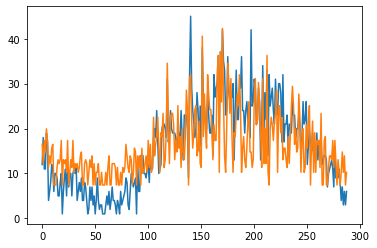

24399 1.0 0.0


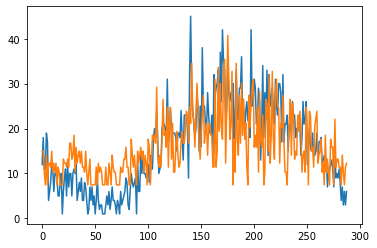

[[ 6.]
 [ 6.]
 [ 1.]
 [ 0.]
 [ 5.]
 [ 0.]
 [ 3.]
 [ 3.]
 [ 2.]
 [ 6.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 3.]
 [ 3.]
 [ 2.]
 [ 4.]
 [ 2.]
 [ 8.]
 [ 8.]
 [ 4.]
 [ 5.]
 [10.]
 [ 1.]
 [ 7.]
 [ 3.]
 [ 5.]
 [ 6.]
 [ 3.]
 [ 6.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 6.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 5.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 4.]
 [ 4.]
 [ 7.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 9.]
 [ 5.]
 [ 2.]
 [ 5.]
 [ 1.]
 [ 0.]
 [ 6.]
 [ 3.]
 [ 5.]
 [ 7.]
 [ 4.]
 [ 6.]
 [ 1.]
 [ 5.]
 [ 3.]
 [ 0.]
 [ 9.]
 [ 7.]
 [ 0.]
 [ 4.]
 [10.]
 [ 9.]
 [10.]
 [ 8.]
 [22.]
 [ 5.]
 [ 2.]
 [ 5.]
 [ 2.]
 [ 9.]
 [19.]
 [10.]
 [11.]
 [ 7.]
 [17.]
 [ 2.]
 [15.]
 [17.]
 [ 4.]
 [13.]
 [ 1.]
 [ 1.]
 [ 7.]
 [11.]
 [ 5.]
 [ 2.]
 [ 3.]
 [ 9.]
 [11.]
 [ 8.]
 [ 8.]
 [11.]
 [16.]
 [15.]
 [ 8.]
 [17.]
 [13.]
 [28.]
 [15.]

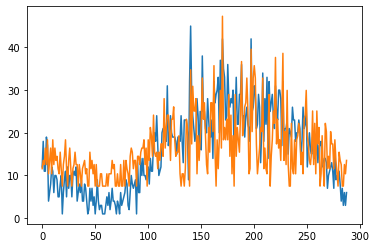

24599 1.0 0.0


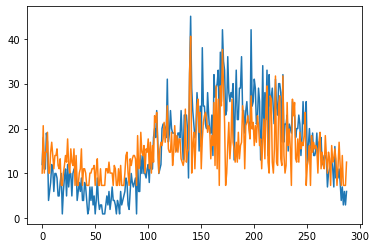

[[ 1.]
 [15.]
 [ 1.]
 [ 7.]
 [ 7.]
 [13.]
 [ 1.]
 [ 1.]
 [ 7.]
 [10.]
 [ 6.]
 [ 2.]
 [ 6.]
 [ 6.]
 [ 8.]
 [ 3.]
 [ 2.]
 [ 5.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 6.]
 [ 4.]
 [11.]
 [ 3.]
 [ 1.]
 [ 8.]
 [ 4.]
 [ 3.]
 [ 8.]
 [ 0.]
 [ 6.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 8.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 5.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 4.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 6.]
 [ 7.]
 [ 1.]
 [ 0.]
 [ 5.]
 [ 3.]
 [ 5.]
 [ 6.]
 [ 6.]
 [ 5.]
 [ 0.]
 [12.]
 [ 2.]
 [ 3.]
 [13.]
 [ 7.]
 [ 6.]
 [ 9.]
 [ 1.]
 [ 8.]
 [ 7.]
 [11.]
 [ 2.]
 [10.]
 [ 1.]
 [ 9.]
 [ 4.]
 [18.]
 [16.]
 [19.]
 [ 8.]
 [ 1.]
 [ 8.]
 [10.]
 [ 9.]
 [11.]
 [16.]
 [10.]
 [14.]
 [21.]
 [ 8.]
 [ 7.]
 [ 7.]
 [13.]
 [ 3.]
 [ 7.]
 [15.]
 [ 7.]
 [12.]
 [ 7.]
 [11.]
 [11.]
 [ 5.]
 [ 4.]
 [ 3.]
 [ 5.]
 [20.]
 [ 4.]
 [ 7.]
 [ 8.]
 [31.]
 [42.]
 [ 1.]
 [ 9.]

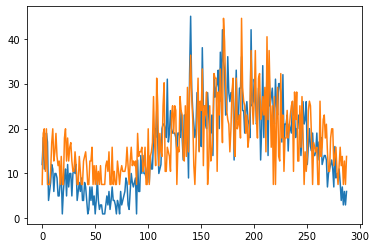

24799 0.0 1.0


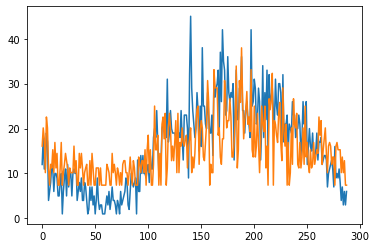

24899 0.96875 0.0


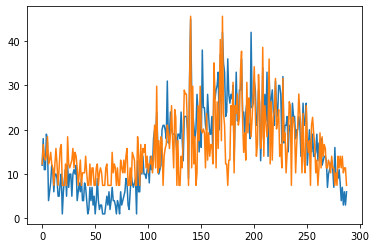

[[ 3.]
 [ 8.]
 [ 5.]
 [ 4.]
 [ 5.]
 [10.]
 [ 3.]
 [ 4.]
 [ 6.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 7.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 7.]
 [ 8.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 0.]
 [10.]
 [ 3.]
 [ 2.]
 [ 3.]
 [ 4.]
 [ 7.]
 [ 2.]
 [ 6.]
 [ 5.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 5.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 6.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 2.]
 [ 1.]
 [ 4.]
 [ 1.]
 [ 5.]
 [ 7.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 6.]
 [ 5.]
 [ 4.]
 [ 0.]
 [ 0.]
 [10.]
 [ 5.]
 [ 0.]
 [ 8.]
 [ 1.]
 [ 7.]
 [ 6.]
 [ 8.]
 [ 2.]
 [ 5.]
 [ 1.]
 [ 3.]
 [ 3.]
 [ 5.]
 [ 1.]
 [ 4.]
 [13.]
 [ 2.]
 [23.]
 [ 1.]
 [ 9.]
 [ 2.]
 [10.]
 [ 9.]
 [ 0.]
 [ 5.]
 [ 7.]
 [ 8.]
 [13.]
 [11.]
 [ 7.]
 [11.]
 [18.]
 [ 9.]
 [ 2.]
 [17.]
 [15.]
 [ 0.]
 [ 9.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 2.]
 [10.]
 [22.]
 [21.]
 [21.]
 [12.]
 [ 0.]
 [24.]
 [41.]
 [ 2.]
 [23.]

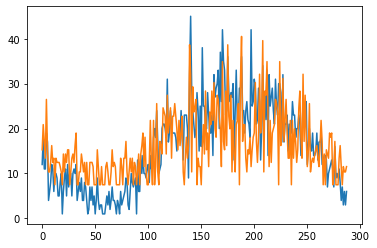

25099 1.0 0.0


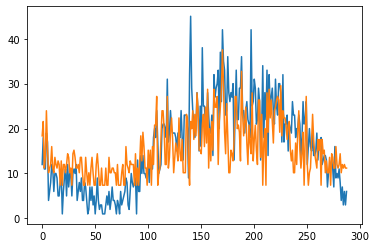

[[11.]
 [15.]
 [ 2.]
 [ 5.]
 [18.]
 [ 8.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 8.]
 [ 2.]
 [ 1.]
 [ 5.]
 [ 3.]
 [ 2.]
 [ 4.]
 [ 3.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 3.]
 [ 3.]
 [ 1.]
 [ 3.]
 [ 6.]
 [ 5.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 6.]
 [ 7.]
 [ 5.]
 [ 2.]
 [ 2.]
 [ 3.]
 [ 1.]
 [ 5.]
 [ 5.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 5.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 6.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 8.]
 [ 3.]
 [ 2.]
 [ 1.]
 [ 4.]
 [ 3.]
 [ 3.]
 [ 3.]
 [ 0.]
 [ 6.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 4.]
 [11.]
 [ 4.]
 [12.]
 [ 8.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 7.]
 [ 2.]
 [ 7.]
 [ 0.]
 [ 8.]
 [ 3.]
 [14.]
 [14.]
 [22.]
 [ 0.]
 [ 1.]
 [ 2.]
 [10.]
 [18.]
 [18.]
 [13.]
 [ 3.]
 [ 3.]
 [22.]
 [ 2.]
 [ 5.]
 [12.]
 [16.]
 [10.]
 [ 1.]
 [ 5.]
 [ 9.]
 [ 7.]
 [ 4.]
 [16.]
 [ 6.]
 [ 4.]
 [10.]
 [ 1.]
 [ 1.]
 [ 1.]
 [17.]
 [16.]
 [ 4.]
 [ 0.]
 [15.]
 [13.]
 [18.]

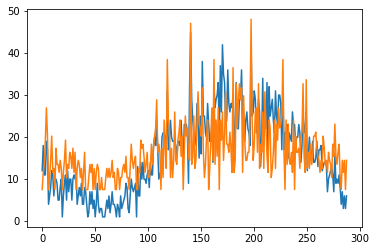

25299 0.0 1.0


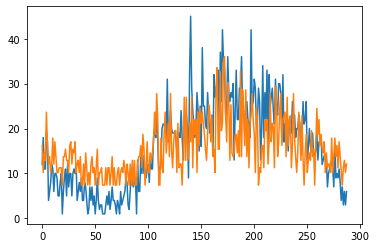

25399 0.84375 0.0


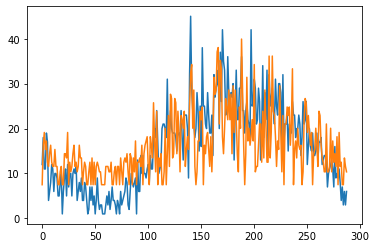

[[ 0.]
 [ 7.]
 [10.]
 [ 6.]
 [ 8.]
 [ 3.]
 [ 2.]
 [ 5.]
 [ 7.]
 [ 3.]
 [ 2.]
 [ 2.]
 [ 6.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 5.]
 [ 4.]
 [10.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 2.]
 [ 5.]
 [ 7.]
 [ 2.]
 [ 3.]
 [ 1.]
 [ 2.]
 [ 7.]
 [ 4.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 4.]
 [ 3.]
 [ 5.]
 [ 1.]
 [ 0.]
 [ 5.]
 [ 4.]
 [ 0.]
 [ 4.]
 [ 1.]
 [ 8.]
 [ 0.]
 [ 3.]
 [ 3.]
 [ 4.]
 [ 2.]
 [ 7.]
 [ 0.]
 [ 5.]
 [ 7.]
 [ 8.]
 [ 9.]
 [ 2.]
 [ 0.]
 [ 9.]
 [ 7.]
 [ 4.]
 [17.]
 [ 8.]
 [ 1.]
 [15.]
 [ 0.]
 [ 4.]
 [ 2.]
 [ 5.]
 [ 0.]
 [ 0.]
 [ 1.]
 [11.]
 [ 0.]
 [ 5.]
 [14.]
 [ 2.]
 [19.]
 [18.]
 [ 4.]
 [ 5.]
 [18.]
 [17.]
 [ 5.]
 [15.]
 [10.]
 [ 1.]
 [14.]
 [13.]
 [11.]
 [15.]
 [ 2.]
 [ 6.]
 [ 9.]
 [ 6.]
 [16.]
 [24.]
 [26.]
 [11.]

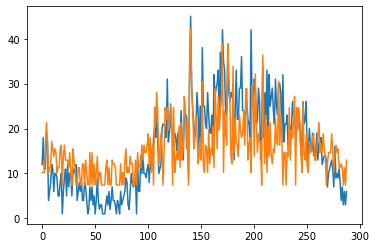

25599 0.96875 0.0


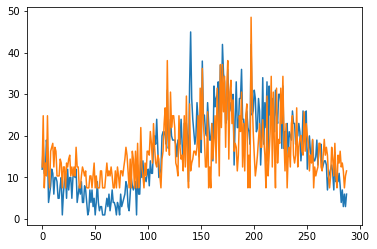

[[ 3.]
 [16.]
 [ 0.]
 [ 4.]
 [ 1.]
 [16.]
 [ 2.]
 [ 0.]
 [ 7.]
 [ 8.]
 [ 9.]
 [ 3.]
 [ 8.]
 [ 7.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 5.]
 [ 4.]
 [ 0.]
 [ 3.]
 [ 3.]
 [ 0.]
 [ 4.]
 [ 3.]
 [ 5.]
 [ 6.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 8.]
 [ 3.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 3.]
 [ 5.]
 [ 8.]
 [ 6.]
 [ 2.]
 [ 0.]
 [ 5.]
 [ 0.]
 [ 7.]
 [ 5.]
 [ 0.]
 [ 7.]
 [ 0.]
 [ 9.]
 [ 0.]
 [ 1.]
 [13.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 1.]
 [ 7.]
 [ 7.]
 [ 6.]
 [12.]
 [ 9.]
 [ 4.]
 [14.]
 [ 8.]
 [ 4.]
 [ 3.]
 [ 6.]
 [ 5.]
 [ 1.]
 [ 0.]
 [ 5.]
 [ 7.]
 [14.]
 [18.]
 [ 7.]
 [30.]
 [11.]
 [ 6.]
 [22.]
 [13.]
 [16.]
 [16.]
 [13.]
 [ 4.]
 [ 3.]
 [ 1.]
 [16.]
 [ 8.]
 [ 5.]
 [ 6.]
 [ 2.]
 [16.]
 [ 3.]
 [21.]
 [ 5.]
 [ 0.]
 [19.]
 [ 2.]
 [ 4.]
 [ 5.]

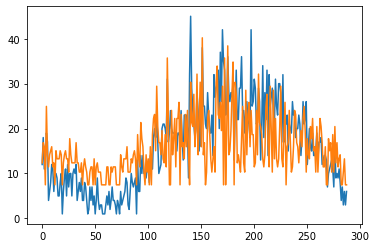

25799 1.0 0.0


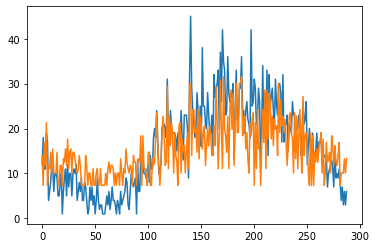

[[ 6.]
 [ 0.]
 [10.]
 [ 3.]
 [16.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 7.]
 [ 1.]
 [ 8.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 7.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 3.]
 [ 0.]
 [ 5.]
 [ 4.]
 [ 8.]
 [ 3.]
 [11.]
 [ 2.]
 [ 7.]
 [ 8.]
 [ 1.]
 [ 7.]
 [ 7.]
 [ 5.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 6.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 6.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 4.]
 [ 1.]
 [ 3.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 5.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 8.]
 [ 4.]
 [ 2.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 6.]
 [ 4.]
 [ 4.]
 [ 0.]
 [ 4.]
 [ 5.]
 [ 4.]
 [12.]
 [ 0.]
 [12.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 7.]
 [ 7.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 3.]
 [ 4.]
 [11.]
 [19.]
 [ 9.]
 [ 3.]
 [ 0.]
 [ 3.]
 [13.]
 [18.]
 [12.]
 [ 3.]
 [ 4.]
 [27.]
 [ 2.]
 [18.]
 [ 9.]
 [16.]
 [12.]
 [ 1.]
 [13.]
 [ 6.]
 [ 4.]
 [ 0.]
 [15.]
 [16.]
 [ 1.]
 [11.]
 [ 7.]
 [ 9.]
 [ 1.]
 [ 8.]
 [13.]
 [ 2.]
 [27.]
 [28.]
 [ 6.]
 [20.]

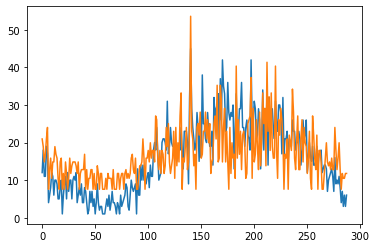

25999 0.0 1.0


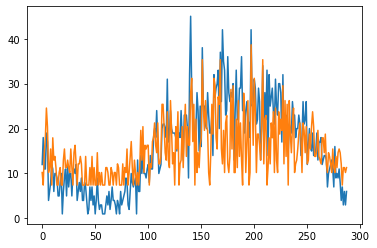

26099 1.0 0.0


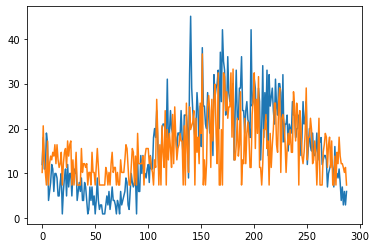

[[ 1.]
 [13.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 9.]
 [ 0.]
 [ 3.]
 [ 5.]
 [ 4.]
 [ 6.]
 [ 5.]
 [ 8.]
 [ 3.]
 [ 8.]
 [ 4.]
 [ 2.]
 [ 3.]
 [ 6.]
 [ 0.]
 [ 3.]
 [ 6.]
 [ 7.]
 [ 2.]
 [ 9.]
 [ 5.]
 [ 8.]
 [ 9.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 6.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 7.]
 [ 1.]
 [ 3.]
 [ 3.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 6.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 7.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 6.]
 [ 1.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 4.]
 [ 8.]
 [ 7.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 7.]
 [ 6.]
 [ 0.]
 [ 5.]
 [ 0.]
 [11.]
 [ 3.]
 [ 3.]
 [ 3.]
 [ 3.]
 [ 5.]
 [ 0.]
 [ 5.]
 [ 7.]
 [ 7.]
 [ 7.]
 [ 3.]
 [ 5.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 2.]
 [20.]
 [11.]
 [ 0.]
 [ 8.]
 [ 0.]
 [13.]
 [ 6.]
 [ 2.]
 [17.]
 [ 0.]
 [12.]
 [ 4.]
 [11.]
 [ 7.]
 [ 2.]
 [16.]
 [ 3.]
 [18.]
 [10.]
 [ 4.]
 [ 7.]
 [ 8.]
 [11.]
 [ 9.]
 [ 9.]
 [ 0.]
 [13.]
 [ 0.]
 [19.]
 [ 7.]
 [ 1.]
 [18.]
 [12.]
 [13.]
 [14.]

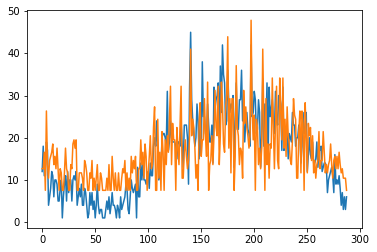

26299 1.0 0.0


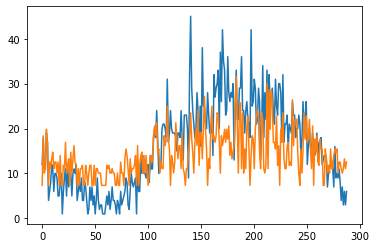

[[ 0.]
 [12.]
 [ 1.]
 [ 2.]
 [14.]
 [10.]
 [ 0.]
 [ 4.]
 [ 2.]
 [ 5.]
 [ 7.]
 [ 2.]
 [ 4.]
 [ 4.]
 [ 1.]
 [ 4.]
 [ 0.]
 [ 6.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 2.]
 [10.]
 [ 1.]
 [ 3.]
 [ 5.]
 [ 0.]
 [ 7.]
 [ 1.]
 [ 5.]
 [ 9.]
 [ 4.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 5.]
 [ 8.]
 [ 6.]
 [ 2.]
 [ 0.]
 [ 5.]
 [ 1.]
 [ 2.]
 [ 2.]
 [ 3.]
 [ 6.]
 [ 0.]
 [ 9.]
 [ 0.]
 [ 3.]
 [ 6.]
 [ 7.]
 [ 1.]
 [ 6.]
 [ 1.]
 [ 6.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 6.]
 [ 6.]
 [ 4.]
 [12.]
 [15.]
 [12.]
 [16.]
 [ 7.]
 [ 8.]
 [ 1.]
 [ 4.]
 [ 2.]
 [ 2.]
 [12.]
 [ 9.]
 [11.]
 [21.]
 [11.]
 [ 8.]
 [ 0.]
 [ 6.]
 [ 4.]
 [ 1.]
 [ 4.]
 [16.]
 [11.]
 [ 5.]
 [ 9.]
 [ 9.]
 [ 2.]
 [13.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 7.]
 [11.]
 [19.]
 [11.]
 [ 7.]

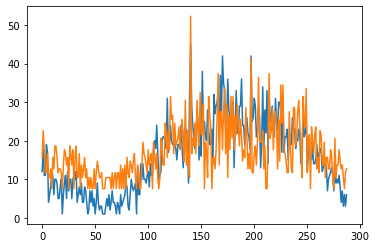

[[ 6.]
 [13.]
 [ 8.]
 [ 2.]
 [ 2.]
 [ 7.]
 [ 1.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 6.]
 [ 3.]
 [ 9.]
 [ 9.]
 [ 6.]
 [ 2.]
 [ 3.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 4.]
 [ 8.]
 [ 7.]
 [ 4.]
 [ 6.]
 [ 0.]
 [ 9.]
 [ 7.]
 [ 4.]
 [ 8.]
 [ 0.]
 [ 6.]
 [ 9.]
 [ 1.]
 [ 1.]
 [ 7.]
 [ 0.]
 [ 4.]
 [ 1.]
 [ 3.]
 [ 6.]
 [ 1.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 5.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 6.]
 [ 2.]
 [ 1.]
 [ 5.]
 [ 4.]
 [ 2.]
 [ 5.]
 [ 7.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 4.]
 [10.]
 [ 7.]
 [ 6.]
 [ 4.]
 [ 2.]
 [ 8.]
 [ 4.]
 [ 6.]
 [ 7.]
 [ 0.]
 [10.]
 [ 7.]
 [ 3.]
 [ 7.]
 [ 1.]
 [ 0.]
 [ 1.]
 [11.]
 [ 8.]
 [ 4.]
 [ 4.]
 [15.]
 [13.]
 [ 6.]
 [13.]
 [ 8.]
 [22.]
 [16.]
 [17.]
 [ 7.]
 [15.]
 [ 9.]
 [10.]
 [11.]
 [14.]
 [ 8.]
 [13.]
 [16.]
 [ 9.]
 [ 5.]
 [21.]
 [ 4.]
 [13.]
 [ 4.]
 [ 1.]
 [43.]
 [ 7.]
 [11.]

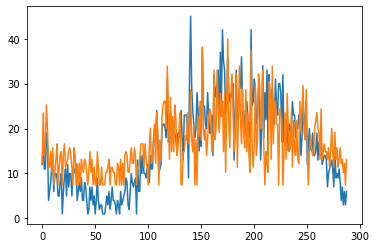

26599 1.0 0.0


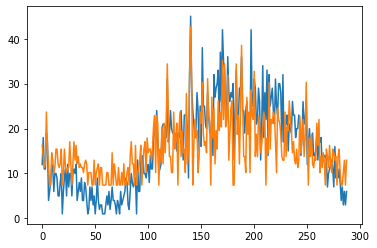

[[ 8.]
 [ 5.]
 [ 2.]
 [ 3.]
 [17.]
 [ 7.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 6.]
 [ 4.]
 [ 1.]
 [ 2.]
 [ 7.]
 [ 7.]
 [ 3.]
 [ 2.]
 [ 3.]
 [ 7.]
 [ 0.]
 [ 1.]
 [ 7.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 2.]
 [ 9.]
 [ 3.]
 [ 0.]
 [ 3.]
 [ 9.]
 [ 4.]
 [ 8.]
 [ 3.]
 [ 5.]
 [ 2.]
 [ 3.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 3.]
 [ 4.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 6.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 5.]
 [ 9.]
 [ 3.]
 [ 3.]
 [ 0.]
 [ 8.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 4.]
 [ 8.]
 [ 0.]
 [ 3.]
 [ 7.]
 [ 9.]
 [ 1.]
 [10.]
 [ 6.]
 [ 7.]
 [ 7.]
 [ 4.]
 [ 7.]
 [13.]
 [16.]
 [ 1.]
 [16.]
 [14.]
 [ 0.]
 [ 7.]
 [ 4.]
 [13.]
 [ 3.]
 [14.]
 [ 6.]
 [14.]
 [30.]
 [15.]
 [ 5.]
 [ 5.]
 [ 1.]
 [ 1.]
 [17.]
 [ 7.]
 [10.]
 [14.]
 [ 0.]
 [12.]
 [17.]
 [ 5.]
 [12.]
 [ 6.]
 [ 7.]
 [ 1.]
 [22.]
 [ 3.]
 [ 7.]
 [27.]
 [40.]
 [25.]
 [ 0.]

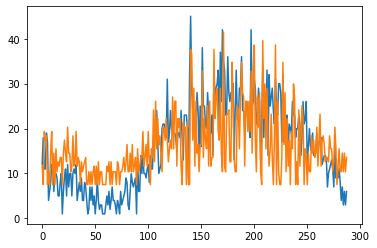

26799 0.96875 0.0


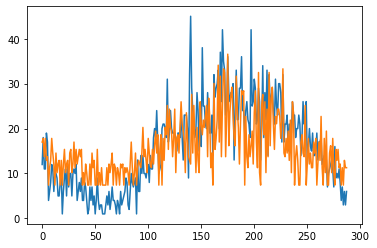

[[ 9.]
 [10.]
 [ 5.]
 [10.]
 [ 4.]
 [ 5.]
 [ 0.]
 [ 2.]
 [ 4.]
 [10.]
 [ 6.]
 [ 3.]
 [ 0.]
 [ 6.]
 [ 1.]
 [ 3.]
 [ 4.]
 [ 0.]
 [ 4.]
 [ 0.]
 [ 3.]
 [ 7.]
 [ 1.]
 [ 3.]
 [ 4.]
 [ 0.]
 [ 6.]
 [ 7.]
 [ 1.]
 [ 3.]
 [ 9.]
 [ 2.]
 [ 7.]
 [ 3.]
 [ 5.]
 [ 7.]
 [ 5.]
 [ 7.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 6.]
 [ 2.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 7.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 3.]
 [ 6.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 3.]
 [ 9.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 6.]
 [ 0.]
 [ 2.]
 [ 4.]
 [ 3.]
 [ 2.]
 [ 6.]
 [13.]
 [ 5.]
 [ 7.]
 [ 4.]
 [ 1.]
 [10.]
 [ 6.]
 [ 3.]
 [ 2.]
 [ 7.]
 [ 3.]
 [ 8.]
 [12.]
 [ 6.]
 [11.]
 [ 0.]
 [ 7.]
 [11.]
 [ 0.]
 [10.]
 [ 4.]
 [13.]
 [11.]
 [19.]
 [ 7.]
 [18.]
 [13.]
 [12.]
 [ 5.]
 [10.]
 [18.]
 [ 1.]
 [10.]
 [11.]
 [ 6.]
 [13.]
 [20.]
 [14.]
 [12.]
 [ 9.]
 [ 1.]
 [17.]
 [10.]
 [ 5.]
 [ 4.]
 [ 3.]
 [22.]
 [ 6.]

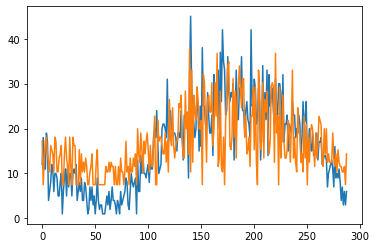

26999 0.0 1.0


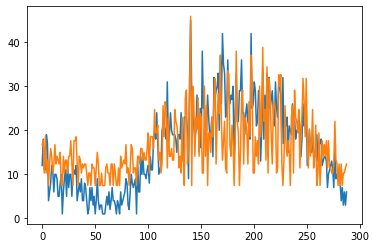

27099 0.7673611044883728 0.1388888955116272


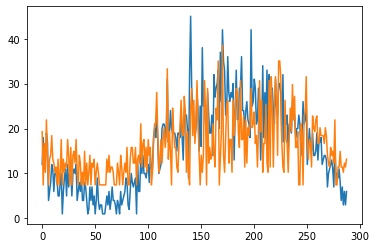

27199 0.0 1.0


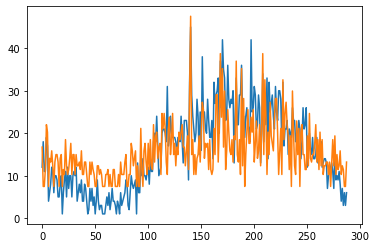

27299 0.9548611044883728 0.0


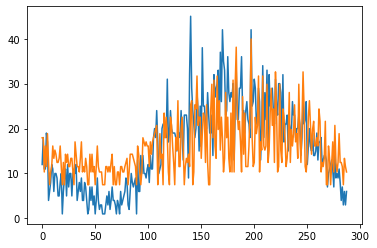

[[ 9.]
 [ 9.]
 [ 1.]
 [ 7.]
 [ 2.]
 [10.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 7.]
 [ 4.]
 [ 6.]
 [ 5.]
 [ 3.]
 [ 3.]
 [ 4.]
 [ 7.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 5.]
 [ 3.]
 [ 5.]
 [ 2.]
 [ 2.]
 [ 4.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 8.]
 [ 5.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 4.]
 [ 8.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 4.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 1.]
 [ 5.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 2.]
 [ 7.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 3.]
 [ 5.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 3.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 5.]
 [ 5.]
 [ 5.]
 [ 4.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 7.]
 [ 5.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 9.]
 [ 8.]
 [ 7.]
 [ 8.]
 [ 7.]
 [ 7.]
 [ 2.]
 [ 8.]
 [ 5.]
 [ 8.]
 [ 9.]
 [10.]
 [11.]
 [12.]
 [ 0.]
 [ 2.]
 [10.]
 [ 4.]
 [ 5.]
 [ 0.]
 [15.]
 [ 9.]
 [14.]
 [ 9.]
 [ 1.]
 [ 0.]
 [14.]
 [12.]
 [ 7.]
 [ 3.]
 [ 0.]
 [ 9.]
 [ 6.]
 [18.]
 [ 2.]
 [ 2.]
 [11.]
 [14.]
 [ 7.]
 [ 0.]
 [ 2.]
 [ 4.]
 [ 3.]
 [ 5.]
 [ 2.]
 [17.]
 [18.]
 [ 0.]

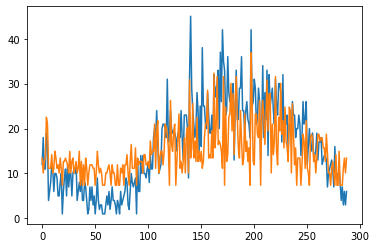

27499 0.96875 0.0


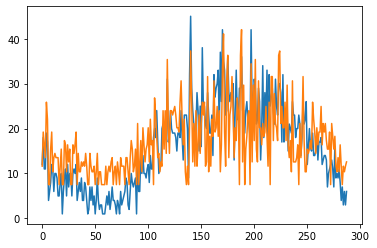

[[ 2.]
 [10.]
 [ 7.]
 [ 4.]
 [17.]
 [13.]
 [ 0.]
 [ 0.]
 [ 6.]
 [10.]
 [ 1.]
 [ 4.]
 [ 5.]
 [ 4.]
 [ 4.]
 [ 4.]
 [ 0.]
 [ 2.]
 [ 6.]
 [ 0.]
 [ 0.]
 [ 8.]
 [ 7.]
 [ 1.]
 [ 7.]
 [ 3.]
 [ 6.]
 [ 0.]
 [ 0.]
 [ 7.]
 [ 5.]
 [ 7.]
 [10.]
 [ 0.]
 [ 5.]
 [ 1.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 3.]
 [ 2.]
 [ 5.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 2.]
 [ 1.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 5.]
 [ 0.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 1.]
 [ 3.]
 [ 4.]
 [ 0.]
 [ 1.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 2.]
 [ 2.]
 [ 2.]
 [ 0.]
 [ 4.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 8.]
 [ 6.]
 [ 1.]
 [ 2.]
 [ 6.]
 [ 0.]
 [12.]
 [ 0.]
 [ 3.]
 [ 8.]
 [ 1.]
 [11.]
 [ 7.]
 [ 3.]
 [ 6.]
 [ 7.]
 [11.]
 [ 3.]
 [13.]
 [ 7.]
 [ 8.]
 [ 0.]
 [18.]
 [14.]
 [ 9.]
 [ 4.]
 [ 5.]
 [ 1.]
 [ 3.]
 [ 2.]
 [15.]
 [ 6.]
 [15.]
 [ 5.]
 [27.]
 [11.]
 [ 5.]
 [15.]
 [15.]
 [14.]
 [15.]
 [16.]
 [14.]
 [11.]
 [11.]
 [10.]
 [17.]
 [22.]
 [13.]
 [ 7.]
 [13.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 0.]
 [12.]
 [29.]
 [17.]
 [ 3.]

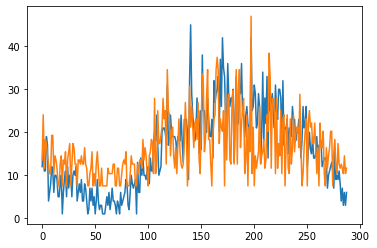

27699 1.0 0.0


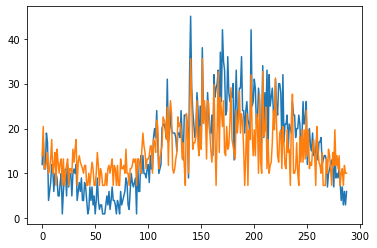

[[ 6.]
 [15.]
 [ 2.]
 [ 2.]
 [ 4.]
 [ 7.]
 [ 1.]
 [ 2.]
 [ 5.]
 [11.]
 [ 1.]
 [ 3.]
 [ 7.]
 [ 0.]
 [ 8.]
 [ 4.]
 [ 1.]
 [ 4.]
 [ 5.]
 [ 0.]
 [ 5.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 5.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 8.]
 [ 4.]
 [ 8.]
 [11.]
 [ 0.]
 [ 4.]
 [ 6.]
 [ 4.]
 [ 3.]
 [ 2.]
 [ 1.]
 [ 3.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 4.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 7.]
 [ 3.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 3.]
 [ 1.]
 [ 3.]
 [ 5.]
 [ 0.]
 [ 3.]
 [ 2.]
 [ 0.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 2.]
 [ 2.]
 [ 3.]
 [ 1.]
 [ 8.]
 [ 1.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 2.]
 [ 3.]
 [ 5.]
 [ 4.]
 [ 5.]
 [ 0.]
 [ 5.]
 [ 5.]
 [ 3.]
 [ 1.]
 [ 8.]
 [13.]
 [ 9.]
 [ 7.]
 [ 2.]
 [ 5.]
 [ 5.]
 [ 6.]
 [ 9.]
 [ 9.]
 [ 1.]
 [11.]
 [10.]
 [ 7.]
 [17.]
 [15.]
 [ 2.]
 [ 5.]
 [ 7.]
 [ 9.]
 [18.]
 [17.]
 [16.]
 [11.]
 [21.]
 [ 3.]
 [18.]
 [23.]
 [19.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 5.]
 [ 7.]
 [18.]
 [15.]
 [16.]
 [14.]
 [ 5.]
 [10.]
 [ 3.]
 [ 0.]
 [19.]
 [14.]
 [ 1.]
 [16.]
 [36.]
 [24.]
 [ 8.]

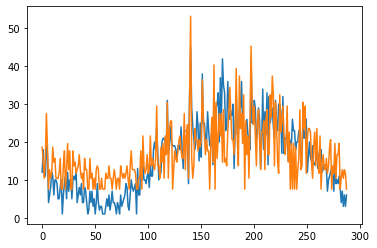

In [ ]:
# size of the latent space
latent_dim = 1
# create the discriminator
discriminator = define_discriminator()
# create the generator
generator = define_generator(latent_dim)
# create the gan
gan_model = define_gan(generator, discriminator)
# train model
train(generator, discriminator, gan_model, latent_dim)